#Hybrid Arima - LSTM code - Sentiment

The hybrid ARIMA-LSTM model is open to a variety of experimentation. For ideal performance, a balance must be reached between the levels of volatility that work best for the ARIMA and LSTM models. Using shorter MA periods that result in a non-mesokurtic distribution may achieve a better volatility balance between models.

## Import Libraries

In [1]:
import pandas as pd
pd.set_option('display.max_rows', 500)
import timeit


In [2]:
!pip install -q -U keras-tuner

     |████████████████████████████████| 98 kB 2.2 MB/s 


In [3]:
import keras_tuner as kt

In [4]:
!pip install pmdarima

     |████████████████████████████████| 1.4 MB 4.0 MB/s 
     |████████████████████████████████| 9.8 MB 53.2 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


In [5]:
import pmdarima

In [6]:
url = 'https://launchpad.net/~mario-mariomedina/+archive/ubuntu/talib/+files'
!wget $url/libta-lib0_0.4.0-oneiric1_amd64.deb -qO libta.deb
!wget $url/ta-lib0-dev_0.4.0-oneiric1_amd64.deb -qO ta.deb
!dpkg -i libta.deb ta.deb
!pip install ta-lib
import talib

Selecting previously unselected package libta-lib0.
(Reading database ... 155222 files and directories currently installed.)
Preparing to unpack libta.deb ...
Unpacking libta-lib0 (0.4.0-oneiric1) ...
Selecting previously unselected package ta-lib0-dev.
Preparing to unpack ta.deb ...
Unpacking ta-lib0-dev (0.4.0-oneiric1) ...
Setting up libta-lib0 (0.4.0-oneiric1) ...
Setting up ta-lib0-dev (0.4.0-oneiric1) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...
Processing triggers for libc-bin (2.27-3ubuntu1.3) ...
/sbin/ldconfig.real: /usr/local/lib/python3.7/dist-packages/ideep4py/lib/libmkldnn.so.0 is not a symbolic link

     |████████████████████████████████| 268 kB 4.1 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for ta-lib: filename=TA_Lib-0.4.22-cp37-cp37m-linux_x86_64.whl size=1465678 sha256=e30f7378a610d3e51eca61144465b4448c74fd3201a00d7c01d205231af9dd04
  Stored in direc

In [7]:
import tensorflow
import statsmodels.tsa.api
import keras
import sklearn

In [8]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout, Bidirectional,BatchNormalization, Embedding, TimeDistributed, LeakyReLU, GRU
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

In [9]:
from keras.models import Sequential, load_model
from keras.layers import Dense, LSTM, Activation, Dropout
from keras import backend as K
from keras.utils.generic_utils import get_custom_objects
from keras.callbacks import ModelCheckpoint,EarlyStopping
from keras.regularizers import l1_l2

In [10]:
import math

In [11]:
from statsmodels.tsa.api import VAR
from statsmodels.tsa.statespace.varmax import VARMAX,VARMAXResults

In [12]:
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split


In [13]:
from matplotlib import pyplot


In [14]:
import json
import datetime
import pandas as pd
import numpy as np
import os
from scipy.stats import kurtosis
import pmdarima as pm
from pmdarima import auto_arima
from talib import abstract
import json
import matplotlib.pyplot as plt
# plt.rcParams.update({'font.size': 16})
from matplotlib.pyplot import figure
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed

In [15]:
from keras.utils.generic_utils import get_custom_objects
from tensorflow.keras.utils import plot_model

In [16]:
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)

Reference 1: https://towardsdatascience.com/time-series-forecasting-predicting-stock-prices-using-an-arima-model-2e3b3080bd70

## Load Data

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [40]:
cd drive/MyDrive/Stock price prediction/Generated datasets

/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction/Generated datasets


In [41]:
df = pd.read_csv("FULL_Data_google_COVID_bull_bear.csv",parse_dates=[0])
df.tail(10)

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,Date,search,COVID positiveIncrease,COVID deathIncrease,bull score,bear score,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
1592,1592,1781,1781,1781,150.199997,151.429993,150.059998,150.809998,150.809998,56787900.0,150.565717,148.423811,-1.137777,2.817933,154.059677,142.787944,150.767809,5.009368,93.428749,-0.061228,100.779503,-0.039111,103.599003,-0.022436,2021-11-09,19,112313,1258,0.119141,0.111328,NaN,NaN,NaN,NaN
1593,1593,1782,1782,1782,150.020004,150.130005,147.850006,147.919998,147.919998,65187100.0,150.417145,148.729049,-1.236913,2.144358,153.017766,144.440332,148.869268,4.989888,92.922909,-0.061683,99.694365,-0.039762,101.872301,-0.022657,2021-11-10,19,80301,1470,0.154297,0.109375,NaN,NaN,NaN,NaN
1594,1594,1783,1783,1783,148.960007,149.429993,147.679993,147.869995,147.869995,41000000.0,150.110001,149.060477,-1.165047,1.767475,152.595428,145.525526,148.203086,4.989548,92.416471,-0.062129,98.604584,-0.040391,100.137594,-0.022839,2021-11-11,19,94975,1662,0.102845,0.126915,NaN,NaN,NaN,NaN
1595,1595,1784,1784,1784,148.429993,150.399994,147.479996,149.990005,149.990005,63632600.0,149.895715,149.357144,-0.869308,1.420732,152.198608,146.515681,149.394365,5.003879,91.909483,-0.062566,97.510555,-0.040998,98.396260,-0.022980,2021-11-12,19,55499,797,0.157277,0.080595,NaN,NaN,NaN,NaN
1596,1596,1785,1785,1785,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-11-13,19,146529,2505,0.139459,0.083243,NaN,NaN,NaN,NaN
1597,1597,1786,1786,1786,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-11-14,19,40964,479,0.151261,0.100840,NaN,NaN,NaN,NaN
1598,1598,1787,1787,1787,150.369995,151.880005,149.429993,150.000000,150.000000,59222800.0,149.758571,149.602859,-0.907641,1.229694,152.062246,147.143471,149.798122,5.003946,91.401994,-0.062993,96.412672,-0.041581,96.649685,-0.023077,2021-11-15,22,30290,148,0.136737,0.109389,NaN,NaN,NaN,NaN
1599,1599,1788,1788,1788,149.940002,151.490005,149.339996,151.000000,151.000000,59256200.0,149.718571,149.814763,-0.791320,1.236243,152.287250,147.342277,150.599374,5.010635,90.894052,-0.063410,95.311334,-0.042140,94.899260,-0.023130,2021-11-16,22,138962,1294,0.135531,0.115385,NaN,NaN,NaN,NaN
1600,1600,1789,1789,1789,151.000000,155.000000,150.990005,153.490005,153.490005,88807000.0,150.154286,150.040002,-0.657719,1.467121,152.974245,147.105759,152.526461,5.027099,90.385704,-0.063817,94.206941,-0.042673,93.146378,-0.023135,2021-11-17,22,87626,1290,0.100870,0.126957,NaN,NaN,NaN,NaN
1601,1601,1790,1790,1790,153.710007,158.669998,153.050003,157.869995,157.869995,137659100.0,151.162857,150.450002,-0.609656,2.267825,154.985653,145.914351,156.088817,5.055417,89.877000,-0.064214,93.099895,-0.043179,91.392433,-0.023090,2021-11-18,22,111404,1637,0.145098,0.121569,NaN,NaN,NaN,NaN


In [122]:
cd ..

/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction


In [123]:
cd Archana - LSTM Hybrid/Outputs/sentiment

/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction/Archana - LSTM Hybrid/Outputs/sentiment


In [47]:
pd.to_datetime(df[np.isnan(df.Close)==True]['Date']).dt.day_name().head(5)

0    Saturday
1      Sunday
3     Tuesday
7    Saturday
8      Sunday
Name: Date, dtype: object

In [46]:
len(pd.to_datetime(df[np.isnan(df.Close)==True]['Date']).dt.day_name())

497

In [48]:
len(df)

1602

In [49]:
len(df) - len(pd.to_datetime(df[np.isnan(df.Close)==True]['Date']).dt.day_name())

1105

In [32]:
df.dropna(inplace=True)
len(df)

1080

In [51]:
pd.to_datetime(df[np.isnan(df.Close)==True]['Date']).dt.day_name().head(5)

0    Saturday
1      Sunday
3     Tuesday
7    Saturday
8      Sunday
Name: Date, dtype: object

In [52]:
df.head(5)

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,Date,search,COVID positiveIncrease,COVID deathIncrease,bull score,bear score,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
0,0,189,189,189,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017-07-01,17,0,0,0.000000,0.00,0.141086,0.147308,0.100437,0.101678
1,1,190,190,190,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017-07-02,17,0,0,0.200000,0.20,0.141930,0.147118,0.100488,0.100526
2,2,191,191,191,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,2017-07-03,15,0,0,0.666667,0.00,0.142778,0.146810,0.100537,0.099251
3,3,192,192,192,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017-07-04,15,0,0,0.000000,0.25,0.143631,0.146382,0.100585,0.097860
4,4,193,193,193,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,2017-07-05,15,0,0,0.400000,0.00,0.144487,0.145833,0.100630,0.096361


In [53]:
stock_col= list(df.columns)
stock_col = stock_col[4:len(stock_col)]

In [54]:
dataset_final = df[stock_col]

In [55]:
dataset_final.head(5)

,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,Date,search,COVID positiveIncrease,COVID deathIncrease,bull score,bear score,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017-07-01,17,0,0,0.000000,0.00,0.141086,0.147308,0.100437,0.101678
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017-07-02,17,0,0,0.200000,0.20,0.141930,0.147118,0.100488,0.100526
2,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,2017-07-03,15,0,0,0.666667,0.00,0.142778,0.146810,0.100537,0.099251
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017-07-04,15,0,0,0.000000,0.25,0.143631,0.146382,0.100585,0.097860
4,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,2017-07-05,15,0,0,0.400000,0.00,0.144487,0.145833,0.100630,0.096361


### Data Load for Experiments with Technical Indicators & Bull Bear

In [56]:
stock_col= list(df.columns)
stock_col1 = stock_col[4:len(stock_col)-9]
stock_col2 = stock_col[len(stock_col)-4:len(stock_col)]
for i in range(len(stock_col2)):
  stock_col1.append(stock_col2[i])
dataset_final = df[stock_col1]
dataset_final.head(5)

,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,Date,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017-07-01,0.141086,0.147308,0.100437,0.101678
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017-07-02,0.141930,0.147118,0.100488,0.100526
2,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,2017-07-03,0.142778,0.146810,0.100537,0.099251
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017-07-04,0.143631,0.146382,0.100585,0.097860
4,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,2017-07-05,0.144487,0.145833,0.100630,0.096361


In [57]:
# Set the date to datetime data
datetime_series = pd.to_datetime(dataset_final['Date'])
datetime_index = pd.DatetimeIndex(datetime_series.values)
dataset_final = dataset_final.set_index(datetime_index)
dataset_final = dataset_final.sort_values(by='Date')
dataset_final = dataset_final.drop(columns='Date')
dataset_final.head(5)

,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
2017-07-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.141086,0.147308,0.100437,0.101678
2017-07-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.141930,0.147118,0.100488,0.100526
2017-07-03,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,0.142778,0.146810,0.100537,0.099251
2017-07-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.143631,0.146382,0.100585,0.097860
2017-07-05,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,0.144487,0.145833,0.100630,0.096361


### Train & test Dataset for Multistep Process

In [59]:
# Get features and target
X_value = pd.DataFrame(dataset_final.iloc[:, :])
y_value = pd.DataFrame(dataset_final.iloc[:, 3])

In [60]:
y_value.head(5)

,Close
2017-07-01,NaN
2017-07-02,NaN
2017-07-03,35.875000
2017-07-04,NaN
2017-07-05,36.022499


In [61]:
# Normalized the data
X_scaler = MinMaxScaler(feature_range=(-1, 1))
y_scaler = MinMaxScaler(feature_range=(-1, 1))
X_scaler.fit(X_value)
y_scaler.fit(y_value)

MinMaxScaler(feature_range=(-1, 1))

In [62]:
X_scale_dataset = X_scaler.fit_transform(X_value)
y_scale_dataset = y_scaler.fit_transform(y_value)

In [63]:
X_scale_dataset.shape, y_scale_dataset.shape, 

((1602, 24), (1602, 1))

In [64]:
 X_value.shape[1]

24

### N Steps Definition

In [65]:
n_steps_in = 3
n_features = X_value.shape[1] #19 features
n_steps_out = 1


In [66]:
# Reshape the data
'''Set the data input steps and output steps, 
    we use 30 days data to predict 1 day price here, 
    reshape it to (None, input_step, number of features) used for LSTM input'''
# Get X/y dataset
def get_X_y(X_data, y_data):
    X = list()
    y = list()
    yc = list()

    length = len(X_data)
    for i in range(0, length, 1):
        # pdb.set_trace()
        X_value = X_data[i: i + n_steps_in][:, :]
        # print('[',i,': ',i,' + ',n_steps_in,'][:, :]')
        y_value = y_data[i + n_steps_in: i + (n_steps_in + n_steps_out)][:, 0]
        # print('[',i,' + ',n_steps_in,': ',i,' + (',n_steps_in,' + ',n_steps_out,')][:, 0]')
        yc_value = y_data[i: i + n_steps_in][:, :]
        if len(X_value) == 3 and len(y_value) == 1:
            X.append(X_value)
            y.append(y_value)
            yc.append(yc_value)

    return np.array(X), np.array(y), np.array(yc)

In [67]:
# get the train test predict index
def predict_index(dataset, X_train, n_steps_in, n_steps_out):

    # get the predict data (remove the in_steps days)
    train_predict_index = dataset.iloc[n_steps_in : X_train.shape[0] + n_steps_in + n_steps_out - 1, :].index
    test_predict_index = dataset.iloc[X_train.shape[0] + n_steps_in:, :].index

    return train_predict_index, test_predict_index


In [68]:
def mean_absolute_percentage_error(actual, prediction):
    actual = pd.Series(actual)
    prediction = pd.Series(prediction)
    return 100 * np.mean(np.abs((actual - prediction))/actual)

In [69]:
# Split train/test dataset
def split_train_test(data):
    train_size = round(len(X) * 0.75)
    data_train = data[0:train_size]
    data_test = data[train_size:]
    return data_train, data_test

In [70]:
# Get data and check shape
X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
# pdb.set_trace()
X_train, X_test, = split_train_test(X)
y_train, y_test, = split_train_test(y)
yc_train, yc_test, = split_train_test(yc)
index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

In [71]:
# %% --------------------------------------- Save dataset -----------------------------------------------------------------
print('X shape: ', X.shape)
print('y shape: ', y.shape)
print('X_train shape: ', X_train.shape)
print('y_train shape: ', y_train.shape)
print('y_c_train shape: ', yc_train.shape)
print('X_test shape: ', X_test.shape)
print('y_test shape: ', y_test.shape)
print('y_c_test shape: ', yc_test.shape)
print('index_train shape:', index_train.shape)
print('index_test shape:', index_test.shape)


X shape:  (1599, 3, 24)
y shape:  (1599, 1)
X_train shape:  (1199, 3, 24)
y_train shape:  (1199, 1)
y_c_train shape:  (1199, 3, 1)
X_test shape:  (400, 3, 24)
y_test shape:  (400, 1)
y_c_test shape:  (400, 3, 1)
index_train shape: (1199,)
index_test shape: (400,)


In [72]:
output_dim = y_train.shape[1]
output_dim

1

In [73]:
df = dataset_final.copy()

In [74]:
df.rename(columns={'Date':'date','Open':'open','Low':'low','Close':'close','Volume':'volume','High':'high'}, inplace = True)
df.reset_index(drop=True,inplace=True)

In [75]:
df.head(1)

,open,high,low,close,Adj Close,volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.141086,0.147308,0.100437,0.101678


In [76]:
# df.drop(['volume', 'MACD','20SD','logmomentum','absolute of 3 comp','angle of 3 comp','absolute of 6 comp','angle of 6 comp','absolute of 9 comp','angle of 9 comp'], axis='columns', inplace=True) # only keep columns that can help as residuals in Arima Hybrid

In [77]:
df.head(1)

,open,high,low,close,Adj Close,volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.141086,0.147308,0.100437,0.101678


### Train & Test Length

In [78]:
test_len = len(X_test)

In [79]:
train_len = len(X_train )

In [80]:
test_len, train_len

(400, 1199)

## Kurtosis Review

In [81]:
   # Initialize moving averages from Ta-Lib, store functions in dictionary
# talib_moving_averages = ['SMA', 'EMA', 'WMA', 'DEMA', 'KAMA', 'MIDPOINT', 'MIDPRICE', 'T3', 'TEMA', 'TRIMA'] remove midprice due to outputbeing univariate
talib_moving_averages = ['SMA', 'EMA', 'WMA', 'DEMA', 'KAMA', 'MIDPOINT',  'T3', 'TEMA', 'TRIMA'] 
functions = {}
for ma in talib_moving_averages:
      functions[ma] = abstract.Function(ma)

    # Determine kurtosis "K" values for MA period 4-30
kurtosis_results = {'period': []}
for i in range(4, 100): # 100
  kurtosis_results['period'].append(i)
  for ma in talib_moving_averages:
              # Run moving average, remove last N days (used later for test data set), trim MA result to last 30 days
              ma_output = functions[ma](df[:-test_len], i).tail(14)
              # Determine kurtosis "K" value
              k = kurtosis(ma_output, fisher=False)
              # add to dictionary
              if ma not in kurtosis_results.keys():
                  kurtosis_results[ma] = []
              kurtosis_results[ma].append(k)

kurtosis_results = pd.DataFrame(kurtosis_results)
kurtosis_results.to_csv('kurtosis_results.csv')

In [82]:
kurtosis_results.head(5)

,period,SMA,EMA,WMA,DEMA,KAMA,MIDPOINT,T3,TEMA,TRIMA
0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Optimized periods

In [83]:
# Determine period with K closest to 3 +/-5%
optimized_period = {}
# https://pypi.org/project/TA-Lib/ determines the type of moving average to use
# https://pandas.pydata.org/pandas-docs/version/0.17.0/generated/pandas.DataFrame.at.html#pandas.DataFrame.at
for ma in talib_moving_averages:
        difference = np.abs(kurtosis_results[ma] - 3)
        df_arimahyb = pd.DataFrame({'difference': difference, 'period': kurtosis_results['period']})
        df_arimahyb = df_arimahyb.sort_values(by=['difference'], ascending=True).reset_index(drop=True)
        if df_arimahyb.at[0, 'difference'] < 3 * 0.05:
            optimized_period[ma] = df_arimahyb.at[0, 'period']
        else:
            print(ma + ' is not viable, best K greater or less than 3 +/-5%')

print('\nOptimized periods:', optimized_period)

SMA is not viable, best K greater or less than 3 +/-5%
EMA is not viable, best K greater or less than 3 +/-5%
WMA is not viable, best K greater or less than 3 +/-5%
DEMA is not viable, best K greater or less than 3 +/-5%
KAMA is not viable, best K greater or less than 3 +/-5%
MIDPOINT is not viable, best K greater or less than 3 +/-5%
T3 is not viable, best K greater or less than 3 +/-5%
TEMA is not viable, best K greater or less than 3 +/-5%
TRIMA is not viable, best K greater or less than 3 +/-5%

Optimized periods: {}


In [84]:
optimized_period

{}

## Simulation Keys

In [ ]:
simulation = {}
for ma in optimized_period:
        print(ma)
        print(functions[ma])
        print ( int( optimized_period[ma]))
        # if ma in ['EMA','WMA','DEMA','KAMA','MIDPOINT']:
        #   print(ma)
        low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
        low_vol = low_vol.fillna(0)
        high_vol = pd.DataFrame()
        df2 = df.copy()
        for i in df2.columns:
          if i in low_vol.columns:
            high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Pa

In [ ]:
low_vol.tail(20)

,open,high,low,close,Adj Close,volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,search
1060,140.200839,141.942909,138.524500,140.171495,139.966842,8.852448e+07,142.165478,146.699207,1.815578,4.572948,155.845103,137.553312,140.365562,4.935800,105.739092,-0.047411,125.318767,-0.018291,140.471430,-0.008749,19.573385
1061,139.425914,141.705469,138.035200,140.698014,140.492650,8.620711e+07,141.528981,145.978836,2.115887,4.189393,154.357621,137.600050,140.587196,4.939545,105.263514,-0.048037,124.464999,-0.019222,139.335869,-0.009472,19.632022
1062,140.773058,142.636405,139.932338,141.733666,141.526843,7.421445e+07,141.294887,145.298477,2.211018,3.647690,152.593858,138.003097,141.351509,4.946870,104.786174,-0.048658,123.598217,-0.020150,138.164839,-0.010188,19.698090
1063,142.179695,143.266994,141.127848,142.249061,142.041527,6.519616e+07,141.224295,144.665584,2.093072,3.241276,151.148137,138.183031,141.949877,4.950518,104.307114,-0.049275,122.718682,-0.021074,136.959041,-0.010898,19.763505
1064,142.253947,144.008334,141.546689,142.555532,142.347589,6.254214e+07,141.336839,144.184381,1.988881,2.884864,149.954110,138.414652,142.353647,4.952685,103.826381,-0.049886,121.826667,-0.021994,135.719217,-0.011600,20.311676
1065,142.782738,143.732491,141.438660,142.125353,141.918068,6.542511e+07,141.385297,143.758659,1.774804,2.626682,149.012024,138.505294,142.201451,4.949632,103.344020,-0.050491,120.922446,-0.022909,134.446150,-0.012293,20.671514
1066,142.153085,142.656915,140.466684,141.564232,141.357788,7.040262e+07,141.585336,143.387397,1.634667,2.376817,148.141030,138.633764,141.776638,4.945637,102.860075,-0.051092,120.006305,-0.023818,133.140665,-0.012977,20.900131
1067,142.177201,143.194327,140.977156,142.610382,142.402435,6.948112e+07,141.933749,143.094536,1.573317,2.074153,147.242842,138.946230,142.332468,4.953023,102.374593,-0.051687,119.078535,-0.024722,131.803627,-0.013650,21.038585
1068,143.009006,144.052615,142.286776,143.812497,143.602819,6.805244e+07,142.378675,142.879716,1.473333,1.874158,146.628032,139.131400,143.319154,4.961467,101.887619,-0.052275,118.139433,-0.025618,130.435938,-0.014311,21.116168
1069,143.380322,145.547752,142.940349,145.397429,145.185452,7.592729e+07,142.902069,142.813890,1.447641,1.844159,146.502207,139.125573,144.704671,4.972505,101.399198,-0.052858,117.189304,-0.026508,129.038540,-0.014959,21.153587


In [ ]:
high_vol.head(10)

,open,high,low,close,Adj Close,volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,search
0,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,15.0
1,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,15.0
2,35.755001,35.875000,35.602501,35.682499,33.872143,96515200.0,35.984999,36.495238,0.346702,0.677629,37.850495,35.139980,35.784949,3.546235,38.027974,0.051918,30.209839,0.095602,43.557403,-0.053820,15.0
3,35.724998,36.187500,35.724998,36.044998,34.216255,76806800.0,36.001071,36.362023,0.387422,0.387634,37.137291,35.586756,35.958315,3.556633,37.818962,0.054401,30.470232,0.091907,43.662260,-0.053608,15.0
4,36.027500,36.487499,35.842499,36.264999,34.425095,84362400.0,35.973571,36.243809,0.388315,0.308042,36.859893,35.627725,36.162771,3.562891,37.613953,0.056893,30.735430,0.088177,43.752965,-0.053302,14.0
5,36.182499,36.462502,36.095001,36.382500,34.536625,79127200.0,36.039642,36.202738,0.372153,0.308860,36.820458,35.585018,36.309257,3.566217,37.412947,0.059392,31.005161,0.084416,43.829622,-0.052901,14.0
6,36.467499,36.544998,36.205002,36.435001,34.586472,99538000.0,36.101071,36.206547,0.317572,0.295861,36.798268,35.614826,36.393086,3.567700,37.215939,0.061899,31.279154,0.080632,43.892360,-0.052406,14.0
7,36.375000,37.122501,36.360001,36.942501,35.068211,100797600.0,36.253571,36.220595,0.322643,0.340687,36.901969,35.539221,36.759363,3.581920,37.022928,0.064410,31.557136,0.076830,43.941338,-0.051818,14.0
8,36.992500,37.332500,36.832500,37.259998,35.369610,80528400.0,36.430357,36.266785,0.257925,0.410484,37.087753,35.445818,37.093120,3.590715,36.833908,0.066926,31.838833,0.073014,43.976744,-0.051137,14.0
9,37.205002,37.724998,37.142502,37.389999,35.493000,95174000.0,36.674285,36.329523,0.184267,0.445597,37.220717,35.438330,37.291039,3.594294,36.648875,0.069445,32.123972,0.069192,43.998789,-0.050365,16.0


## Common Functions

In [77]:
def get_arima(dataframe,original_data, train_len, test_len):
    # prepare train and test data
    X_value = pd.DataFrame(dataframe.iloc[:, :])
    y_value = pd.DataFrame(dataframe.iloc[:, 3])
    X_train, X_test = split_train_test(X_value)
    y_train, y_test = split_train_test(y_value)
    yc_train,yc_test = split_train_test(original_data)
    # y_train_ = y_train['close'].to_list()
    # y_test_ = y_test['close'].to_list()
    yc = yc_test.values.tolist()
    y_train_list = y_train['close'].values.tolist() 
    y_test_list = y_test['close'].values.tolist()                                           
      
    # Initialize model
    model = auto_arima(y_train_list,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
                  suppress_warnings=True,stepwise=True,seasonal=True)
    print(model.summary())
        # Determine model parameters
    model.fit(y_train_list,disp= 0)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

        # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
            model = pmdarima.ARIMA(order=order)
            model.fit(y_train_list,disp= 0)
            # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')
            prediction.append(model.predict()[0])
            y_train_list.append(y_test_list[i])

    # Generate error data
    mse = mean_squared_error(yc_test, prediction)
    rmse = mse ** 0.5
    # mape = mean_absolute_percentage_error(pd.Series(yc_test).values.tolist(), pd.Series(predictionte).values.tolist() )
    mae = mean_absolute_error(pd.Series(yc_test).values.tolist() , pd.Series(prediction).values.tolist() )
    return yc, prediction, mse, rmse, mae

In [132]:
def plot_train(simulation,SIM):
  train_predict_index = np.load("index_train_appl.npy", allow_pickle=True)#Dates for train data

  predict_result = pd.DataFrame()
  for i in range(len(simulation[SIM]['final_tr']['prediction'])):
          y_predict = pd.DataFrame(simulation[SIM]['final_tr']['prediction'][i], columns=["predicted_price"],
                                  index=train_predict_index[i:i + output_dim])
          predict_result = pd.concat([predict_result, y_predict], axis=1, sort=False)
          
          #This is a dataframe with each column containing the predicted daily closing price
  real_price = pd.DataFrame()
  for i in range(len(simulation[SIM]['final_tr']['original'])):
          y_train = pd.DataFrame(simulation[SIM]['final_tr']['original'][i], columns=["real_price"],
                                index=train_predict_index[i:i + output_dim])
          real_price = pd.concat([real_price, y_train], axis=1, sort=False)  #This is a dataframe with each column containing the real daily closing price

  predict_result['predicted_mean'] = predict_result.mean(axis=1)#Adding a column with the daily predicted closing price value
  real_price['real_mean'] = real_price.mean(axis=1)#Adding a column with the daily real closing price value
      #
      # Plot the predicted result
  plt.figure(figsize=(16, 8))
  plt.plot(real_price["real_mean"])
  plt.plot(predict_result["predicted_mean"], color='r')
  plt.xlabel("Date")
  plt.ylabel("Stock price")
  plt.legend(("Real price", "Predicted price"), loc="upper left", fontsize=16)
  plt.title(f"The result of Training for Hybrid Arima LSTM with MA - {SIM} : {fileimg}",fontsize=20)
  sf = fileimg+'_'+SIM+'Train Hybrid Arima LSTM Pred Out.png'
  plt.savefig(sf,dpi='figure')
  plt.show()

      # Calculate RMSE
  predicted = predict_result["predicted_mean"]
  real = real_price["real_mean"]
  RMSE = np.sqrt(mean_squared_error(predicted, real))
  MSE = mean_squared_error(predicted, real)
  MAE = mean_absolute_error(predicted, real)
  print(f"----- Train RMSE for {SIM} -----", RMSE)
  print(f"----- Train_MSE_LSTM for {SIM} -----", MSE)
  print(f"----- Train MAE LSTM for {SIM} -----", MAE)

In [135]:
def plot_test(simulation, SIM):
  test_predict_index = np.load("index_test_appl.npy", allow_pickle=True)#Dates for train data

      # rescaled_real_y = y_scaler.inverse_transform(y_train)#Real closing price data
      # rescaled_predicted_y = y_scaler.inverse_transform(train_yhat)#Predicted closing price data

  predict_result = pd.DataFrame()
  for i in range(len(simulation[SIM]['final']['prediction'])):
          y_predict = pd.DataFrame(simulation[SIM]['final']['prediction'][i], columns=["predicted_price"],
                                  index=test_predict_index[i:i + output_dim])
          predict_result = pd.concat([predict_result, y_predict], axis=1, sort=False)#This is a dataframe with each column containing the predicted daily closing price
      #
  real_price = pd.DataFrame()
  for i in range(len(simulation[SIM]['final']['original'])):
          y_train = pd.DataFrame(simulation[SIM]['final']['original'][i], columns=["real_price"],
                                index=test_predict_index[i:i + output_dim])
          real_price = pd.concat([real_price, y_train], axis=1, sort=False)#This is a dataframe with each column containing the real daily closing price

  predict_result['predicted_mean'] = predict_result.mean(axis=1)#Adding a column with the daily predicted closing price value
  real_price['real_mean'] = real_price.mean(axis=1)#Adding a column with the daily real closing price value
      #
      # Plot the predicted result
  plt.figure(figsize=(16, 8))
  plt.plot(real_price["real_mean"])
  plt.plot(predict_result["predicted_mean"], color='r')
  plt.xlabel("Date")
  plt.ylabel("Stock price")
  plt.legend(("Real price", "Predicted price"), loc="upper left", fontsize=16)
  plt.title(f"The result of Testing for Hybrid Arima LSTM with MA - {SIM} : {fileimg}",fontsize=20)
  sf = fileimg+'_'+SIM+'Test Hybrid Arima LSTM Pred Out.png'
  plt.savefig(sf,dpi='figure')
  plt.show()

      # Calculate RMSE
  predicted = predict_result["predicted_mean"]
  real = real_price["real_mean"]
  RMSE = np.sqrt(mean_squared_error(predicted, real))
  MSE = mean_squared_error(predicted, real)
  MAE = mean_absolute_error(predicted, real)
  print(f"----- Test RMSE for {SIM}-----", RMSE)
  print(f"----- Test_MSE_LSTM for {SIM}-----", MSE)
  print(f"----- Test_MAE_LSTM for {SIM}-----", MAE)

In [10]:
def plot_train_high(simulation, SIM):
  train_predict_index = np.load("index_test_appl.npy", allow_pickle=True)#Dates for train data

  predict_result = pd.DataFrame()
  for i in range(len(simulation[SIM]['high_vol']['prediction'])):
          y_predict = pd.DataFrame(simulation[SIM]['high_vol']['prediction'][i], columns=["predicted_price"],
                                  index=train_predict_index[i:i + output_dim])
          predict_result = pd.concat([predict_result, y_predict], axis=1, sort=False)
          
          #This is a dataframe with each column containing the predicted daily closing price
  real_price = pd.DataFrame()
  for i in range(len(simulation[SIM]['high_vol']['original'])):
          y_train = pd.DataFrame(simulation[SIM]['high_vol']['original'][i], columns=["real_price"],
                                index=train_predict_index[i:i + output_dim])
          real_price = pd.concat([real_price, y_train], axis=1, sort=False)  #This is a dataframe with each column containing the real daily closing price

  predict_result['predicted_mean'] = predict_result.mean(axis=1)#Adding a column with the daily predicted closing price value
  real_price['real_mean'] = real_price.mean(axis=1)#Adding a column with the daily real closing price value
      #
      # Plot the predicted result
  plt.figure(figsize=(16, 8))
  plt.plot(real_price["real_mean"])
  plt.plot(predict_result["predicted_mean"], color='r')
  plt.xlabel("Date")
  plt.ylabel("Stock price")
  plt.legend(("Real price", "Predicted price"), loc="upper left", fontsize=16)
  plt.title(f"The result of Training for Hybrid Arima LSTM with MA {SIM}", fontsize=20)
  plt.show()

      # Calculate RMSE
  predicted = predict_result["predicted_mean"]
  real = real_price["real_mean"]
  RMSE = np.sqrt(mean_squared_error(predicted, real))
  MSE = mean_squared_error(predicted, real)
  MAE = mean_absolute_error(predicted, real)
  print(f"----- Individual LSTM RMSE for {SIM} -----", RMSE)
  print(f"----- Individual LSTM_MSE_LSTM for {SIM} -----", MSE)
  print(f"----- Individual LSTM MAE LSTM for {SIM} -----", MAE)

In [81]:
def plot_train_low(simulation , SIM):
  train_predict_index = np.load("index_test_appl.npy", allow_pickle=True)#Dates for train data

  predict_result = pd.DataFrame()
  for i in range(len(simulation[SIM]['low_vol']['prediction'])):
          y_predict = pd.DataFrame(simulation[SIM]['low_vol']['prediction'][i], columns=["predicted_price"],
                                  index=train_predict_index[i:i + output_dim])
          predict_result = pd.concat([predict_result, y_predict], axis=1, sort=False)
          
          #This is a dataframe with each column containing the predicted daily closing price
  real_price = pd.DataFrame()
  for i in range(len(simulation[SIM]['low_vol']['original'])):
          y_train = pd.DataFrame(simulation[SIM]['low_vol']['original'][i], columns=["real_price"],
                                index=train_predict_index[i:i + output_dim])
          real_price = pd.concat([real_price, y_train], axis=1, sort=False)  #This is a dataframe with each column containing the real daily closing price

  predict_result['predicted_mean'] = predict_result.mean(axis=1)#Adding a column with the daily predicted closing price value
  real_price['real_mean'] = real_price.mean(axis=1)#Adding a column with the daily real closing price value
      #
      # Plot the predicted result
  plt.figure(figsize=(16, 8))
  plt.plot(real_price["real_mean"])
  plt.plot(predict_result["predicted_mean"], color='r')
  plt.xlabel("Date")
  plt.ylabel("Stock price")
  plt.legend(("Real price", "Predicted price"), loc="upper left", fontsize=16)
  plt.title(f"The result of Training for {SIM}", fontsize=20)
  plt.show()

      # Calculate RMSE
  predicted = predict_result["predicted_mean"]
  real = real_price["real_mean"]
  RMSE = np.sqrt(mean_squared_error(predicted, real))
  MSE = mean_squared_error(predicted, real)
  MAE = mean_absolute_error(predicted, real)
  print(f"-----Arima RMSE for {SIM} -----", RMSE)
  print(f"----- Arima MSE for {SIM} -----", MSE)
  print(f"----- Arima MAE for {SIM} -----", MAE)

In [82]:
import os
os.getcwd()

'/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction/Archana - LSTM Hybrid/Outputs/sentiment'

## Univariate Arima Multistep MutiVariate LSTM Hybrid Model Experiment 1

In [83]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    model = Sequential()
    model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    model.add(Dense(units=64,activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(units=output_dim))
    model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    ## Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()


    # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 3
    # define custom activation
    # cts().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.54 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4157.020, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3687.148, Time=0.05 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.20 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3458.651, Time=0.08 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3322.133, Time=0.11 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.80 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.88 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3324.133, Time=0.22 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 2.922 seconds
                               SARIMAX Results                                
Dep.

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.16778, saving model to LSTM1.h5
48/48 - 3s - loss: 0.1712 - val_loss: 0.1678 - lr: 0.0010 - 3s/epoch - 62ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.16778
48/48 - 0s - loss: 0.1883 - val_loss: 0.3040 - lr: 0.0010 - 419ms/epoch - 9ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.16778
48/48 - 1s - loss: 0.0672 - val_loss: 0.5210 - lr: 0.0010 - 519ms/epoch - 11ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.16778
48/48 - 0s - loss: 0.0577 - val_loss: 0.2578 - lr: 0.0010 - 407ms/epoch - 8ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.16778 to 0.16001, saving model to LSTM1.h5
48/48 - 0s - loss: 0.0489 - val_loss: 0.1600 - lr: 0.0010 - 456ms/epoch - 9ms/step
Epoch 6/500

Epoch 00006: val_loss improved from 0.16001 to 0.07747, saving model to LSTM1.h5
48/48 - 0s - loss: 0.0417 - val_loss: 0.0775 - lr: 0.0010 - 478ms/epoch - 10ms/step
Epoch 7/500

Epoch 00007: val_lo

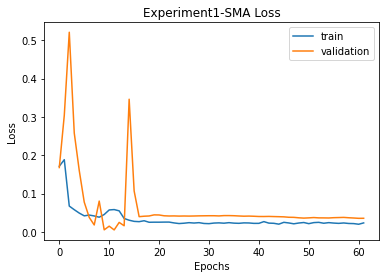


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 39.29635655476263 
RMSE:	 6.268680607174258 
MAPE:	 5.07416987111494
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.41 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4231.556, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3761.238, Time=0.05 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3532.227, Time=0.08 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3394.496, Time=0.10 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.91 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.65 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3396.496, Time=0.20 

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.25069, saving model to LSTM1.h5
16/16 - 2s - loss: 0.3653 - val_loss: 0.2507 - lr: 0.0010 - 2s/epoch - 106ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.25069 to 0.02507, saving model to LSTM1.h5
16/16 - 0s - loss: 0.1125 - val_loss: 0.0251 - lr: 0.0010 - 163ms/epoch - 10ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.02507
16/16 - 0s - loss: 0.0745 - val_loss: 0.2931 - lr: 0.0010 - 149ms/epoch - 9ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.02507
16/16 - 0s - loss: 0.0906 - val_loss: 0.0958 - lr: 0.0010 - 135ms/epoch - 8ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.02507
16/16 - 0s - loss: 0.0673 - val_loss: 0.0462 - lr: 0.0010 - 131ms/epoch - 8ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.02507
16/16 - 0s - loss: 0.0710 - val_loss: 0.0599 - lr: 0.0010 - 149ms/epoch - 9ms/step
Epoch 7/500

Epoch 00007: ReduceLROnPlateau reducing learning 

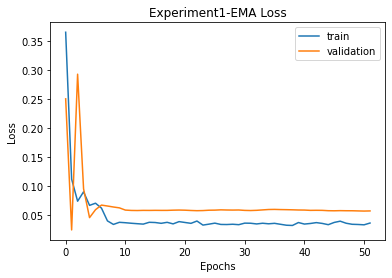


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 39.29635655476263 
RMSE:	 6.268680607174258 
MAPE:	 5.07416987111494

EMA
Prediction vs Close:		56.34% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 30.25057164247689 
RMSE:	 5.50005196725239 
MAPE:	 4.444486270049439
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.41 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4264.089, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3793.930, Time=0.05 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.25 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3564.923, Time=0.07 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3427.258, Time=0.08 sec
 ARIMA(3,3,1)(0,0,0)[0]    

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.07191, saving model to LSTM1.h5
17/17 - 2s - loss: 0.5361 - val_loss: 0.0719 - lr: 0.0010 - 2s/epoch - 121ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.07191 to 0.04083, saving model to LSTM1.h5
17/17 - 0s - loss: 0.2156 - val_loss: 0.0408 - lr: 0.0010 - 167ms/epoch - 10ms/step
Epoch 3/500

Epoch 00003: val_loss improved from 0.04083 to 0.03980, saving model to LSTM1.h5
17/17 - 0s - loss: 0.0759 - val_loss: 0.0398 - lr: 0.0010 - 174ms/epoch - 10ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.03980
17/17 - 0s - loss: 0.0752 - val_loss: 0.0900 - lr: 0.0010 - 197ms/epoch - 12ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.03980
17/17 - 0s - loss: 0.0786 - val_loss: 0.0610 - lr: 0.0010 - 149ms/epoch - 9ms/step
Epoch 6/500

Epoch 00006: val_loss improved from 0.03980 to 0.02048, saving model to LSTM1.h5
17/17 - 0s - loss: 0.0640 - val_loss: 0.0205 - lr: 0.0010 - 166ms/epoch - 10ms/step

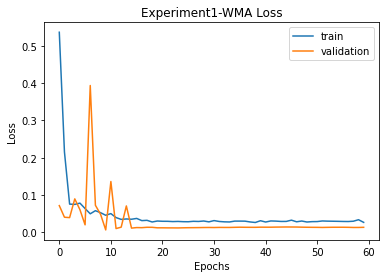


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 39.29635655476263 
RMSE:	 6.268680607174258 
MAPE:	 5.07416987111494

EMA
Prediction vs Close:		56.34% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 30.25057164247689 
RMSE:	 5.50005196725239 
MAPE:	 4.444486270049439

WMA
Prediction vs Close:		57.84% Accuracy
Prediction vs Prediction:	41.79% Accuracy
MSE:	 64.92643731055051 
RMSE:	 8.057694292448089 
MAPE:	 6.289003841800032
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4436.126, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3965.317, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf,

Epoch 1/500

Epoch 00001: val_loss improved from inf to 1.03480, saving model to LSTM1.h5
10/10 - 2s - loss: 0.2906 - val_loss: 1.0348 - lr: 0.0010 - 2s/epoch - 166ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 1.03480 to 0.10184, saving model to LSTM1.h5
10/10 - 0s - loss: 0.0729 - val_loss: 0.1018 - lr: 0.0010 - 145ms/epoch - 15ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.10184
10/10 - 0s - loss: 0.0690 - val_loss: 0.3825 - lr: 0.0010 - 109ms/epoch - 11ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.10184
10/10 - 0s - loss: 0.0559 - val_loss: 0.3389 - lr: 0.0010 - 112ms/epoch - 11ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.10184
10/10 - 0s - loss: 0.0561 - val_loss: 0.1873 - lr: 0.0010 - 105ms/epoch - 11ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.10184
10/10 - 0s - loss: 0.0567 - val_loss: 0.1386 - lr: 0.0010 - 101ms/epoch - 10ms/step
Epoch 7/500

Epoch 00007: ReduceLROnPlateau reducing learn

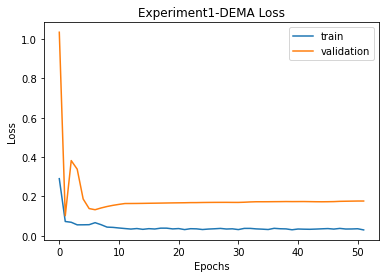


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 39.29635655476263 
RMSE:	 6.268680607174258 
MAPE:	 5.07416987111494

EMA
Prediction vs Close:		56.34% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 30.25057164247689 
RMSE:	 5.50005196725239 
MAPE:	 4.444486270049439

WMA
Prediction vs Close:		57.84% Accuracy
Prediction vs Prediction:	41.79% Accuracy
MSE:	 64.92643731055051 
RMSE:	 8.057694292448089 
MAPE:	 6.289003841800032

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 52.98651621196421 
RMSE:	 7.279183760008 
MAPE:	 5.725540843661134
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.38 sec
 ARIMA(0,3,0)(0,0,0)[

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.15184, saving model to LSTM1.h5
45/45 - 2s - loss: 0.3564 - val_loss: 0.1518 - lr: 0.0010 - 2s/epoch - 43ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.15184
45/45 - 0s - loss: 0.1500 - val_loss: 0.3345 - lr: 0.0010 - 401ms/epoch - 9ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.15184
45/45 - 0s - loss: 0.0501 - val_loss: 0.7766 - lr: 0.0010 - 368ms/epoch - 8ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.15184 to 0.09772, saving model to LSTM1.h5
45/45 - 0s - loss: 0.0492 - val_loss: 0.0977 - lr: 0.0010 - 437ms/epoch - 10ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.09772 to 0.01025, saving model to LSTM1.h5
45/45 - 0s - loss: 0.0431 - val_loss: 0.0102 - lr: 0.0010 - 464ms/epoch - 10ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.01025
45/45 - 0s - loss: 0.0480 - val_loss: 0.1955 - lr: 0.0010 - 408ms/epoch - 9ms/step
Epoch 7/500

Epoch 00007: val_lo

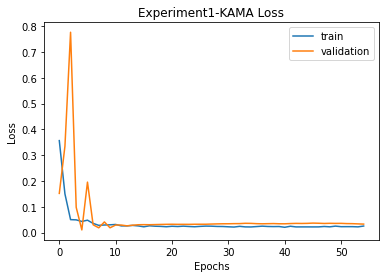


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 39.29635655476263 
RMSE:	 6.268680607174258 
MAPE:	 5.07416987111494

EMA
Prediction vs Close:		56.34% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 30.25057164247689 
RMSE:	 5.50005196725239 
MAPE:	 4.444486270049439

WMA
Prediction vs Close:		57.84% Accuracy
Prediction vs Prediction:	41.79% Accuracy
MSE:	 64.92643731055051 
RMSE:	 8.057694292448089 
MAPE:	 6.289003841800032

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 52.98651621196421 
RMSE:	 7.279183760008 
MAPE:	 5.725540843661134

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 33.6026987861483 
RMSE:	 5.796783486223054 
MAPE:	 4.518981487962124
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MIDPOINT pr

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.02821, saving model to LSTM1.h5
58/58 - 2s - loss: 0.1914 - val_loss: 0.0282 - lr: 0.0010 - 2s/epoch - 40ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.02821 to 0.02136, saving model to LSTM1.h5
58/58 - 1s - loss: 0.0663 - val_loss: 0.0214 - lr: 0.0010 - 502ms/epoch - 9ms/step
Epoch 3/500

Epoch 00003: val_loss improved from 0.02136 to 0.00821, saving model to LSTM1.h5
58/58 - 1s - loss: 0.1170 - val_loss: 0.0082 - lr: 0.0010 - 514ms/epoch - 9ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.00821
58/58 - 0s - loss: 0.0619 - val_loss: 0.5512 - lr: 0.0010 - 496ms/epoch - 9ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00821
58/58 - 1s - loss: 0.0423 - val_loss: 0.4569 - lr: 0.0010 - 519ms/epoch - 9ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.00821
58/58 - 0s - loss: 0.0480 - val_loss: 0.2682 - lr: 0.0010 - 491ms/epoch - 8ms/step
Epoch 7/500

Epoch 00007: val_loss

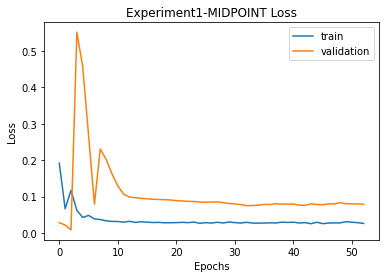


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 39.29635655476263 
RMSE:	 6.268680607174258 
MAPE:	 5.07416987111494

EMA
Prediction vs Close:		56.34% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 30.25057164247689 
RMSE:	 5.50005196725239 
MAPE:	 4.444486270049439

WMA
Prediction vs Close:		57.84% Accuracy
Prediction vs Prediction:	41.79% Accuracy
MSE:	 64.92643731055051 
RMSE:	 8.057694292448089 
MAPE:	 6.289003841800032

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 52.98651621196421 
RMSE:	 7.279183760008 
MAPE:	 5.725540843661134

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 33.6026987861483 
RMSE:	 5.796783486223054 
MAPE:	 4.518981487962124

MIDPOINT
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 22.7414116550439 
RMSE:	 4.768795618921396 
MAPE:	 3.944458615157319
T3
T3([input_arrays], [timeperiod=5]

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.05392, saving model to LSTM1.h5
43/43 - 2s - loss: 0.3047 - val_loss: 0.0539 - lr: 0.0010 - 2s/epoch - 44ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.05392 to 0.04661, saving model to LSTM1.h5
43/43 - 0s - loss: 0.1255 - val_loss: 0.0466 - lr: 0.0010 - 395ms/epoch - 9ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.04661
43/43 - 0s - loss: 0.1140 - val_loss: 0.6637 - lr: 0.0010 - 405ms/epoch - 9ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.04661
43/43 - 0s - loss: 0.0770 - val_loss: 0.3570 - lr: 0.0010 - 367ms/epoch - 9ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.04661
43/43 - 0s - loss: 0.0437 - val_loss: 0.1212 - lr: 0.0010 - 431ms/epoch - 10ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.04661
43/43 - 0s - loss: 0.0622 - val_loss: 0.1236 - lr: 0.0010 - 337ms/epoch - 8ms/step
Epoch 7/500

Epoch 00007: ReduceLROnPlateau reducing learning r

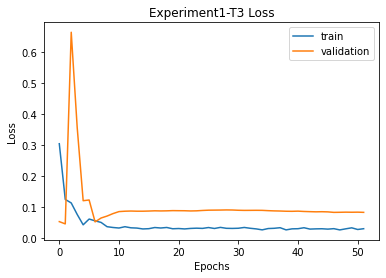


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 39.29635655476263 
RMSE:	 6.268680607174258 
MAPE:	 5.07416987111494

EMA
Prediction vs Close:		56.34% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 30.25057164247689 
RMSE:	 5.50005196725239 
MAPE:	 4.444486270049439

WMA
Prediction vs Close:		57.84% Accuracy
Prediction vs Prediction:	41.79% Accuracy
MSE:	 64.92643731055051 
RMSE:	 8.057694292448089 
MAPE:	 6.289003841800032

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 52.98651621196421 
RMSE:	 7.279183760008 
MAPE:	 5.725540843661134

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 33.6026987861483 
RMSE:	 5.796783486223054 
MAPE:	 4.518981487962124

MIDPOINT
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 22.7414116550439 
RMSE:	 4.768795618921396 
MAPE:	 3.944458615157319

T3
Prediction vs Close:		51.87% Acc

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.04929, saving model to LSTM1.h5
90/90 - 2s - loss: 0.2001 - val_loss: 0.0493 - lr: 0.0010 - 2s/epoch - 25ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.04929
90/90 - 1s - loss: 0.1000 - val_loss: 0.4574 - lr: 0.0010 - 742ms/epoch - 8ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.04929
90/90 - 1s - loss: 0.0796 - val_loss: 0.5206 - lr: 0.0010 - 774ms/epoch - 9ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.04929
90/90 - 1s - loss: 0.0593 - val_loss: 0.1143 - lr: 0.0010 - 742ms/epoch - 8ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.04929
90/90 - 1s - loss: 0.0503 - val_loss: 0.1298 - lr: 0.0010 - 730ms/epoch - 8ms/step
Epoch 6/500

Epoch 00006: val_loss improved from 0.04929 to 0.02034, saving model to LSTM1.h5
90/90 - 1s - loss: 0.0385 - val_loss: 0.0203 - lr: 0.0010 - 902ms/epoch - 10ms/step
Epoch 7/500

Epoch 00007: val_loss did not improve from 0.02034

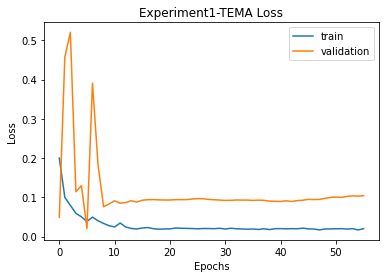


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 39.29635655476263 
RMSE:	 6.268680607174258 
MAPE:	 5.07416987111494

EMA
Prediction vs Close:		56.34% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 30.25057164247689 
RMSE:	 5.50005196725239 
MAPE:	 4.444486270049439

WMA
Prediction vs Close:		57.84% Accuracy
Prediction vs Prediction:	41.79% Accuracy
MSE:	 64.92643731055051 
RMSE:	 8.057694292448089 
MAPE:	 6.289003841800032

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 52.98651621196421 
RMSE:	 7.279183760008 
MAPE:	 5.725540843661134

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 33.6026987861483 
RMSE:	 5.796783486223054 
MAPE:	 4.518981487962124

MIDPOINT
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 22.7414116550439 
RMSE:	 4.768795618921396 
MAPE:	 3.944458615157319

T3
Prediction vs Close:		51.87% Acc

In [84]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation1 = {}
    imgfile = 'Experiment1'
    for ma in optimized_period:
              print(ma)
              print(functions[ma])
              print ( int( optimized_period[ma]))
            # if ma == 'SMA':
              low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
              low_vol = low_vol.fillna(0)
              low_vol_data = df['close']
              high_vol = pd.DataFrame()
              df2 = df.copy()
              for i in df2.columns:
                if i in low_vol.columns:
                  high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
              high_vol_data = df['close']
              ## *****************************************************
              # Generate ARIMA and LSTM predictions
              print('\nWorking on ' + ma + ' predictions')
              try:
                print('parameters used : ', train_len, test_len)
                low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima(low_vol,low_vol_data, train_len, test_len)
              except:
                  print('ARIMA error, skipping to next MA type')
                  continue
              Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
              final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
              mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
              rmse_ftr = mse_ftr ** 0.5
              mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
              mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

              final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
              mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
              rmse = mse ** 0.5
              mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              # Generate prediction accuracy
              actual = df['close'].tail(test_len).values
              result_1 = []
              result_2 = []
              for i in range(1, len(final_prediction)):
                  # Compare prediction to previous close price
                  if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                      result_1.append(1)
                  elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                      result_1.append(1)
                  else:
                      result_1.append(0)

                  # Compare prediction to previous prediction
                  if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                      result_2.append(1)
                  elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                      result_2.append(1)
                  else:
                      result_2.append(0)

              accuracy_1 = np.mean(result_1)
              accuracy_2 = np.mean(result_2)

              simulation1[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                            'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                            'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                            'rmse': rmse_ftr, 'mae' : mae_ftr},
                                'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                          'rmse': rmse, 'mae': mae },
                                'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

              # save simulation data here as checkpoint
              with open('simulation1_data.json', 'w') as fp:
                  json.dump(simulation1, fp)

              for ma in simulation1.keys():
                  print('\n' + ma)
                  print('Prediction vs Close:\t\t' + str(round(100*simulation1[ma]['accuracy']['prediction vs close'], 2))
                        + '% Accuracy')
                  print('Prediction vs Prediction:\t' + str(round(100*simulation1[ma]['accuracy']['prediction vs prediction'], 2))
                        + '% Accuracy')
                  print('MSE:\t', simulation1[ma]['final']['mse'],
                        '\nRMSE:\t', simulation1[ma]['final']['rmse'],
                        '\nMAPE:\t', simulation1[ma]['final']['mae'])#,
                        # '\nMAPE:\t', simulation[ma]['final']['mape'])
            # else:
            #   break
            # code you want to evaluate
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture used

In [85]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment1.png to Experiment1 (1).png


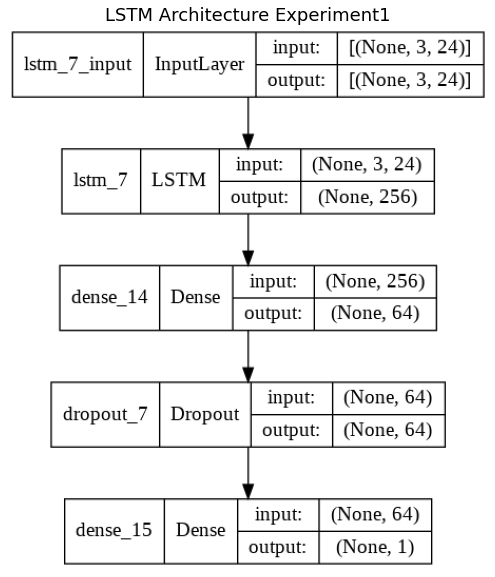

In [86]:
img = cv2.imread('Experiment1.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

Excess kurtosis is a metric that compares the kurtosis of a distribution against the kurtosis of a normal distribution. The kurtosis of a normal distribution equals 3. Therefore, the excess kurtosis is found using the formula below:

Excess Kurtosis = Kurtosis – 3

### Model Plots

In [87]:
np.save("X_train_appl.npy", X_train)
np.save("y_train_appl.npy", y_train)
np.save("X_test_appl.npy", X_test)
np.save("y_test_appl.npy", y_test)
np.save("yc_train_appl.npy", yc_train)
np.save("yc_test_appl.npy", yc_test)
np.save('index_train_appl.npy', index_train)
np.save('index_test_appl.npy', index_test)

In [88]:
list(simulation1.keys())

['SMA', 'EMA', 'WMA', 'DEMA', 'KAMA', 'MIDPOINT', 'T3', 'TEMA']

In [140]:
import json
with open('simulation1_data.json') as json_file:
    simulation1 = json.load(json_file)
fileimg = 'Experiment1'

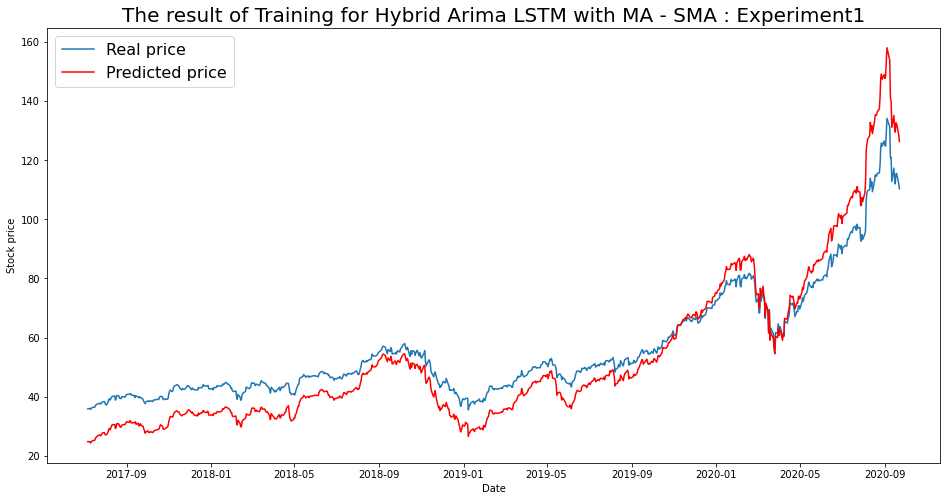

----- Train RMSE for SMA ----- 8.0413849019624
----- Train_MSE_LSTM for SMA ----- 64.66387114150885
----- Train MAE LSTM for SMA ----- 6.984172090422362


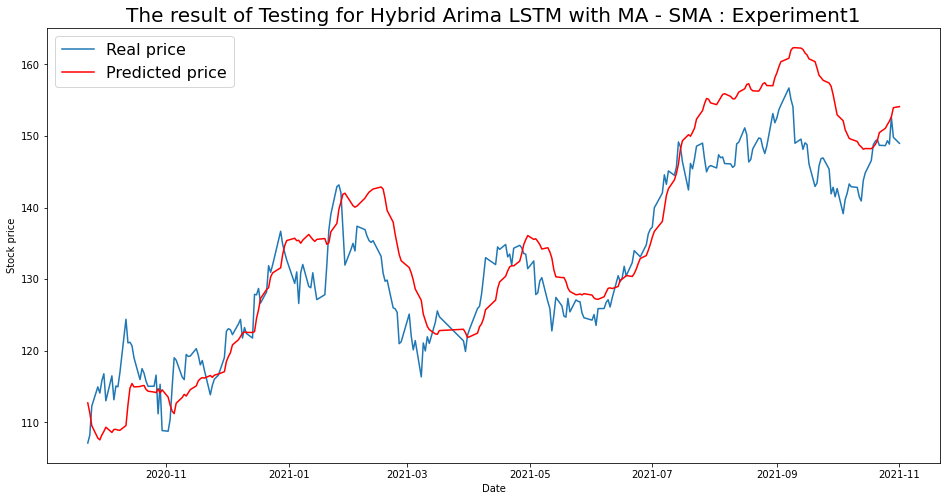

----- Test RMSE for SMA----- 6.268680607174258
----- Test_MSE_LSTM for SMA----- 39.29635655476263
----- Test_MAE_LSTM for SMA----- 5.07416987111494


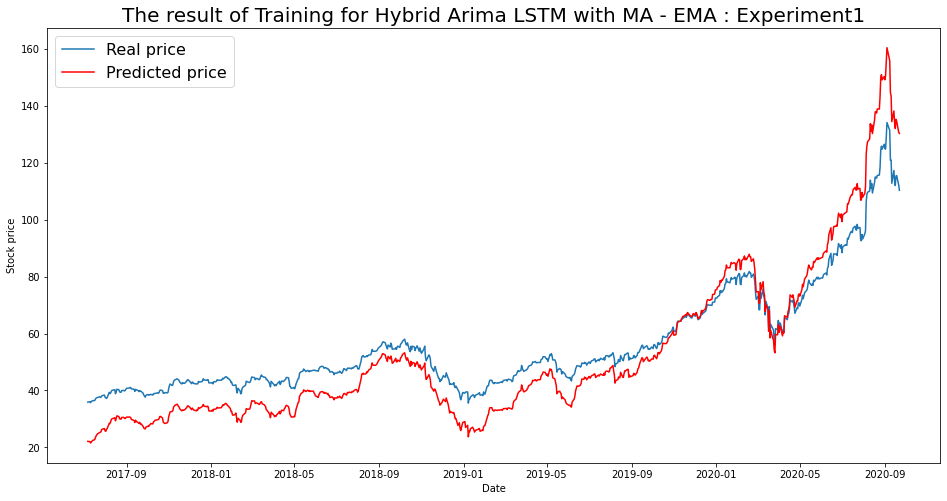

----- Train RMSE for EMA ----- 9.093795784259413
----- Train_MSE_LSTM for EMA ----- 82.69712176581427
----- Train MAE LSTM for EMA ----- 7.9494118779796255


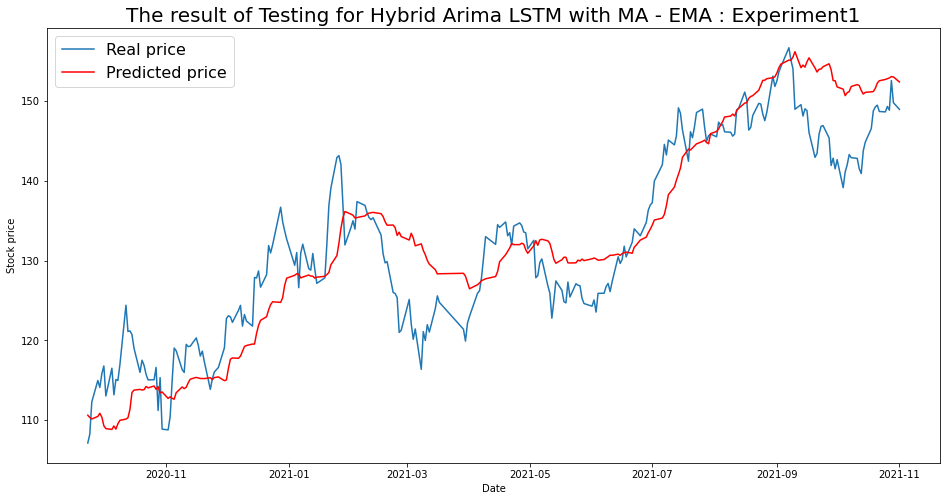

----- Test RMSE for EMA----- 5.50005196725239
----- Test_MSE_LSTM for EMA----- 30.25057164247689
----- Test_MAE_LSTM for EMA----- 4.444486270049439


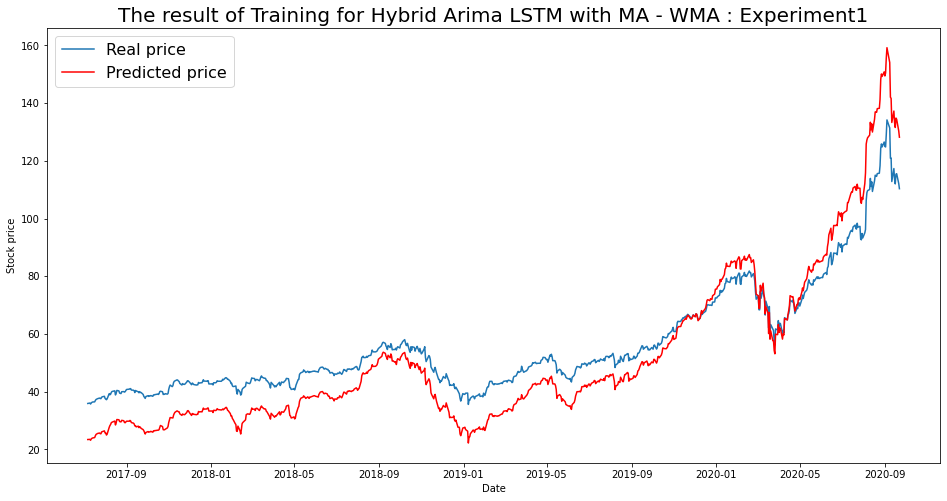

----- Train RMSE for WMA ----- 9.540832646041645
----- Train_MSE_LSTM for WMA ----- 91.02748757977402
----- Train MAE LSTM for WMA ----- 8.461359613734103


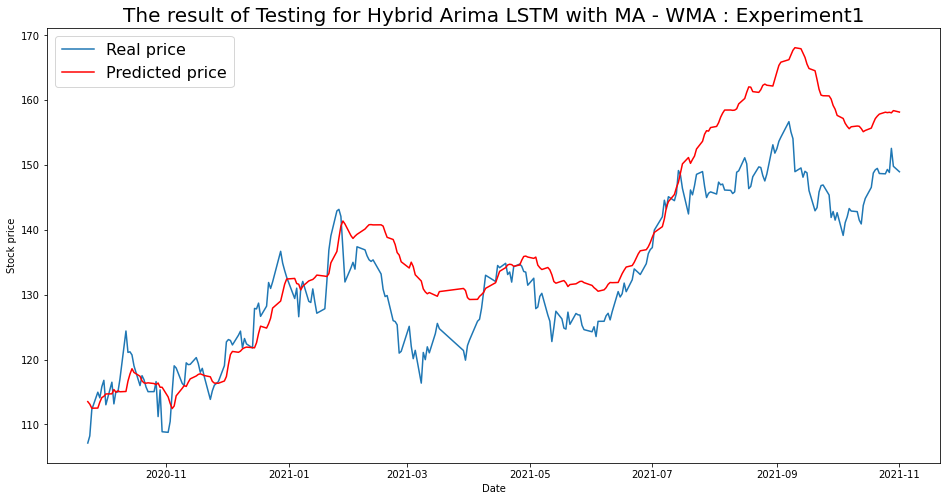

----- Test RMSE for WMA----- 8.057694292448089
----- Test_MSE_LSTM for WMA----- 64.92643731055051
----- Test_MAE_LSTM for WMA----- 6.289003841800032


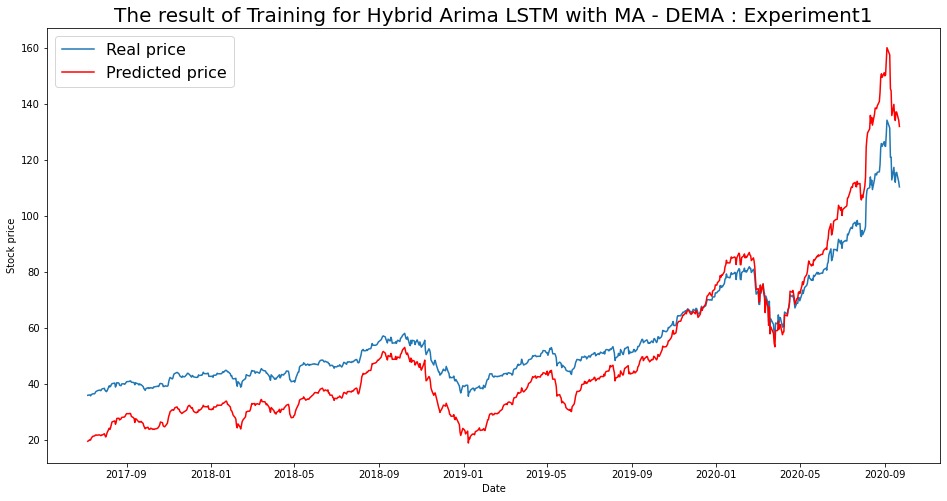

----- Train RMSE for DEMA ----- 11.100597362863033
----- Train_MSE_LSTM for DEMA ----- 123.2232618124017
----- Train MAE LSTM for DEMA ----- 9.911796547735277


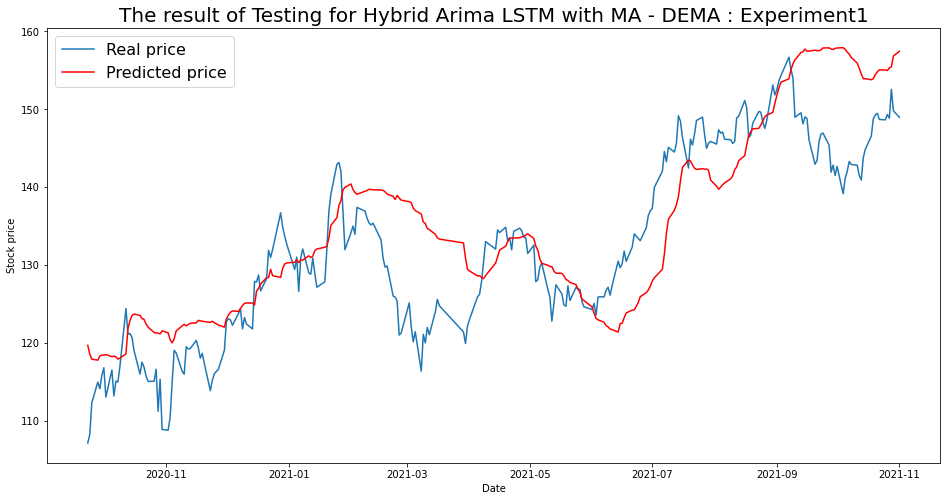

----- Test RMSE for DEMA----- 7.279183760008
----- Test_MSE_LSTM for DEMA----- 52.98651621196421
----- Test_MAE_LSTM for DEMA----- 5.725540843661134


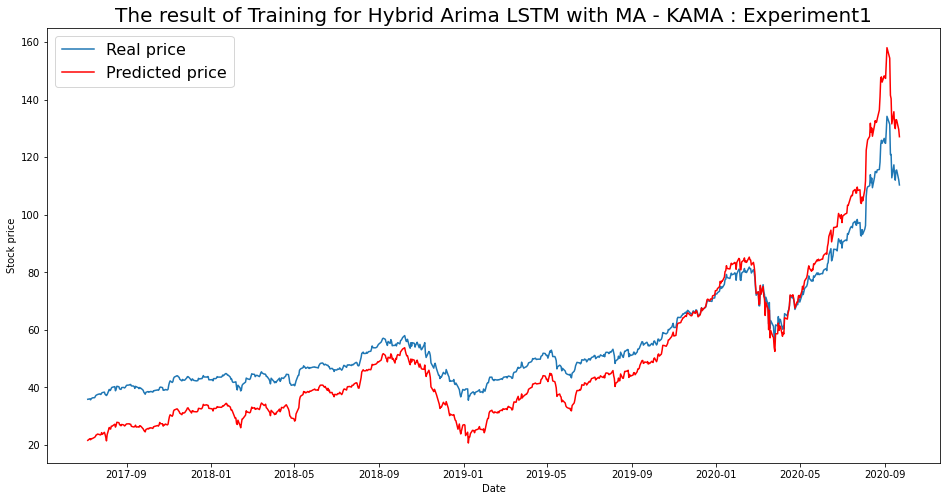

----- Train RMSE for KAMA ----- 9.711048663776115
----- Train_MSE_LSTM for KAMA ----- 94.30446615022788
----- Train MAE LSTM for KAMA ----- 8.63911047031167


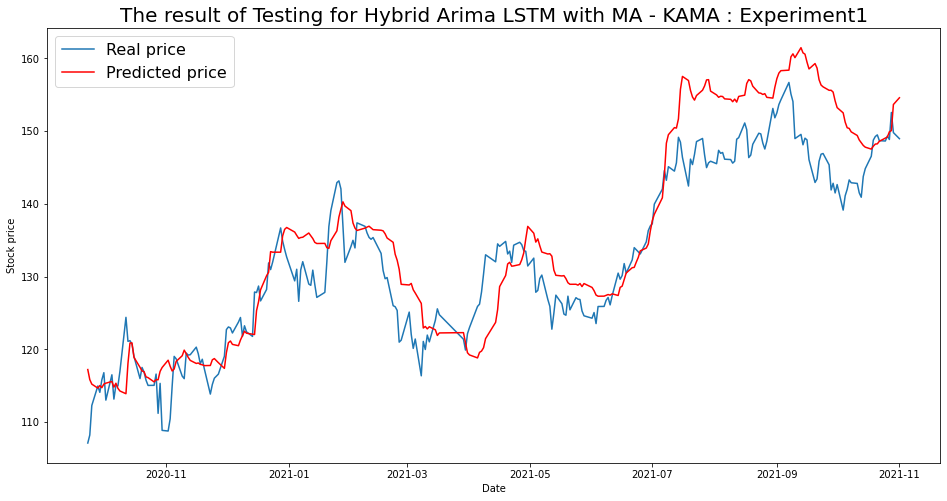

----- Test RMSE for KAMA----- 5.796783486223054
----- Test_MSE_LSTM for KAMA----- 33.6026987861483
----- Test_MAE_LSTM for KAMA----- 4.518981487962124


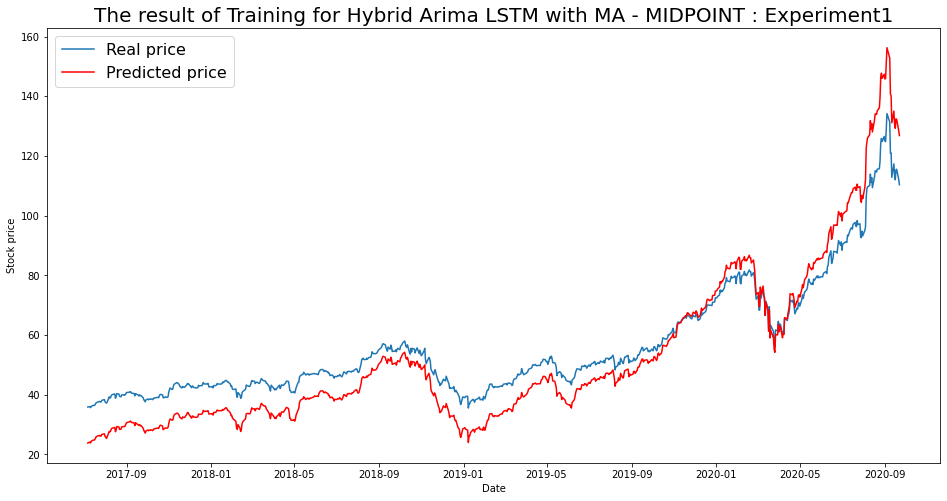

----- Train RMSE for MIDPOINT ----- 8.42723685446347
----- Train_MSE_LSTM for MIDPOINT ----- 71.01832100122736
----- Train MAE LSTM for MIDPOINT ----- 7.433581155738655


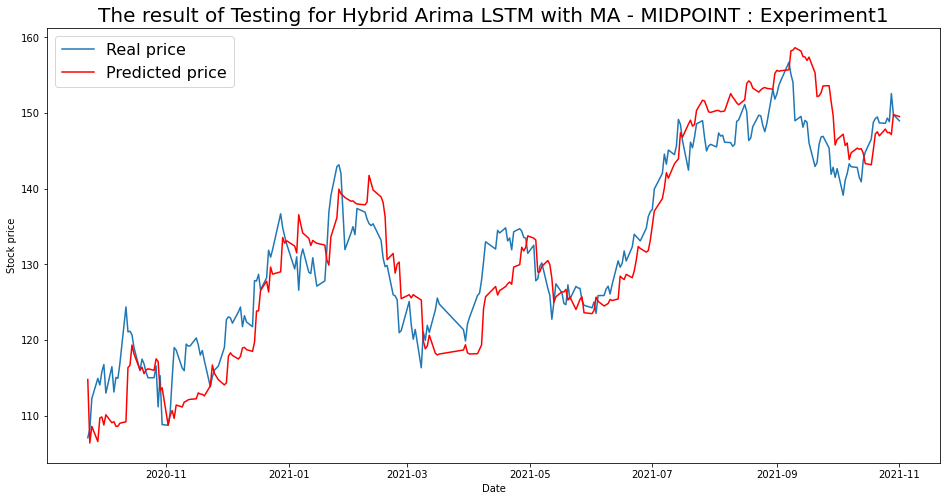

----- Test RMSE for MIDPOINT----- 4.768795618921396
----- Test_MSE_LSTM for MIDPOINT----- 22.7414116550439
----- Test_MAE_LSTM for MIDPOINT----- 3.944458615157319


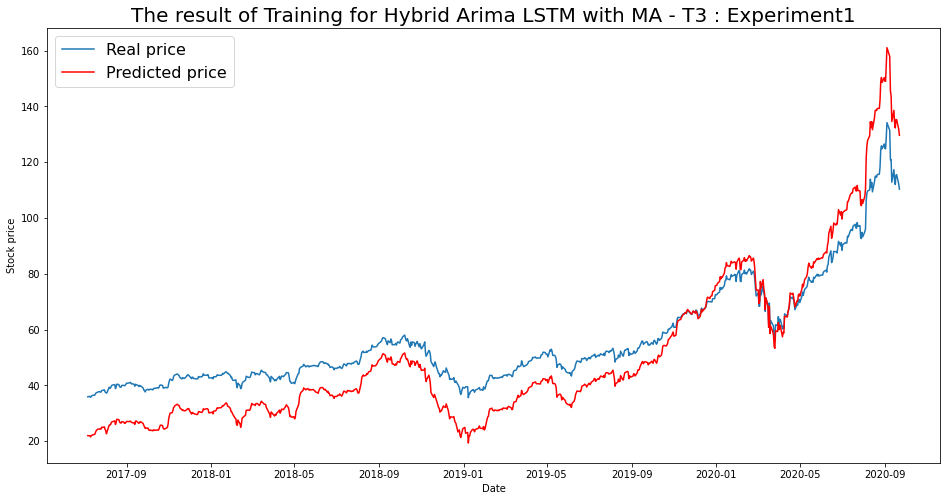

----- Train RMSE for T3 ----- 10.78572680059317
----- Train_MSE_LSTM for T3 ----- 116.33190261703379
----- Train MAE LSTM for T3 ----- 9.683946313650006


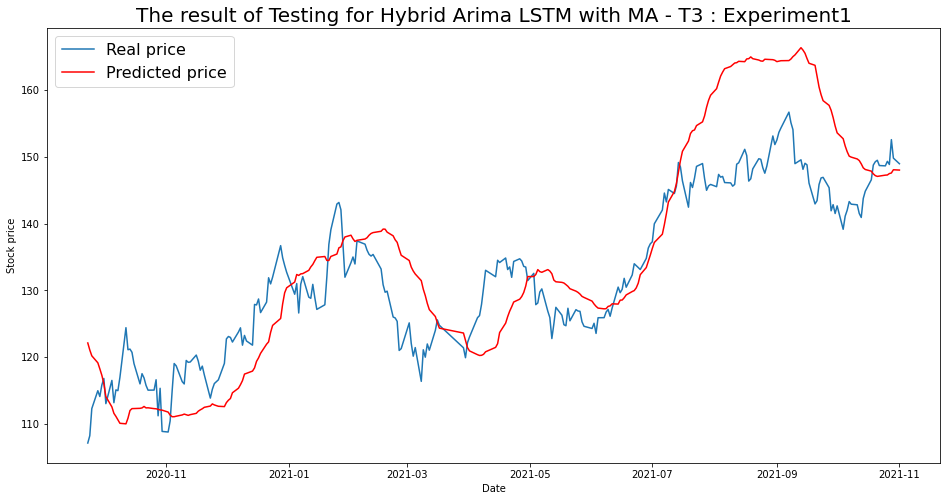

----- Test RMSE for T3----- 8.434809584670473
----- Test_MSE_LSTM for T3----- 71.14601272964887
----- Test_MAE_LSTM for T3----- 6.848574357624394


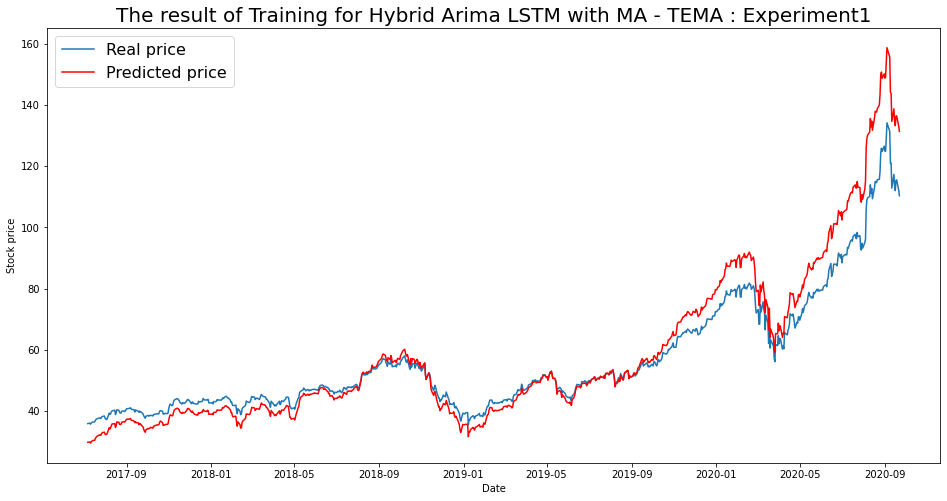

----- Train RMSE for TEMA ----- 6.938756727032321
----- Train_MSE_LSTM for TEMA ----- 48.14634491693629
----- Train MAE LSTM for TEMA ----- 4.664446043887978


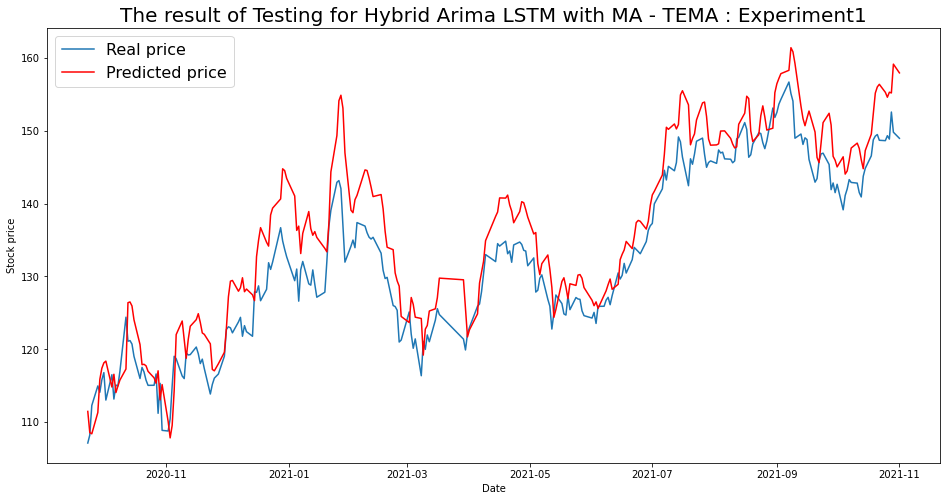

----- Test RMSE for TEMA----- 5.158323598407468
----- Test_MSE_LSTM for TEMA----- 26.608302345887367
----- Test_MAE_LSTM for TEMA----- 4.336839144940602


In [141]:
for i in range(len(list(simulation1.keys()))):
  SIM = list(simulation1.keys())[i]
  plot_train(simulation1,SIM)
  plot_test(simulation1,SIM)

## Univariate Arima Multistep MutiVariate LSTM Hybrid Model Experiment 2

In [96]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # # Option 1
    # # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # option 2
    model = Sequential()
    model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    model.add(Dense(64))
    model.add(Dense(units=output_dim))
    model.compile(optimizer=Adam(learning_rate = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM2.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()




    # Option 3
    # define custom activation
    # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.49 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4157.020, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3687.148, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.21 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3458.651, Time=0.08 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3322.133, Time=0.08 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.76 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.86 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3324.133, Time=0.24 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 2.790 seconds
                               SARIMAX Results                                
Dep.

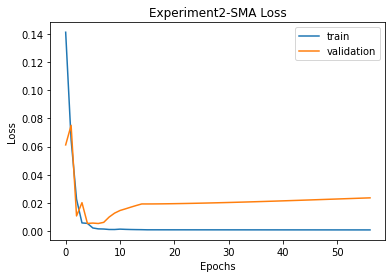


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 39.87524298067742 
RMSE:	 6.3146847095225125 
MAPE:	 5.088204561858354
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.41 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4231.556, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3761.238, Time=0.05 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3532.227, Time=0.08 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3394.496, Time=0.10 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.81 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.66 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3396.496, Time=0.

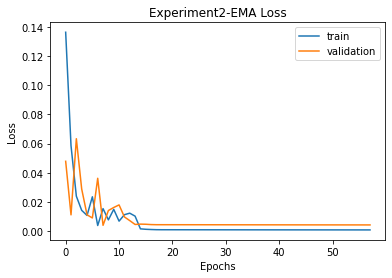


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 39.87524298067742 
RMSE:	 6.3146847095225125 
MAPE:	 5.088204561858354

EMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 73.6938994303845 
RMSE:	 8.584515095821342 
MAPE:	 7.207683534137507
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.40 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4264.089, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3793.930, Time=0.05 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.25 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3564.923, Time=0.08 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3427.258, Time=0.09 sec
 ARIMA(3,3,1)(0,0,0)[0] 

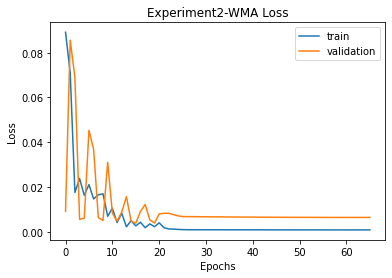


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 39.87524298067742 
RMSE:	 6.3146847095225125 
MAPE:	 5.088204561858354

EMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 73.6938994303845 
RMSE:	 8.584515095821342 
MAPE:	 7.207683534137507

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 76.90233333404232 
RMSE:	 8.76939754681257 
MAPE:	 7.121360770950225
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.42 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4436.126, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3965.317, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=in

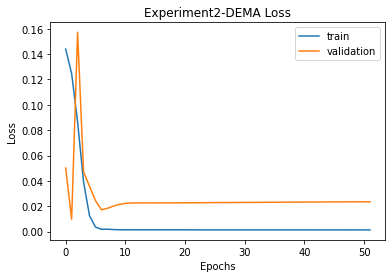


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 39.87524298067742 
RMSE:	 6.3146847095225125 
MAPE:	 5.088204561858354

EMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 73.6938994303845 
RMSE:	 8.584515095821342 
MAPE:	 7.207683534137507

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 76.90233333404232 
RMSE:	 8.76939754681257 
MAPE:	 7.121360770950225

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 131.0602137141292 
RMSE:	 11.448153288374908 
MAPE:	 10.329401784343453
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(0,3,0)(

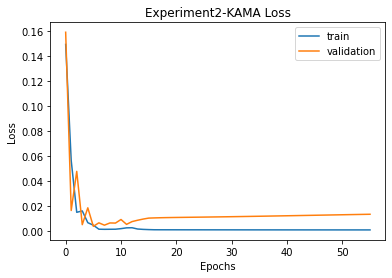


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 39.87524298067742 
RMSE:	 6.3146847095225125 
MAPE:	 5.088204561858354

EMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 73.6938994303845 
RMSE:	 8.584515095821342 
MAPE:	 7.207683534137507

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 76.90233333404232 
RMSE:	 8.76939754681257 
MAPE:	 7.121360770950225

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 131.0602137141292 
RMSE:	 11.448153288374908 
MAPE:	 10.329401784343453

KAMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 42.128331463904196 
RMSE:	 6.49063413418937 
MAPE:	 5.225311201416733
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MID

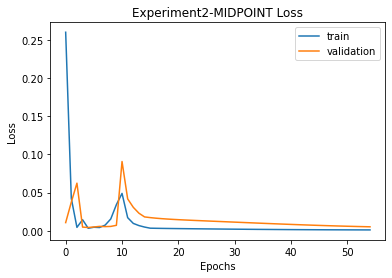


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 39.87524298067742 
RMSE:	 6.3146847095225125 
MAPE:	 5.088204561858354

EMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 73.6938994303845 
RMSE:	 8.584515095821342 
MAPE:	 7.207683534137507

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 76.90233333404232 
RMSE:	 8.76939754681257 
MAPE:	 7.121360770950225

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 131.0602137141292 
RMSE:	 11.448153288374908 
MAPE:	 10.329401784343453

KAMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 42.128331463904196 
RMSE:	 6.49063413418937 
MAPE:	 5.225311201416733

MIDPOINT
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 102.72361049298229 
RMSE:	 10.135265684380567 
MAPE:	 8.372939983805384
T3
T3([input_arrays], [t

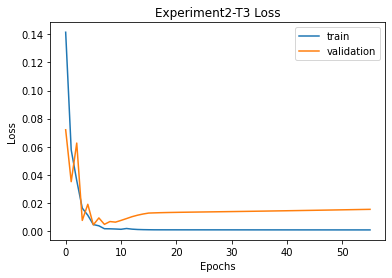


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 39.87524298067742 
RMSE:	 6.3146847095225125 
MAPE:	 5.088204561858354

EMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 73.6938994303845 
RMSE:	 8.584515095821342 
MAPE:	 7.207683534137507

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 76.90233333404232 
RMSE:	 8.76939754681257 
MAPE:	 7.121360770950225

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 131.0602137141292 
RMSE:	 11.448153288374908 
MAPE:	 10.329401784343453

KAMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 42.128331463904196 
RMSE:	 6.49063413418937 
MAPE:	 5.225311201416733

MIDPOINT
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 102.72361049298229 
RMSE:	 10.135265684380567 
MAPE:	 8.372939983805384

T3
Prediction vs Close:

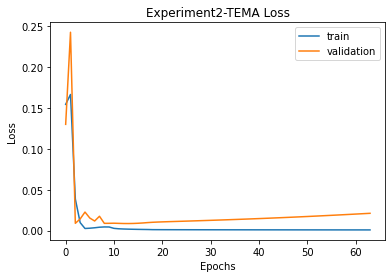


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 39.87524298067742 
RMSE:	 6.3146847095225125 
MAPE:	 5.088204561858354

EMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 73.6938994303845 
RMSE:	 8.584515095821342 
MAPE:	 7.207683534137507

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 76.90233333404232 
RMSE:	 8.76939754681257 
MAPE:	 7.121360770950225

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 131.0602137141292 
RMSE:	 11.448153288374908 
MAPE:	 10.329401784343453

KAMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 42.128331463904196 
RMSE:	 6.49063413418937 
MAPE:	 5.225311201416733

MIDPOINT
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 102.72361049298229 
RMSE:	 10.135265684380567 
MAPE:	 8.372939983805384

T3
Prediction vs Close:

In [97]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation2 = {}
    imgfile = 'Experiment2'
    for ma in optimized_period:
              print(ma)
              print(functions[ma])
              print ( int( optimized_period[ma]))
            # if ma == 'SMA':
              low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
              low_vol = low_vol.fillna(0)
              low_vol_data = df['close']
              high_vol = pd.DataFrame()
              df2 = df.copy()
              for i in df2.columns:
                if i in low_vol.columns:
                  high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
              high_vol_data = df['close']
              ## *****************************************************
              # Generate ARIMA and LSTM predictions
              print('\nWorking on ' + ma + ' predictions')
              try:
                print('parameters used : ', train_len, test_len)
                low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima(low_vol,low_vol_data, train_len, test_len)
              except:
                  print('ARIMA error, skipping to next MA type')
                  continue
              Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
              final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
              mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
              rmse_ftr = mse_ftr ** 0.5
              mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
              mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

              final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
              mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
              rmse = mse ** 0.5
              mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              # Generate prediction accuracy
              actual = df['close'].tail(test_len).values
              result_1 = []
              result_2 = []
              for i in range(1, len(final_prediction)):
                  # Compare prediction to previous close price
                  if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                      result_1.append(1)
                  elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                      result_1.append(1)
                  else:
                      result_1.append(0)

                  # Compare prediction to previous prediction
                  if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                      result_2.append(1)
                  elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                      result_2.append(1)
                  else:
                      result_2.append(0)

              accuracy_1 = np.mean(result_1)
              accuracy_2 = np.mean(result_2)

              simulation2[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                            'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                            'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                            'rmse': rmse_ftr, 'mae' : mae_ftr},
                                'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                          'rmse': rmse, 'mae': mae },
                                'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

              # save simulation data here as checkpoint
              with open('simulation2_data.json', 'w') as fp:
                  json.dump(simulation2, fp)

              for ma in simulation2.keys():
                  print('\n' + ma)
                  print('Prediction vs Close:\t\t' + str(round(100*simulation2[ma]['accuracy']['prediction vs close'], 2))
                        + '% Accuracy')
                  print('Prediction vs Prediction:\t' + str(round(100*simulation2[ma]['accuracy']['prediction vs prediction'], 2))
                        + '% Accuracy')
                  print('MSE:\t', simulation2[ma]['final']['mse'],
                        '\nRMSE:\t', simulation2[ma]['final']['rmse'],
                        '\nMAPE:\t', simulation2[ma]['final']['mae'])#,
                        # '\nMAPE:\t', simulation[ma]['final']['mape'])
            # else:
            #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [98]:
from google.colab import files
import cv2
uploaded = files.upload()

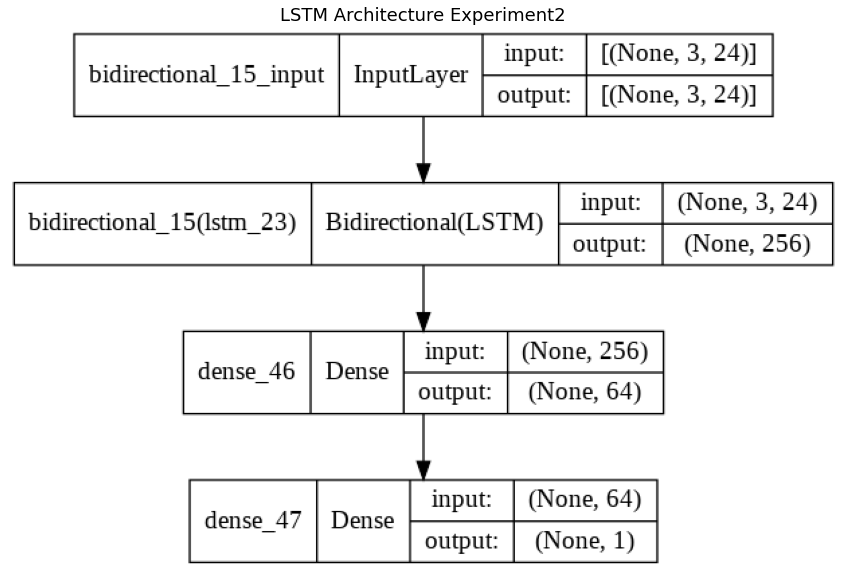

In [99]:
img = cv2.imread('Experiment2.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [142]:
import json
with open('simulation2_data.json') as json_file:
    simulation2 = json.load(json_file)
fileimg = 'Experiment2'

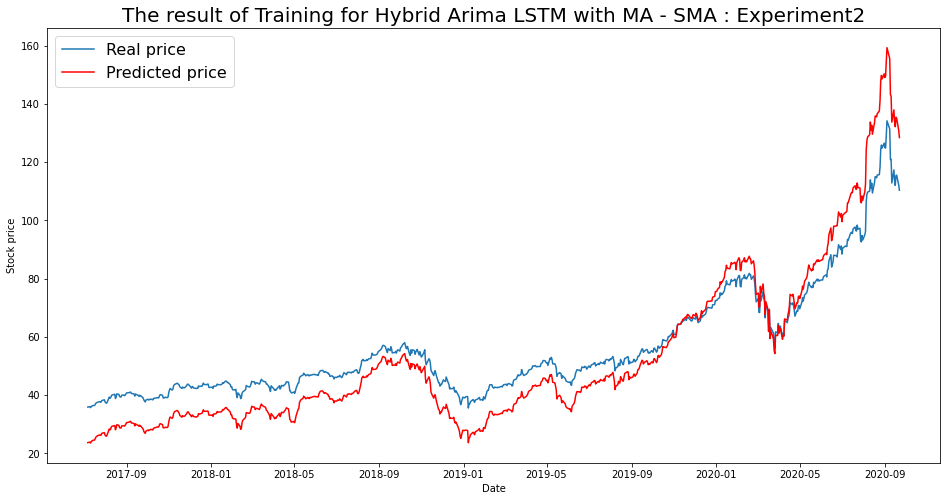

----- Train RMSE for SMA ----- 8.889283880470046
----- Train_MSE_LSTM for SMA ----- 79.0193679075846
----- Train MAE LSTM for SMA ----- 7.8115937103860835


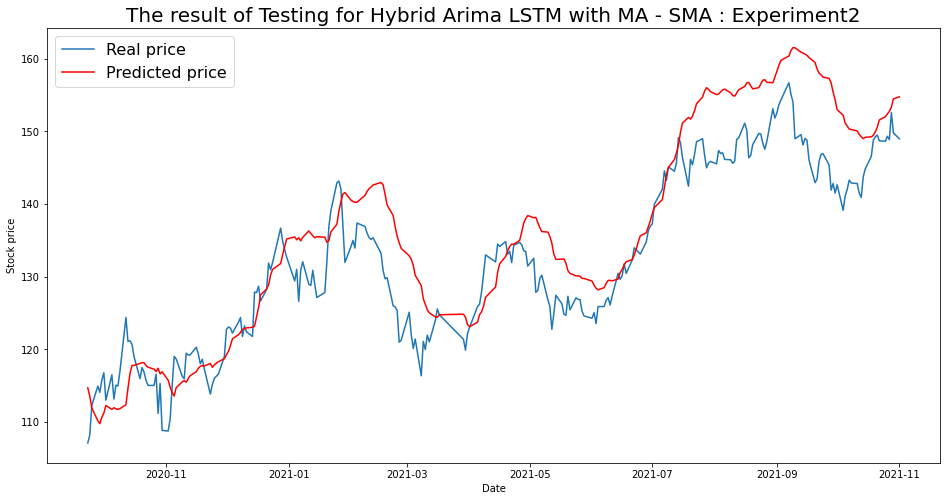

----- Test RMSE for SMA----- 6.3146847095225125
----- Test_MSE_LSTM for SMA----- 39.87524298067742
----- Test_MAE_LSTM for SMA----- 5.088204561858354


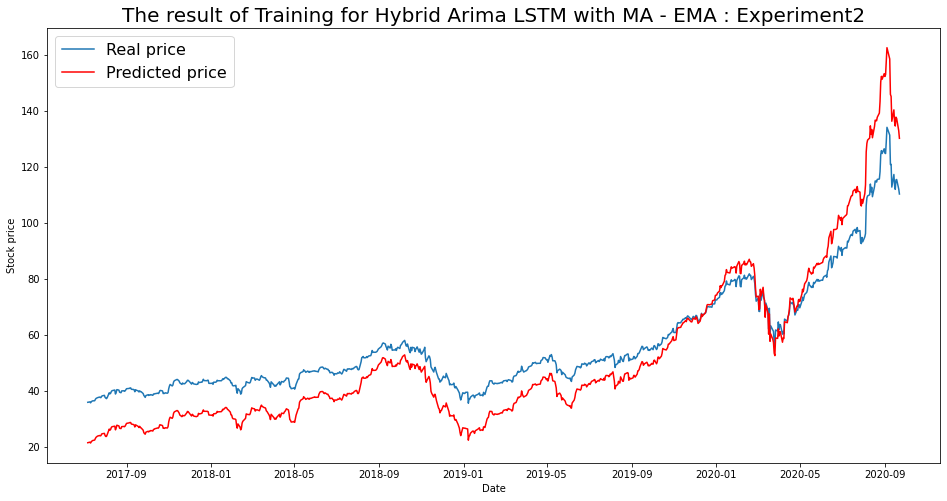

----- Train RMSE for EMA ----- 10.150148453019417
----- Train_MSE_LSTM for EMA ----- 103.02551361833245
----- Train MAE LSTM for EMA ----- 8.952000885856286


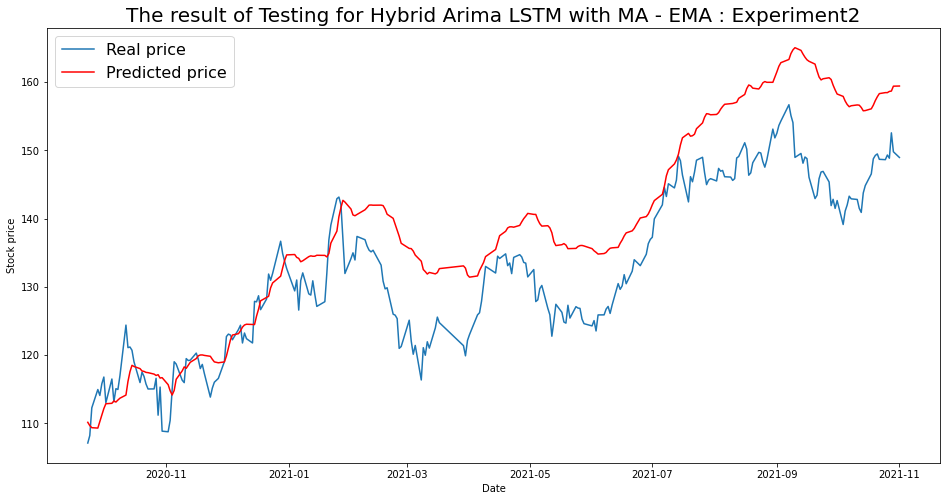

----- Test RMSE for EMA----- 8.584515095821342
----- Test_MSE_LSTM for EMA----- 73.6938994303845
----- Test_MAE_LSTM for EMA----- 7.207683534137507


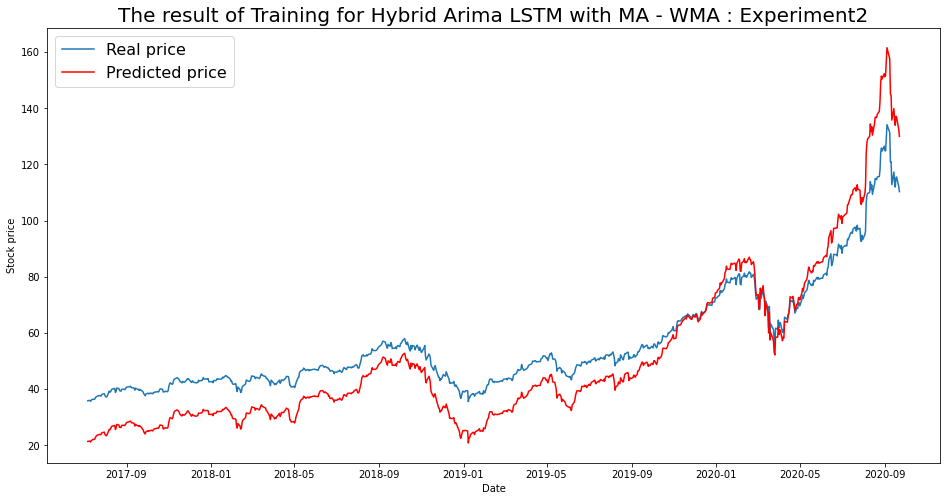

----- Train RMSE for WMA ----- 10.467180278295531
----- Train_MSE_LSTM for WMA ----- 109.56186297833894
----- Train MAE LSTM for WMA ----- 9.323534322736583


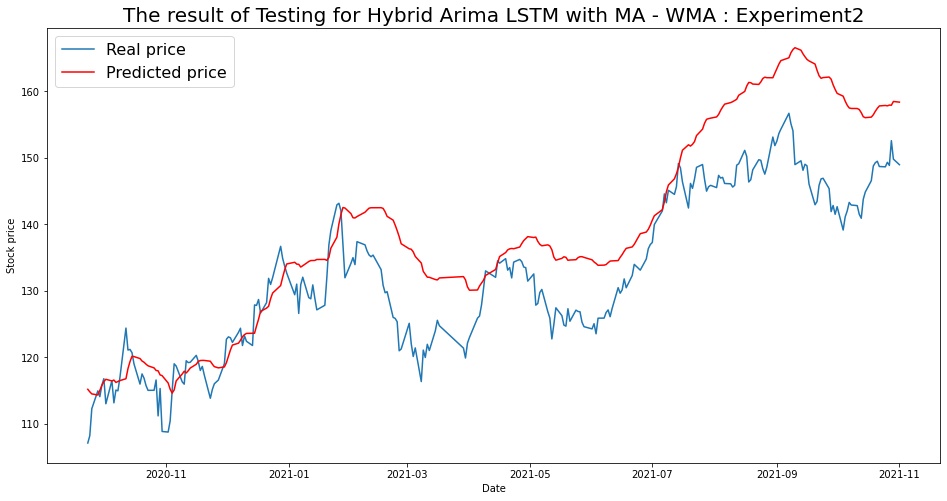

----- Test RMSE for WMA----- 8.76939754681257
----- Test_MSE_LSTM for WMA----- 76.90233333404232
----- Test_MAE_LSTM for WMA----- 7.121360770950225


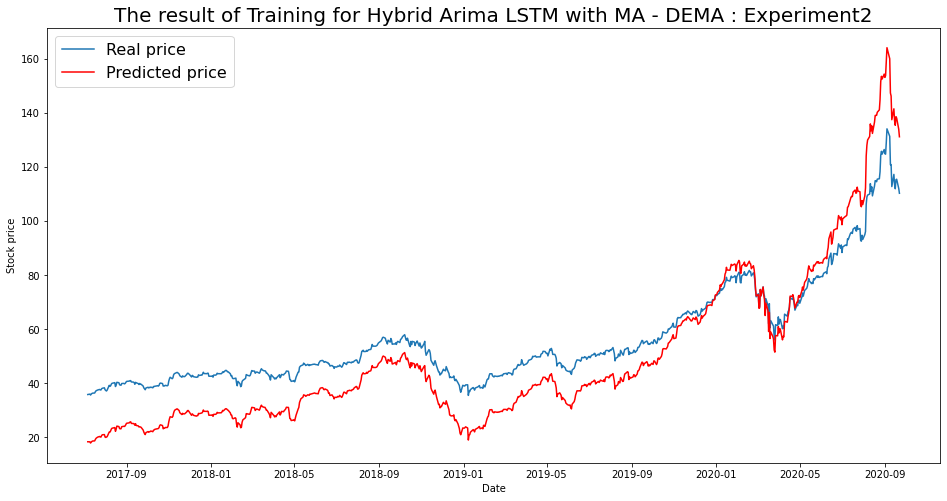

----- Train RMSE for DEMA ----- 12.075408120538793
----- Train_MSE_LSTM for DEMA ----- 145.81548127757424
----- Train MAE LSTM for DEMA ----- 10.813702843841257


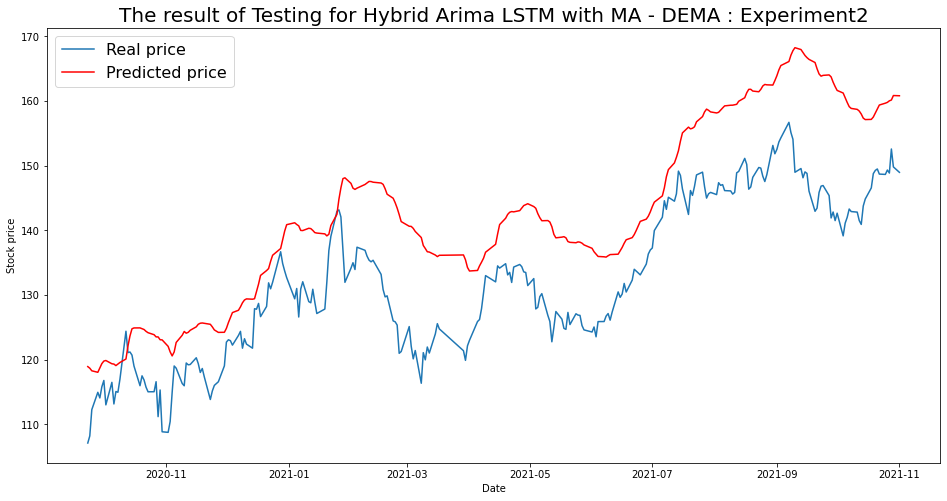

----- Test RMSE for DEMA----- 11.448153288374908
----- Test_MSE_LSTM for DEMA----- 131.0602137141292
----- Test_MAE_LSTM for DEMA----- 10.329401784343453


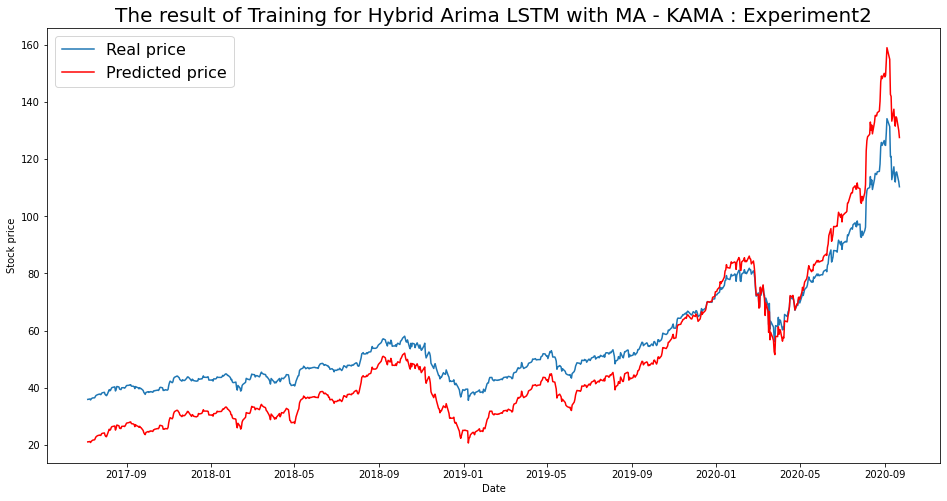

----- Train RMSE for KAMA ----- 10.56352496627593
----- Train_MSE_LSTM for KAMA ----- 111.58805971313488
----- Train MAE LSTM for KAMA ----- 9.51725184300564


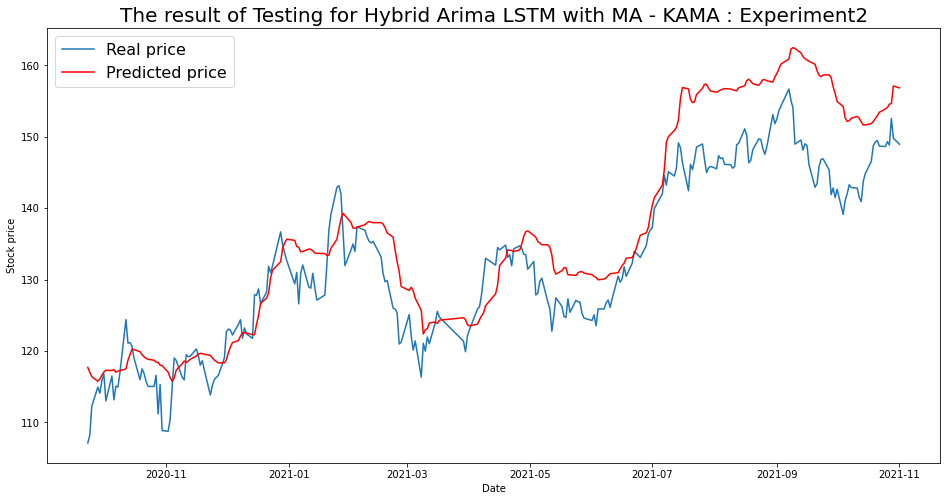

----- Test RMSE for KAMA----- 6.49063413418937
----- Test_MSE_LSTM for KAMA----- 42.128331463904196
----- Test_MAE_LSTM for KAMA----- 5.225311201416733


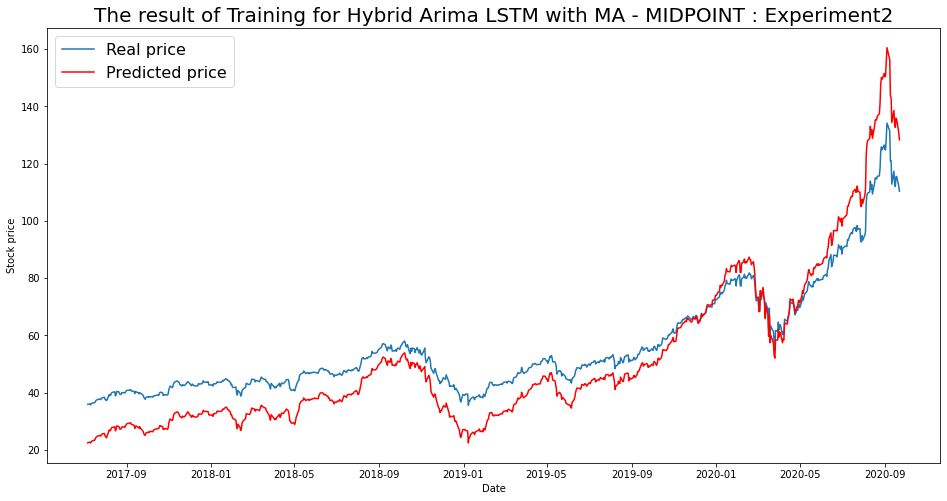

----- Train RMSE for MIDPOINT ----- 9.508048912895521
----- Train_MSE_LSTM for MIDPOINT ----- 90.4029941300137
----- Train MAE LSTM for MIDPOINT ----- 8.394449433621876


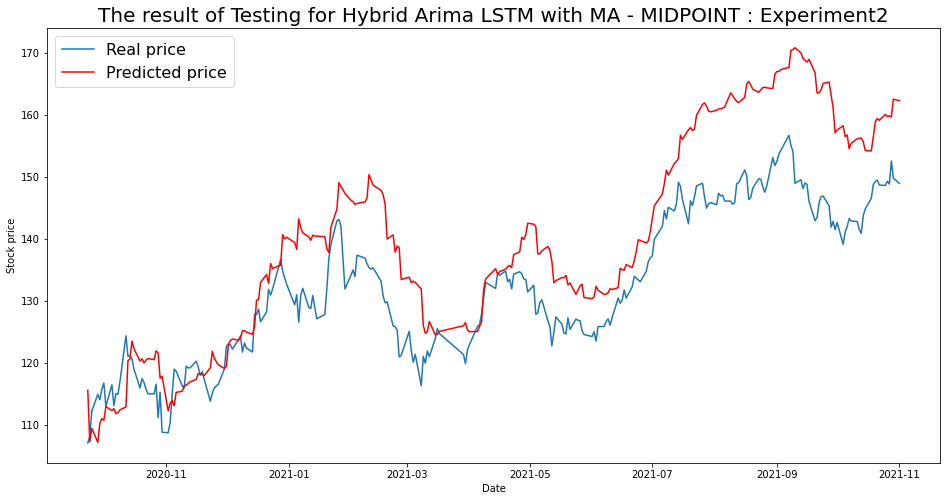

----- Test RMSE for MIDPOINT----- 10.135265684380567
----- Test_MSE_LSTM for MIDPOINT----- 102.72361049298229
----- Test_MAE_LSTM for MIDPOINT----- 8.372939983805384


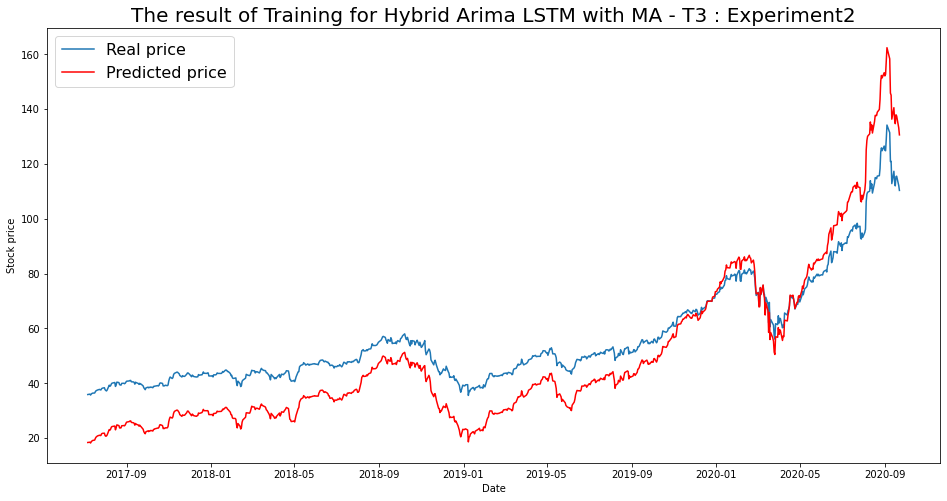

----- Train RMSE for T3 ----- 12.069596897007075
----- Train_MSE_LSTM for T3 ----- 145.67516925624284
----- Train MAE LSTM for T3 ----- 10.870868175127285


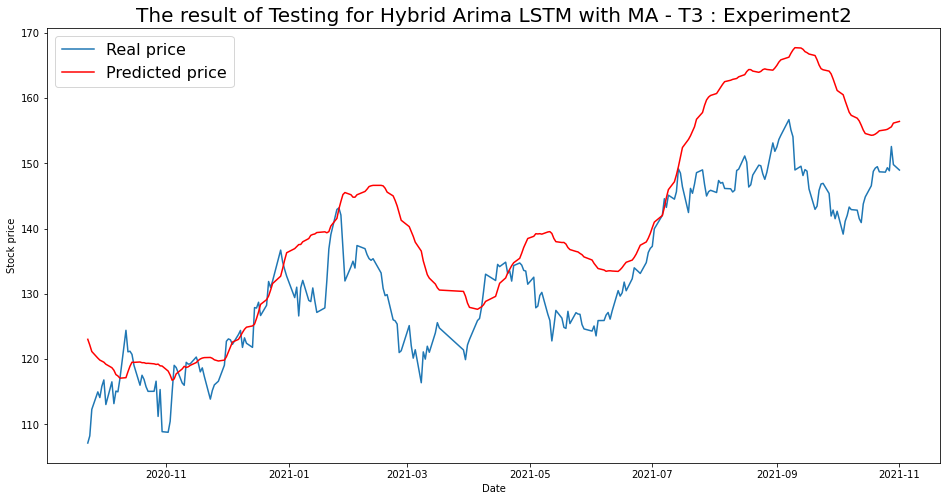

----- Test RMSE for T3----- 10.333769318274479
----- Test_MSE_LSTM for T3----- 106.78678832331099
----- Test_MAE_LSTM for T3----- 8.334873887974807


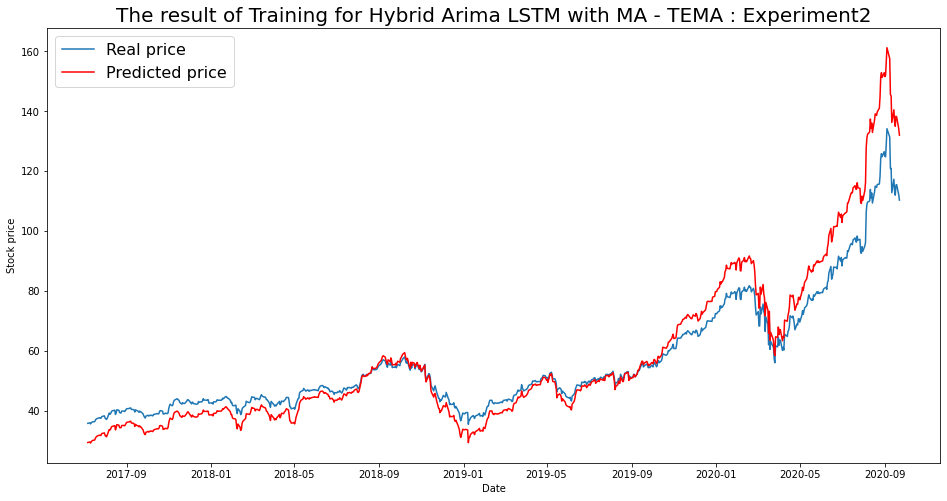

----- Train RMSE for TEMA ----- 7.440796513329569
----- Train_MSE_LSTM for TEMA ----- 55.36545275277747
----- Train MAE LSTM for TEMA ----- 5.170842815856772


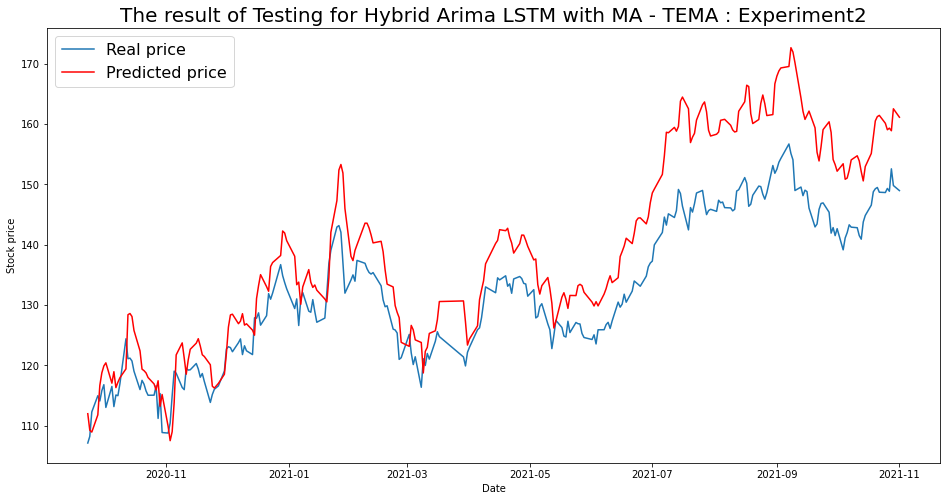

----- Test RMSE for TEMA----- 8.86953066007257
----- Test_MSE_LSTM for TEMA----- 78.66857412996737
----- Test_MAE_LSTM for TEMA----- 7.566655356961055


In [143]:
for i in range(len(list(simulation2.keys()))):
  SIM = list(simulation2.keys())[i]
  plot_train(simulation2,SIM)
  plot_test(simulation2,SIM)

## Univariate Arima Multistep MutiVariate LSTM Hybrid Model Experiment 3

In [101]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # # Option 1
    # # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()




    # Option 3
    # define custom activation
    # 
    class Double_Tanh(Activation):
        def __init__(self, activation, **kwargs):
            super(Double_Tanh, self).__init__(activation, **kwargs)
            self.__name__ = 'double_tanh'

    def double_tanh(x):
        return (K.tanh(x) * 2)

    get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
        # Model Generation
    model = Sequential()
    #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    model.add(Dense(1))
    model.add(Activation(double_tanh))
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM3.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.47 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4157.020, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3687.148, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.21 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3458.651, Time=0.07 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3322.133, Time=0.09 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.74 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.81 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3324.133, Time=0.23 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 2.688 seconds
                               SARIMAX Results                                
Dep.

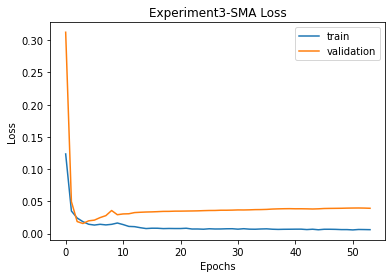


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 39.71707698339657 
RMSE:	 6.302148600548591 
MAPE:	 5.205453851116191
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.42 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4231.556, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3761.238, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.30 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3532.227, Time=0.09 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3394.496, Time=0.10 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.87 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.67 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3396.496, Time=0.2

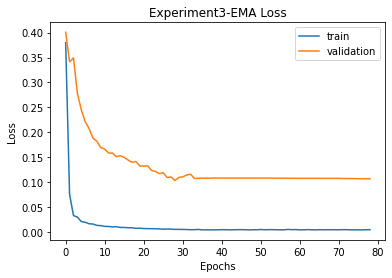


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 39.71707698339657 
RMSE:	 6.302148600548591 
MAPE:	 5.205453851116191

EMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 18.546398408821787 
RMSE:	 4.306552961339474 
MAPE:	 3.4160340524918316
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.44 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4264.089, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3793.930, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.25 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3564.923, Time=0.07 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3427.258, Time=0.09 sec
 ARIMA(3,3,1)(0,0,0)[0

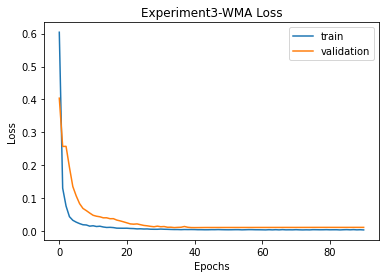


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 39.71707698339657 
RMSE:	 6.302148600548591 
MAPE:	 5.205453851116191

EMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 18.546398408821787 
RMSE:	 4.306552961339474 
MAPE:	 3.4160340524918316

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 100.42411916020163 
RMSE:	 10.021183520932126 
MAPE:	 8.070563561893302
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.44 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4436.126, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3965.317, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : A

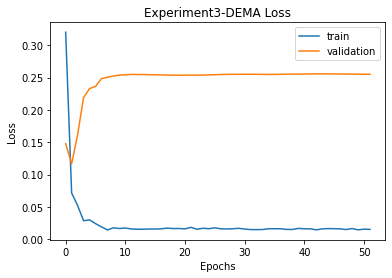


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 39.71707698339657 
RMSE:	 6.302148600548591 
MAPE:	 5.205453851116191

EMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 18.546398408821787 
RMSE:	 4.306552961339474 
MAPE:	 3.4160340524918316

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 100.42411916020163 
RMSE:	 10.021183520932126 
MAPE:	 8.070563561893302

DEMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 42.724210554814 
RMSE:	 6.536375949623308 
MAPE:	 5.453197818871469
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.34 sec
 ARIMA(0,3,0)

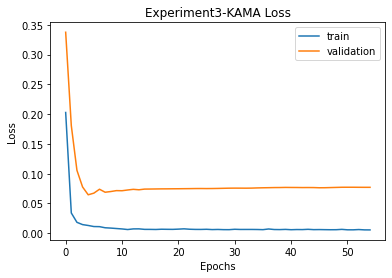


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 39.71707698339657 
RMSE:	 6.302148600548591 
MAPE:	 5.205453851116191

EMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 18.546398408821787 
RMSE:	 4.306552961339474 
MAPE:	 3.4160340524918316

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 100.42411916020163 
RMSE:	 10.021183520932126 
MAPE:	 8.070563561893302

DEMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 42.724210554814 
RMSE:	 6.536375949623308 
MAPE:	 5.453197818871469

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 23.65848136204503 
RMSE:	 4.863998495275778 
MAPE:	 3.972687129543795
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MI

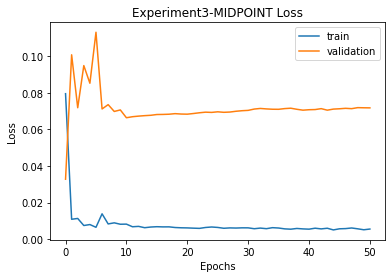


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 39.71707698339657 
RMSE:	 6.302148600548591 
MAPE:	 5.205453851116191

EMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 18.546398408821787 
RMSE:	 4.306552961339474 
MAPE:	 3.4160340524918316

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 100.42411916020163 
RMSE:	 10.021183520932126 
MAPE:	 8.070563561893302

DEMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 42.724210554814 
RMSE:	 6.536375949623308 
MAPE:	 5.453197818871469

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 23.65848136204503 
RMSE:	 4.863998495275778 
MAPE:	 3.972687129543795

MIDPOINT
Prediction vs Close:		45.9% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 21.13528196098577 
RMSE:	 4.5973124715409295 
MAPE:	 3.8079919461917573
T3
T3([input_arrays], [ti

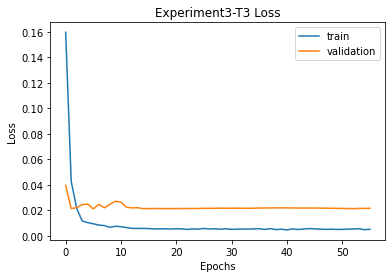


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 39.71707698339657 
RMSE:	 6.302148600548591 
MAPE:	 5.205453851116191

EMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 18.546398408821787 
RMSE:	 4.306552961339474 
MAPE:	 3.4160340524918316

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 100.42411916020163 
RMSE:	 10.021183520932126 
MAPE:	 8.070563561893302

DEMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 42.724210554814 
RMSE:	 6.536375949623308 
MAPE:	 5.453197818871469

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 23.65848136204503 
RMSE:	 4.863998495275778 
MAPE:	 3.972687129543795

MIDPOINT
Prediction vs Close:		45.9% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 21.13528196098577 
RMSE:	 4.5973124715409295 
MAPE:	 3.8079919461917573

T3
Prediction vs Close:	

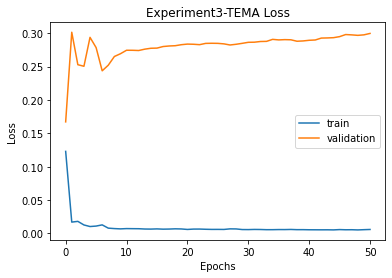


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 39.71707698339657 
RMSE:	 6.302148600548591 
MAPE:	 5.205453851116191

EMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 18.546398408821787 
RMSE:	 4.306552961339474 
MAPE:	 3.4160340524918316

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 100.42411916020163 
RMSE:	 10.021183520932126 
MAPE:	 8.070563561893302

DEMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 42.724210554814 
RMSE:	 6.536375949623308 
MAPE:	 5.453197818871469

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 23.65848136204503 
RMSE:	 4.863998495275778 
MAPE:	 3.972687129543795

MIDPOINT
Prediction vs Close:		45.9% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 21.13528196098577 
RMSE:	 4.5973124715409295 
MAPE:	 3.8079919461917573

T3
Prediction vs Close:	

In [102]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation3 = {}
    imgfile = 'Experiment3'
    for ma in optimized_period:
              print(ma)
              print(functions[ma])
              print ( int( optimized_period[ma]))
            # if ma == 'SMA':
              low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
              low_vol = low_vol.fillna(0)
              low_vol_data = df['close']
              high_vol = pd.DataFrame()
              df2 = df.copy()
              for i in df2.columns:
                if i in low_vol.columns:
                  high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
              high_vol_data = df['close']
              ## *****************************************************
              # Generate ARIMA and LSTM predictions
              print('\nWorking on ' + ma + ' predictions')
              try:
                print('parameters used : ', train_len, test_len)
                low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima(low_vol,low_vol_data, train_len, test_len)
              except:
                  print('ARIMA error, skipping to next MA type')
                  continue
              Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
              final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
              mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
              rmse_ftr = mse_ftr ** 0.5
              mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
              mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

              final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
              mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
              rmse = mse ** 0.5
              mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              # Generate prediction accuracy
              actual = df['close'].tail(test_len).values
              result_1 = []
              result_2 = []
              for i in range(1, len(final_prediction)):
                  # Compare prediction to previous close price
                  if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                      result_1.append(1)
                  elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                      result_1.append(1)
                  else:
                      result_1.append(0)

                  # Compare prediction to previous prediction
                  if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                      result_2.append(1)
                  elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                      result_2.append(1)
                  else:
                      result_2.append(0)

              accuracy_1 = np.mean(result_1)
              accuracy_2 = np.mean(result_2)

              simulation3[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                            'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                            'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                            'rmse': rmse_ftr, 'mae' : mae_ftr},
                                'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                          'rmse': rmse, 'mae': mae },
                                'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

              # save simulation data here as checkpoint
              with open('simulation3_data.json', 'w') as fp:
                  json.dump(simulation3, fp)

              for ma in simulation3.keys():
                  print('\n' + ma)
                  print('Prediction vs Close:\t\t' + str(round(100*simulation3[ma]['accuracy']['prediction vs close'], 2))
                        + '% Accuracy')
                  print('Prediction vs Prediction:\t' + str(round(100*simulation3[ma]['accuracy']['prediction vs prediction'], 2))
                        + '% Accuracy')
                  print('MSE:\t', simulation3[ma]['final']['mse'],
                        '\nRMSE:\t', simulation3[ma]['final']['rmse'],
                        '\nMAPE:\t', simulation3[ma]['final']['mae'])#,
                        # '\nMAPE:\t', simulation[ma]['final']['mape'])
            # else:
            #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [103]:
from google.colab import files
import cv2
uploaded = files.upload()

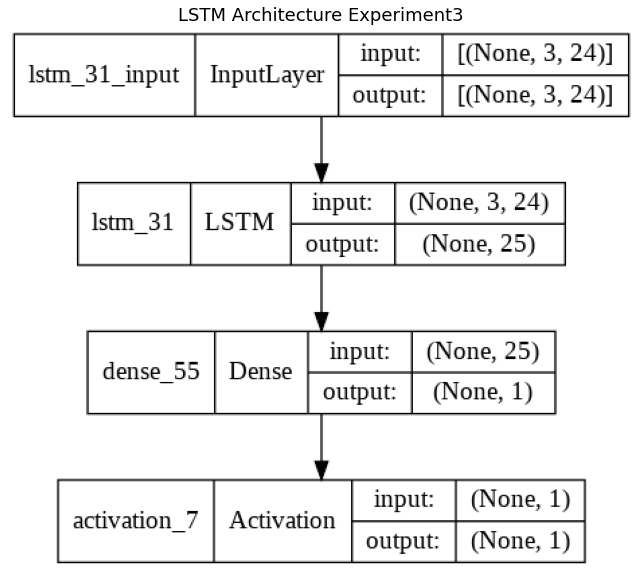

In [104]:
img = cv2.imread('Experiment3.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [144]:
with open('simulation3_data.json') as json_file:
    simulation3 = json.load(json_file)
fileimg = 'Experiment3'

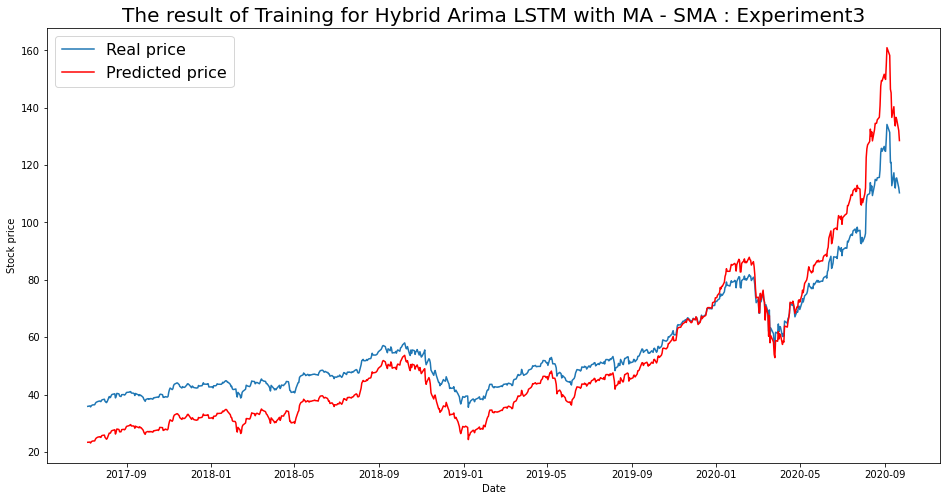

----- Train RMSE for SMA ----- 9.349037175519484
----- Train_MSE_LSTM for SMA ----- 87.40449610924534
----- Train MAE LSTM for SMA ----- 8.179049661388795


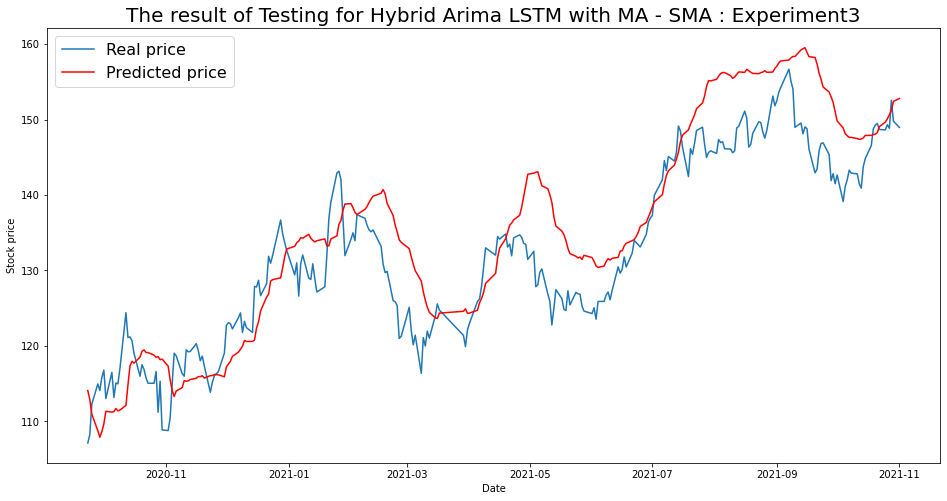

----- Test RMSE for SMA----- 6.302148600548591
----- Test_MSE_LSTM for SMA----- 39.71707698339657
----- Test_MAE_LSTM for SMA----- 5.205453851116191


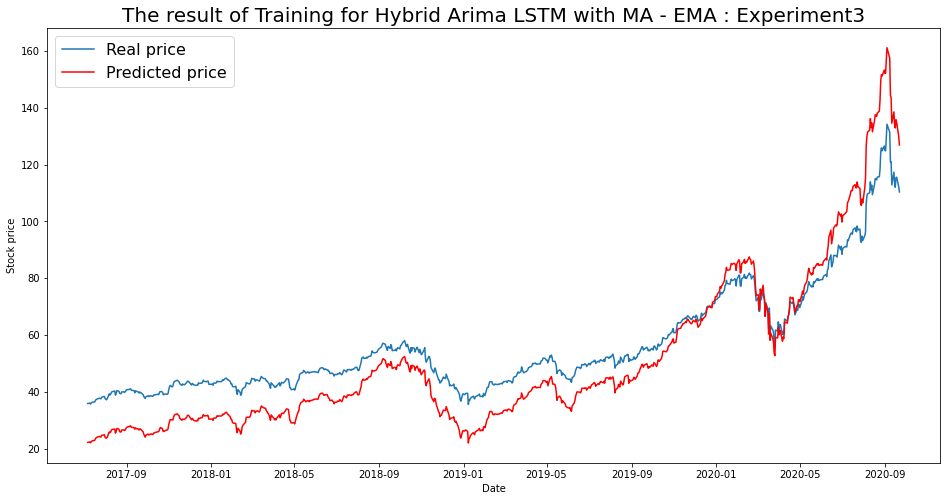

----- Train RMSE for EMA ----- 10.408056772244768
----- Train_MSE_LSTM for EMA ----- 108.32764577427017
----- Train MAE LSTM for EMA ----- 9.272168477176514


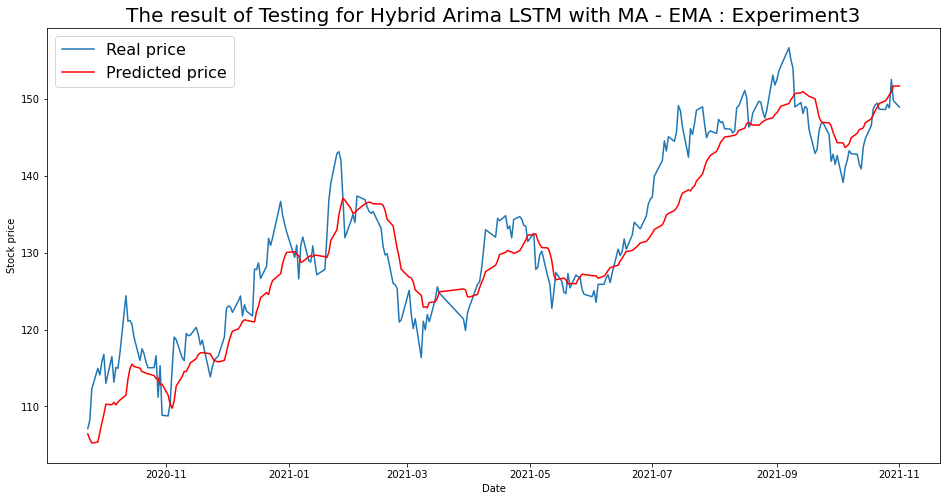

----- Test RMSE for EMA----- 4.306552961339474
----- Test_MSE_LSTM for EMA----- 18.546398408821787
----- Test_MAE_LSTM for EMA----- 3.4160340524918316


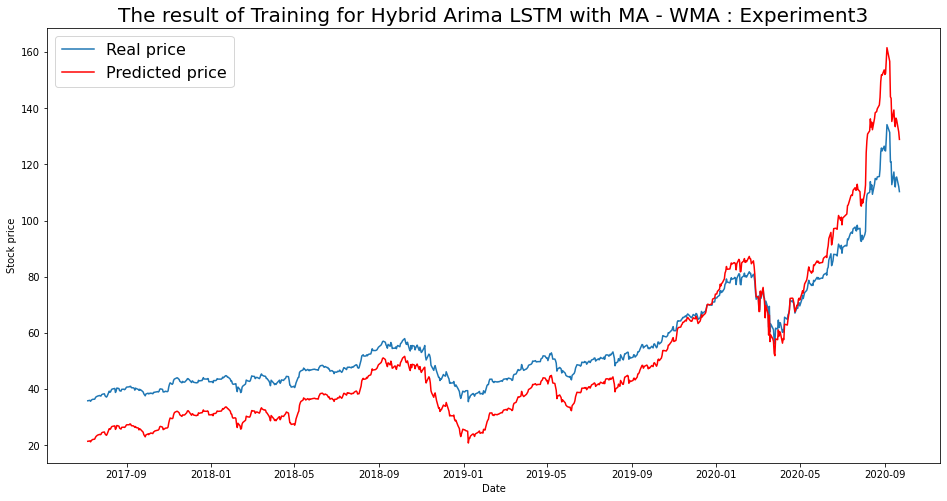

----- Train RMSE for WMA ----- 10.758673148854621
----- Train_MSE_LSTM for WMA ----- 115.7490479238854
----- Train MAE LSTM for WMA ----- 9.635844746281826


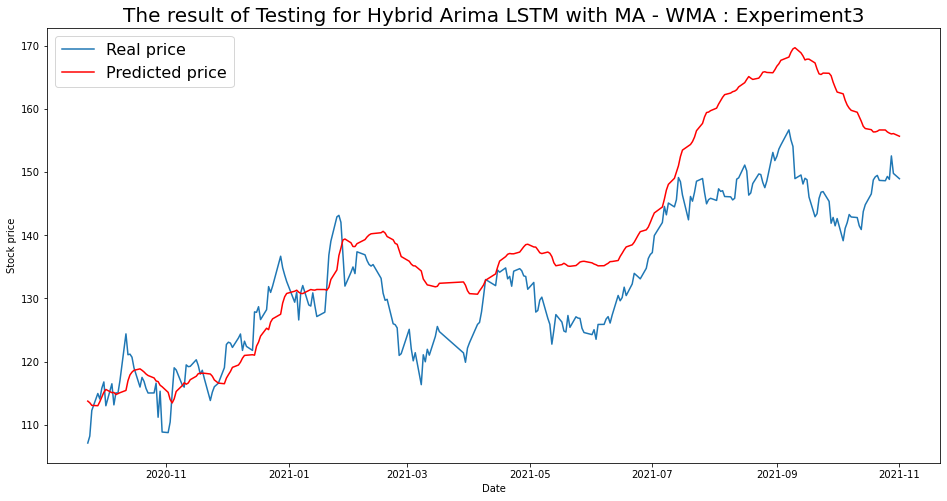

----- Test RMSE for WMA----- 10.021183520932126
----- Test_MSE_LSTM for WMA----- 100.42411916020163
----- Test_MAE_LSTM for WMA----- 8.070563561893302


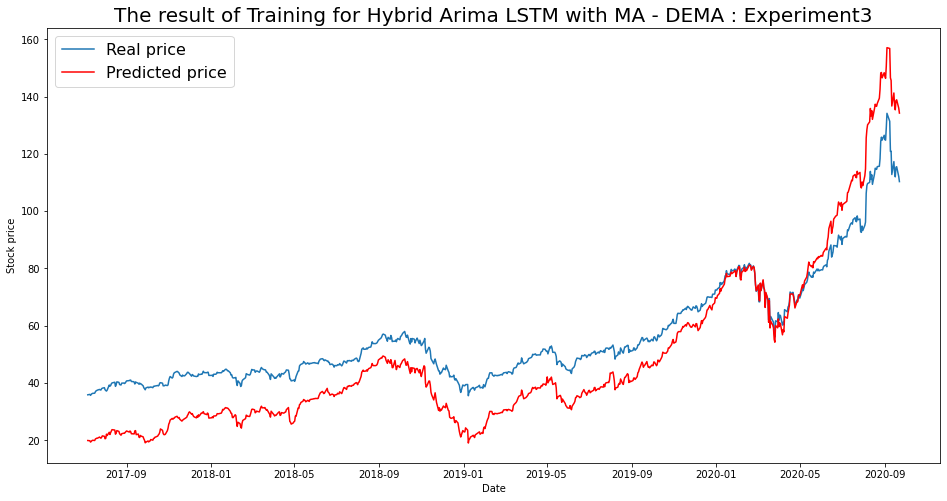

----- Train RMSE for DEMA ----- 12.471033474287747
----- Train_MSE_LSTM for DEMA ----- 155.52667591680552
----- Train MAE LSTM for DEMA ----- 11.27911882792913


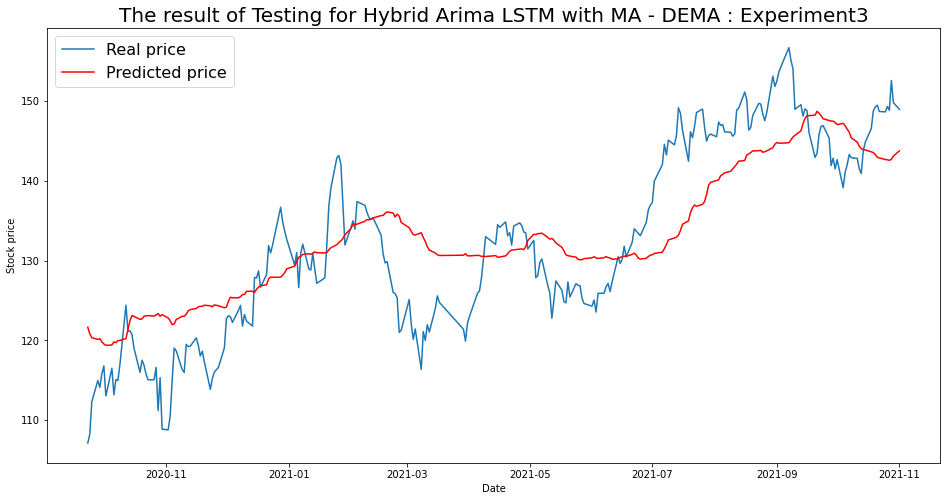

----- Test RMSE for DEMA----- 6.536375949623308
----- Test_MSE_LSTM for DEMA----- 42.724210554814
----- Test_MAE_LSTM for DEMA----- 5.453197818871469


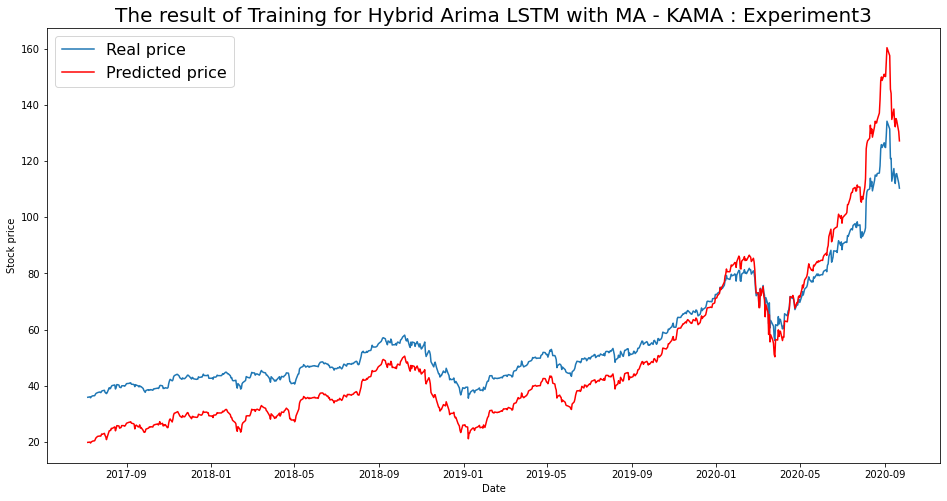

----- Train RMSE for KAMA ----- 11.226948346371925
----- Train_MSE_LSTM for KAMA ----- 126.0443691721033
----- Train MAE LSTM for KAMA ----- 10.243495551915379


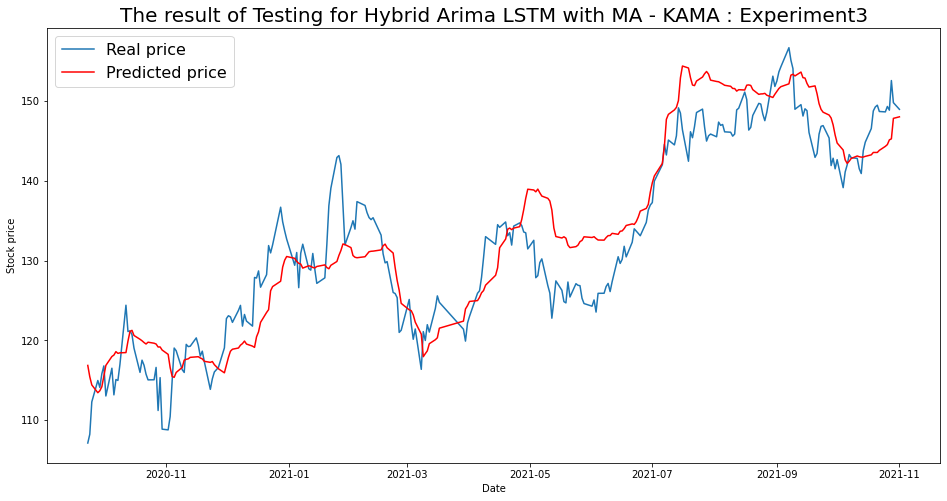

----- Test RMSE for KAMA----- 4.863998495275778
----- Test_MSE_LSTM for KAMA----- 23.65848136204503
----- Test_MAE_LSTM for KAMA----- 3.972687129543795


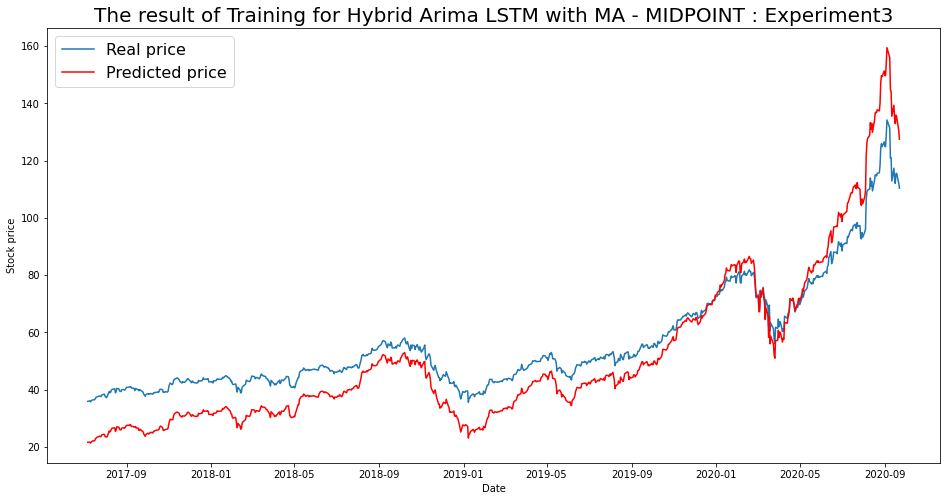

----- Train RMSE for MIDPOINT ----- 9.85503947109961
----- Train_MSE_LSTM for MIDPOINT ----- 97.1218029769313
----- Train MAE LSTM for MIDPOINT ----- 8.735687748390125


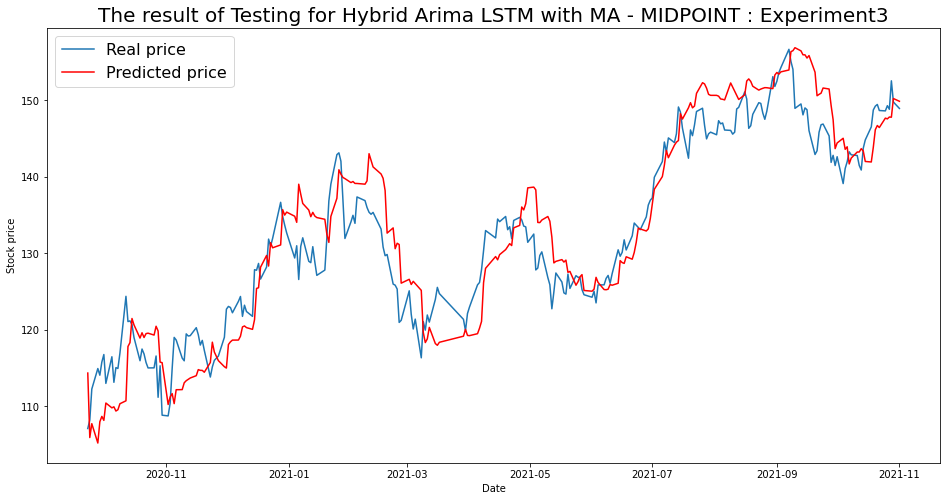

----- Test RMSE for MIDPOINT----- 4.5973124715409295
----- Test_MSE_LSTM for MIDPOINT----- 21.13528196098577
----- Test_MAE_LSTM for MIDPOINT----- 3.8079919461917573


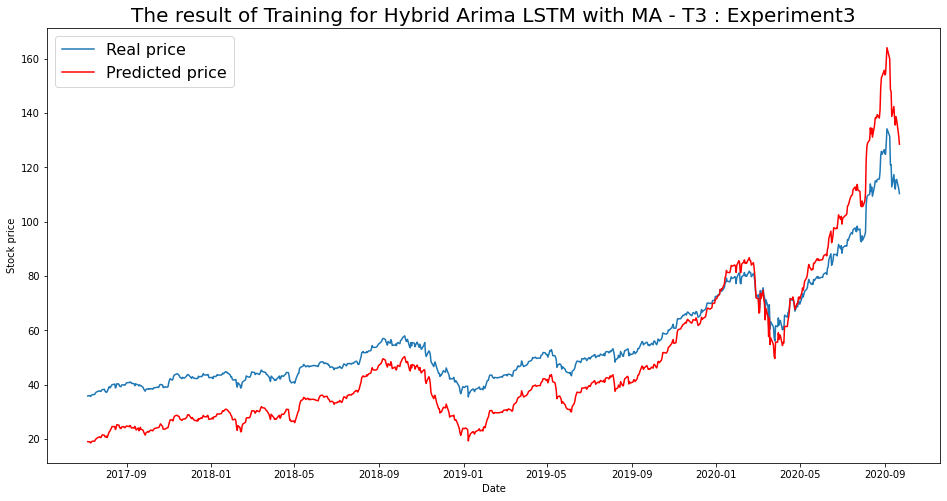

----- Train RMSE for T3 ----- 12.321219257781456
----- Train_MSE_LSTM for T3 ----- 151.8124439983246
----- Train MAE LSTM for T3 ----- 11.208239243433828


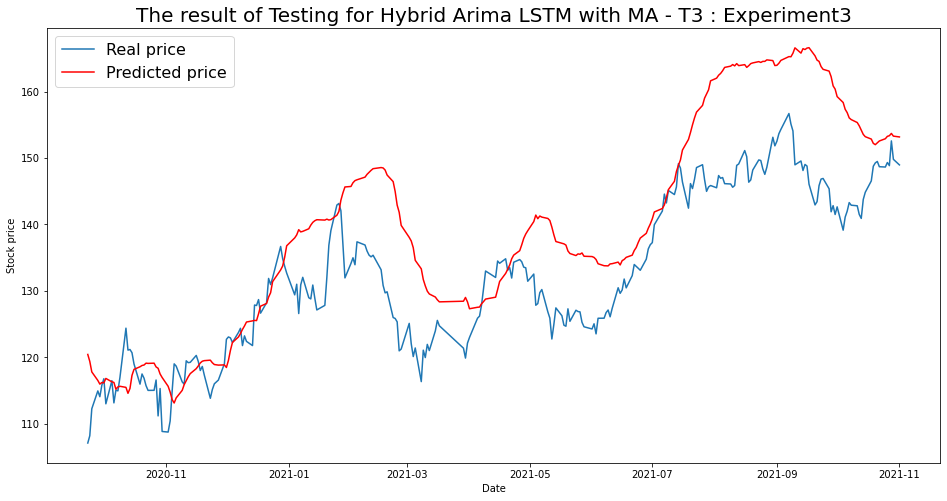

----- Test RMSE for T3----- 10.09431101894578
----- Test_MSE_LSTM for T3----- 101.89511494721017
----- Test_MAE_LSTM for T3----- 8.111172771475383


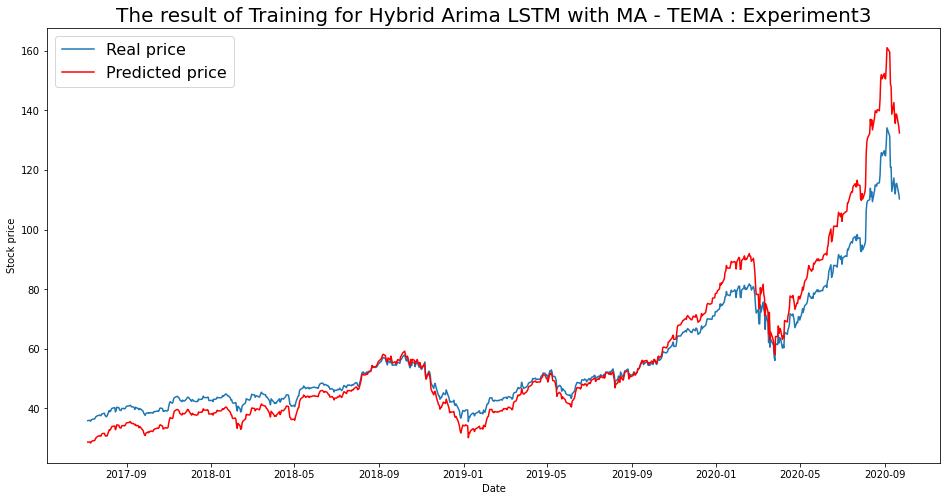

----- Train RMSE for TEMA ----- 7.47666641398143
----- Train_MSE_LSTM for TEMA ----- 55.900540665957934
----- Train MAE LSTM for TEMA ----- 5.218204706016292


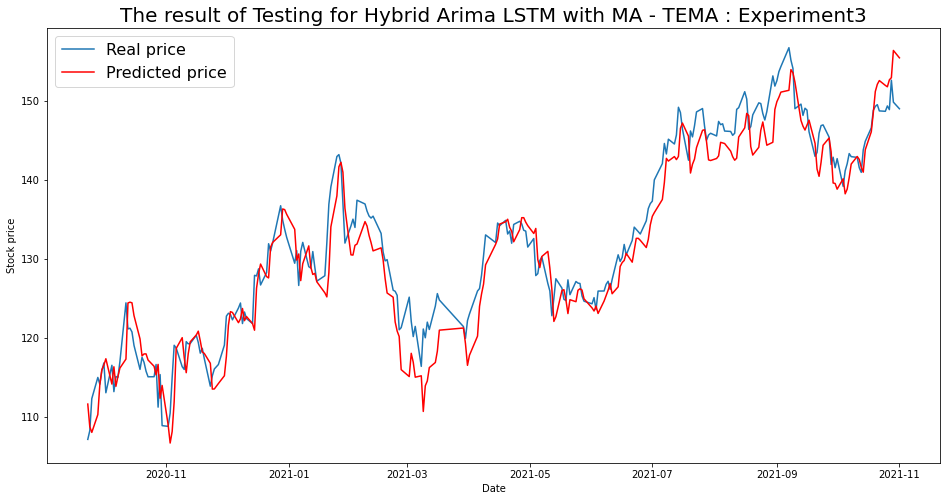

----- Test RMSE for TEMA----- 3.316477447623887
----- Test_MSE_LSTM for TEMA----- 10.999022660597852
----- Test_MAE_LSTM for TEMA----- 2.655228978622383


In [145]:
for i in range(len(list(simulation3.keys()))):
  SIM = list(simulation3.keys())[i]
  plot_train(simulation3,SIM)
  plot_test(simulation3,SIM)


## Univariate Arima Multistep MutiVariate LSTM Hybrid Model Experiment 4

From  the above experiments it is evident that with Higher moving averages the loss plots show unreoresented data and underfitting, hence keeping only the MA's that have smaller periods like T3 OR TRIMA. Going forward EMA, WMA & DEMA will be ignored.

In [106]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # # Option 1
    # # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()




    # # Option 3
    # # define custom activation
    # # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    model = Sequential()
    model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(input_dim, feature_size)))
    model.add(LSTM(units=int(lstm_len/2)))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='mean_squared_error', optimizer='adam')
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM4.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = (y_scaler.inverse_transform(predictiontr)-det).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte =( y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.45 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4157.020, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3687.148, Time=0.05 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.21 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3458.651, Time=0.09 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3322.133, Time=0.11 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.75 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.80 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3324.133, Time=0.20 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 2.697 seconds
                               SARIMAX Results                                
Dep.

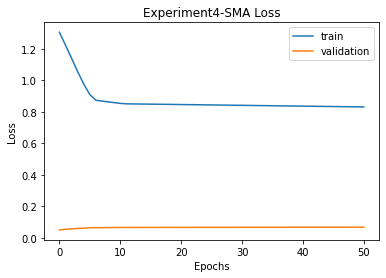


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	51.87% Accuracy
MSE:	 25.081351909450348 
RMSE:	 5.008128583557969 
MAPE:	 3.9377037384058786
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.43 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4231.556, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3761.238, Time=0.05 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3532.227, Time=0.07 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3394.496, Time=0.09 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.90 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.69 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3396.496, Time=0.

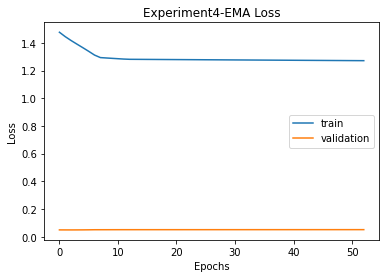


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	51.87% Accuracy
MSE:	 25.081351909450348 
RMSE:	 5.008128583557969 
MAPE:	 3.9377037384058786

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 37.86506779592453 
RMSE:	 6.153459823215273 
MAPE:	 4.830217084369749
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.43 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4264.089, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3793.930, Time=0.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.26 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3564.923, Time=0.07 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3427.258, Time=0.08 sec
 ARIMA(3,3,1)(0,0,0)[0] 

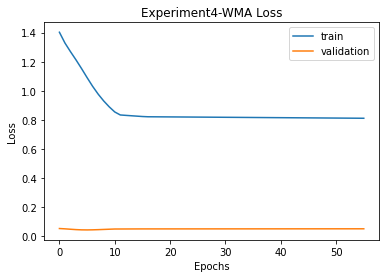


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	51.87% Accuracy
MSE:	 25.081351909450348 
RMSE:	 5.008128583557969 
MAPE:	 3.9377037384058786

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 37.86506779592453 
RMSE:	 6.153459823215273 
MAPE:	 4.830217084369749

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 53.37812690087662 
RMSE:	 7.306033595657539 
MAPE:	 5.95316326588041
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.42 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4436.126, Time=0.03 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3965.317, Time=0.05 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=in

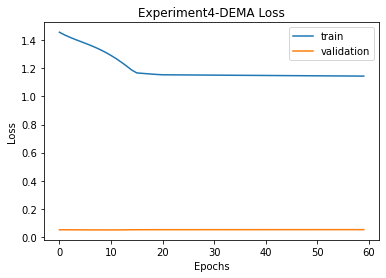


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	51.87% Accuracy
MSE:	 25.081351909450348 
RMSE:	 5.008128583557969 
MAPE:	 3.9377037384058786

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 37.86506779592453 
RMSE:	 6.153459823215273 
MAPE:	 4.830217084369749

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 53.37812690087662 
RMSE:	 7.306033595657539 
MAPE:	 5.95316326588041

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 133.19678136227444 
RMSE:	 11.541090995320783 
MAPE:	 10.29859546777107
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(0,3,0)(

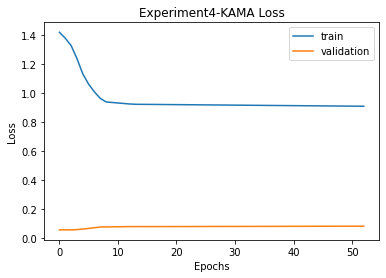


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	51.87% Accuracy
MSE:	 25.081351909450348 
RMSE:	 5.008128583557969 
MAPE:	 3.9377037384058786

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 37.86506779592453 
RMSE:	 6.153459823215273 
MAPE:	 4.830217084369749

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 53.37812690087662 
RMSE:	 7.306033595657539 
MAPE:	 5.95316326588041

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 133.19678136227444 
RMSE:	 11.541090995320783 
MAPE:	 10.29859546777107

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 20.693935177088164 
RMSE:	 4.549058713304123 
MAPE:	 3.6577262429810227
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on M

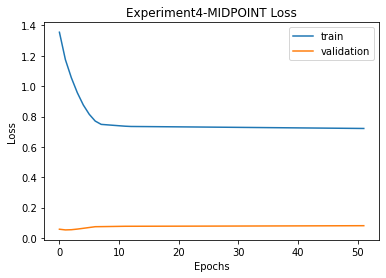


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	51.87% Accuracy
MSE:	 25.081351909450348 
RMSE:	 5.008128583557969 
MAPE:	 3.9377037384058786

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 37.86506779592453 
RMSE:	 6.153459823215273 
MAPE:	 4.830217084369749

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 53.37812690087662 
RMSE:	 7.306033595657539 
MAPE:	 5.95316326588041

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 133.19678136227444 
RMSE:	 11.541090995320783 
MAPE:	 10.29859546777107

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 20.693935177088164 
RMSE:	 4.549058713304123 
MAPE:	 3.6577262429810227

MIDPOINT
Prediction vs Close:		48.13% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 18.24421544500263 
RMSE:	 4.271324788049093 
MAPE:	 3.3887721441386436
T3
T3([input_arrays], [

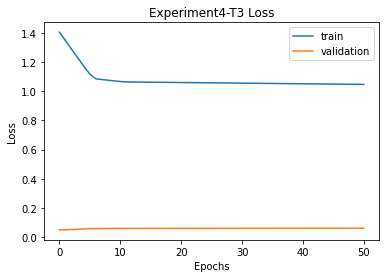


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	51.87% Accuracy
MSE:	 25.081351909450348 
RMSE:	 5.008128583557969 
MAPE:	 3.9377037384058786

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 37.86506779592453 
RMSE:	 6.153459823215273 
MAPE:	 4.830217084369749

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 53.37812690087662 
RMSE:	 7.306033595657539 
MAPE:	 5.95316326588041

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 133.19678136227444 
RMSE:	 11.541090995320783 
MAPE:	 10.29859546777107

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 20.693935177088164 
RMSE:	 4.549058713304123 
MAPE:	 3.6577262429810227

MIDPOINT
Prediction vs Close:		48.13% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 18.24421544500263 
RMSE:	 4.271324788049093 
MAPE:	 3.3887721441386436

T3
Prediction vs Close

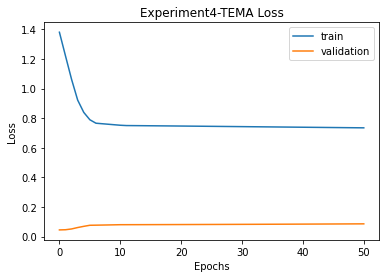


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	51.87% Accuracy
MSE:	 25.081351909450348 
RMSE:	 5.008128583557969 
MAPE:	 3.9377037384058786

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 37.86506779592453 
RMSE:	 6.153459823215273 
MAPE:	 4.830217084369749

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 53.37812690087662 
RMSE:	 7.306033595657539 
MAPE:	 5.95316326588041

DEMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 133.19678136227444 
RMSE:	 11.541090995320783 
MAPE:	 10.29859546777107

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 20.693935177088164 
RMSE:	 4.549058713304123 
MAPE:	 3.6577262429810227

MIDPOINT
Prediction vs Close:		48.13% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 18.24421544500263 
RMSE:	 4.271324788049093 
MAPE:	 3.3887721441386436

T3
Prediction vs Close

In [107]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation4 = {}
    imgfile = 'Experiment4'
    for ma in optimized_period:
              print(ma)
              print(functions[ma])
              print ( int( optimized_period[ma]))
            # if ma == 'SMA':
              low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
              low_vol = low_vol.fillna(0)
              low_vol_data = df['close']
              high_vol = pd.DataFrame()
              df2 = df.copy()
              for i in df2.columns:
                if i in low_vol.columns:
                  high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
              high_vol_data = df['close']
              ## *****************************************************
              # Generate ARIMA and LSTM predictions
              print('\nWorking on ' + ma + ' predictions')
              try:
                print('parameters used : ', train_len, test_len)
                low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima(low_vol,low_vol_data, train_len, test_len)
              except:
                  print('ARIMA error, skipping to next MA type')
                  continue
              Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
              final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
              mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
              rmse_ftr = mse_ftr ** 0.5
              mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
              mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

              final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
              mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
              rmse = mse ** 0.5
              mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              # Generate prediction accuracy
              actual = df['close'].tail(test_len).values
              result_1 = []
              result_2 = []
              for i in range(1, len(final_prediction)):
                  # Compare prediction to previous close price
                  if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                      result_1.append(1)
                  elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                      result_1.append(1)
                  else:
                      result_1.append(0)

                  # Compare prediction to previous prediction
                  if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                      result_2.append(1)
                  elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                      result_2.append(1)
                  else:
                      result_2.append(0)

              accuracy_1 = np.mean(result_1)
              accuracy_2 = np.mean(result_2)

              simulation4[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                            'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                            'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                            'rmse': rmse_ftr, 'mae' : mae_ftr},
                                'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                          'rmse': rmse, 'mae': mae },
                                'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

              # save simulation data here as checkpoint
              with open('simulation4_data.json', 'w') as fp:
                  json.dump(simulation4, fp)

              for ma in simulation4.keys():
                  print('\n' + ma)
                  print('Prediction vs Close:\t\t' + str(round(100*simulation4[ma]['accuracy']['prediction vs close'], 2))
                        + '% Accuracy')
                  print('Prediction vs Prediction:\t' + str(round(100*simulation4[ma]['accuracy']['prediction vs prediction'], 2))
                        + '% Accuracy')
                  print('MSE:\t', simulation4[ma]['final']['mse'],
                        '\nRMSE:\t', simulation4[ma]['final']['rmse'],
                        '\nMAPE:\t', simulation4[ma]['final']['mae'])#,
                        # '\nMAPE:\t', simulation[ma]['final']['mape'])
            # else:
            #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [108]:
from google.colab import files
import cv2
uploaded = files.upload()

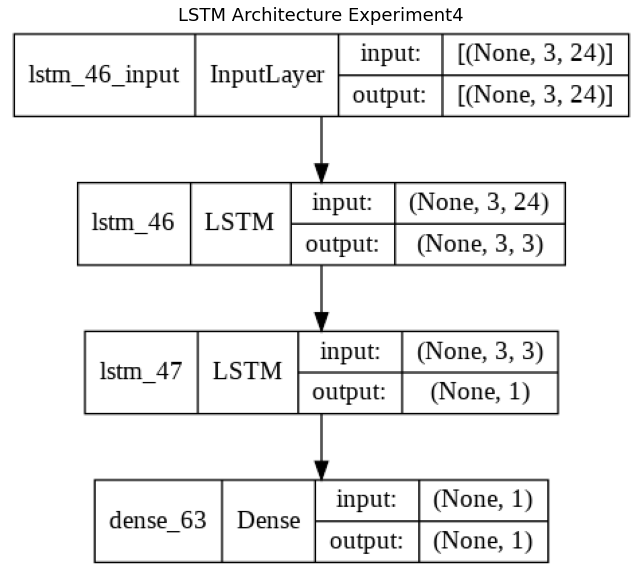

In [109]:
img = cv2.imread('Experiment4.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [146]:
with open('simulation4_data.json') as json_file:
    simulation4 = json.load(json_file)
fileimg = 'Experiment4'

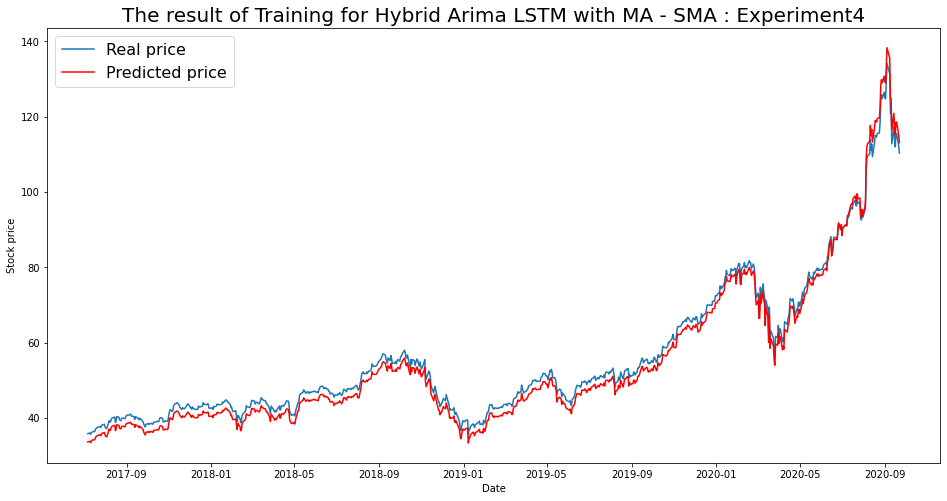

----- Train RMSE for SMA ----- 2.1639669204351253
----- Train_MSE_LSTM for SMA ----- 4.68275283273748
----- Train MAE LSTM for SMA ----- 2.1075676549779305


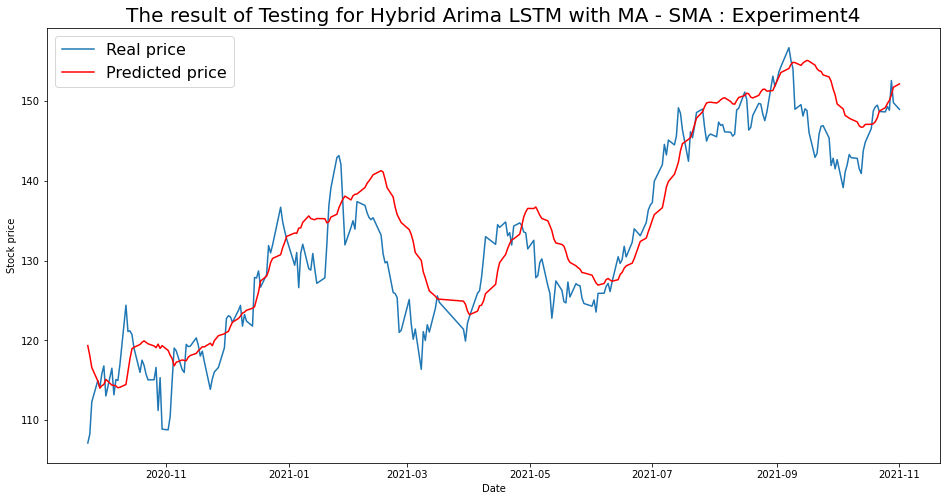

----- Test RMSE for SMA----- 5.008128583557969
----- Test_MSE_LSTM for SMA----- 25.081351909450348
----- Test_MAE_LSTM for SMA----- 3.9377037384058786


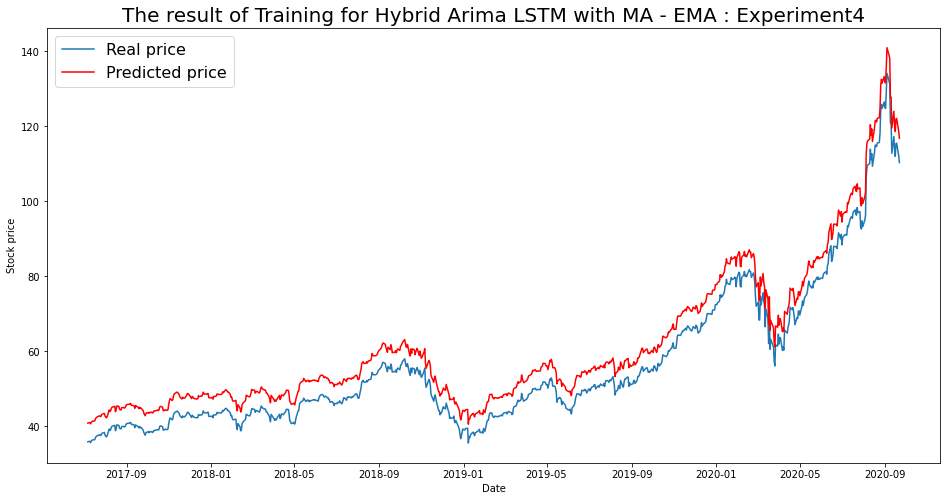

----- Train RMSE for EMA ----- 5.204058044811815
----- Train_MSE_LSTM for EMA ----- 27.082220133770573
----- Train MAE LSTM for EMA ----- 5.18856418958985


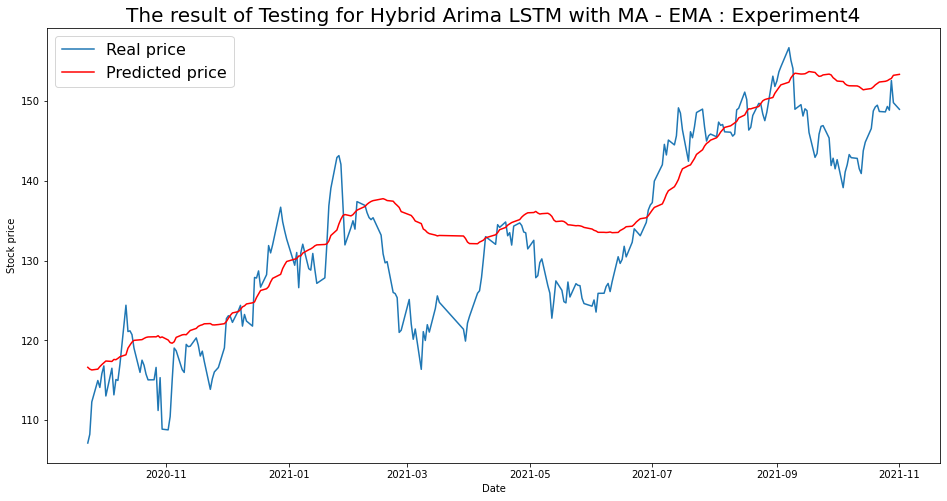

----- Test RMSE for EMA----- 6.153459823215273
----- Test_MSE_LSTM for EMA----- 37.86506779592453
----- Test_MAE_LSTM for EMA----- 4.830217084369749


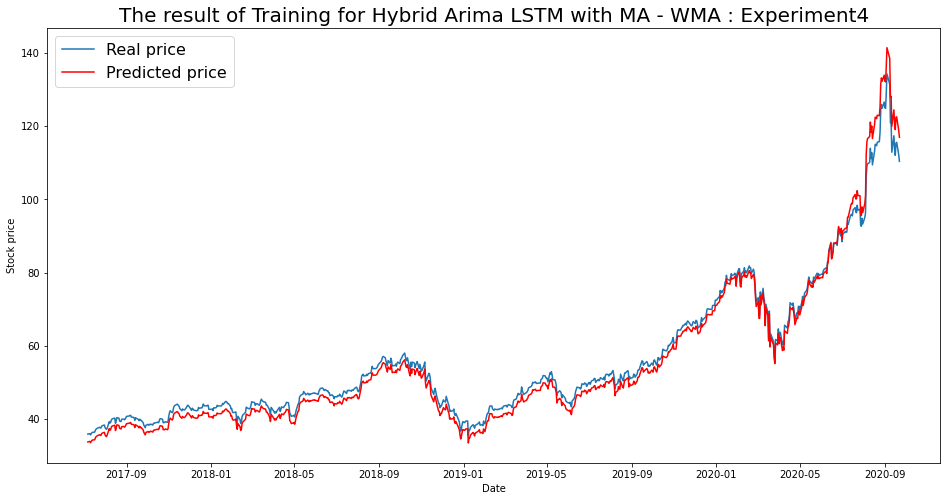

----- Train RMSE for WMA ----- 2.3492817584355308
----- Train_MSE_LSTM for WMA ----- 5.519124780517939
----- Train MAE LSTM for WMA ----- 2.050265444387304


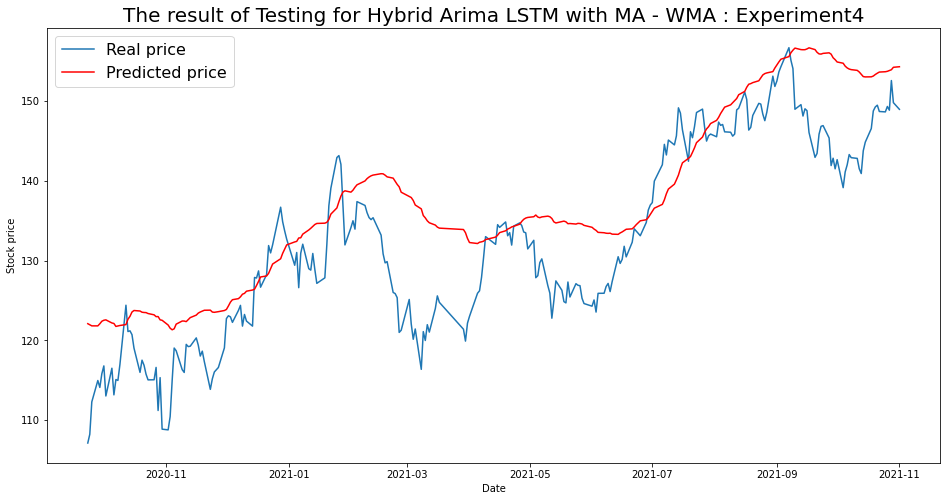

----- Test RMSE for WMA----- 7.306033595657539
----- Test_MSE_LSTM for WMA----- 53.37812690087662
----- Test_MAE_LSTM for WMA----- 5.95316326588041


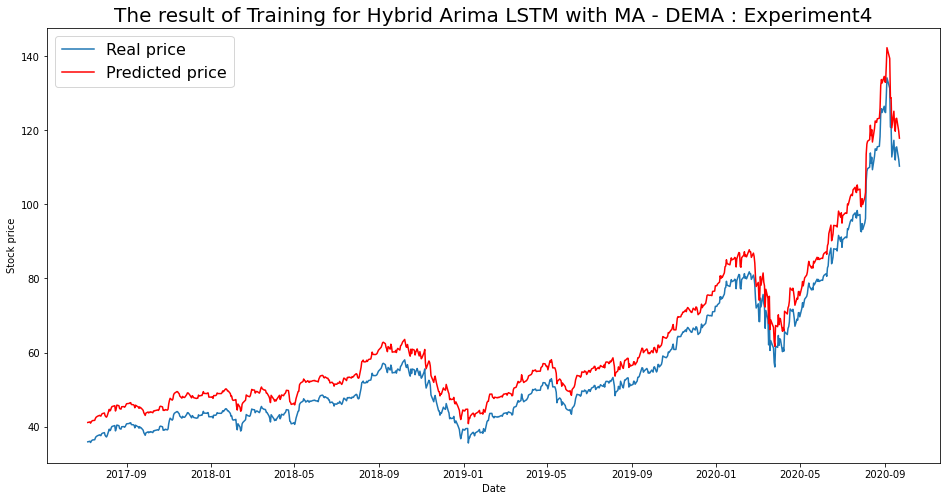

----- Train RMSE for DEMA ----- 5.563977433104181
----- Train_MSE_LSTM for DEMA ----- 30.957844876092594
----- Train MAE LSTM for DEMA ----- 5.534693951653962


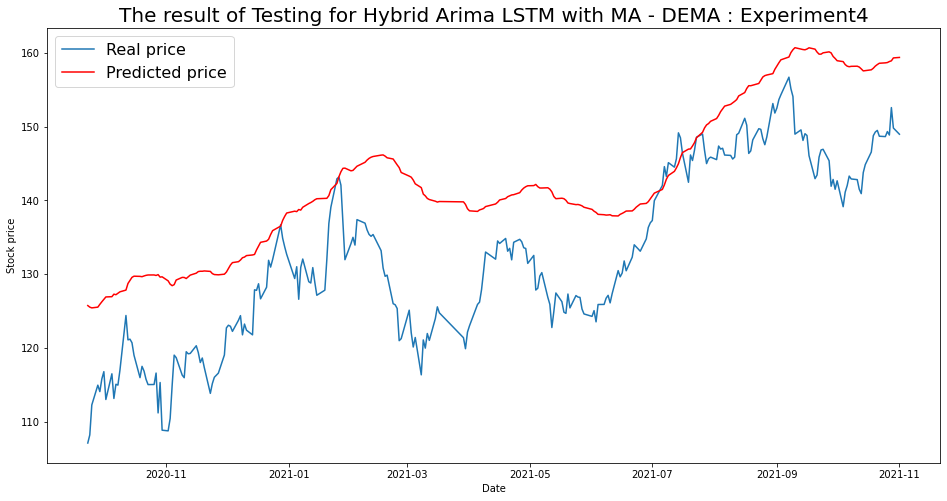

----- Test RMSE for DEMA----- 11.541090995320783
----- Test_MSE_LSTM for DEMA----- 133.19678136227444
----- Test_MAE_LSTM for DEMA----- 10.29859546777107


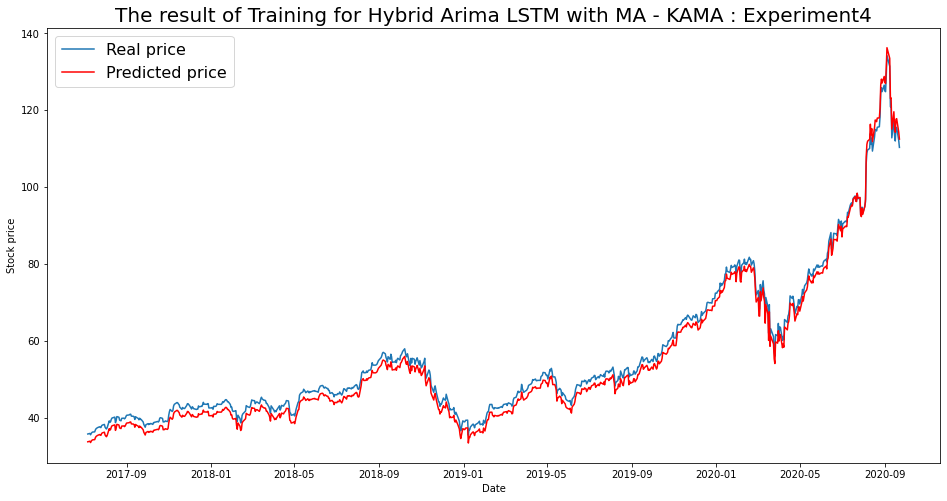

----- Train RMSE for KAMA ----- 1.9630444354122671
----- Train_MSE_LSTM for KAMA ----- 3.8535434554030665
----- Train MAE LSTM for KAMA ----- 1.943726107625678


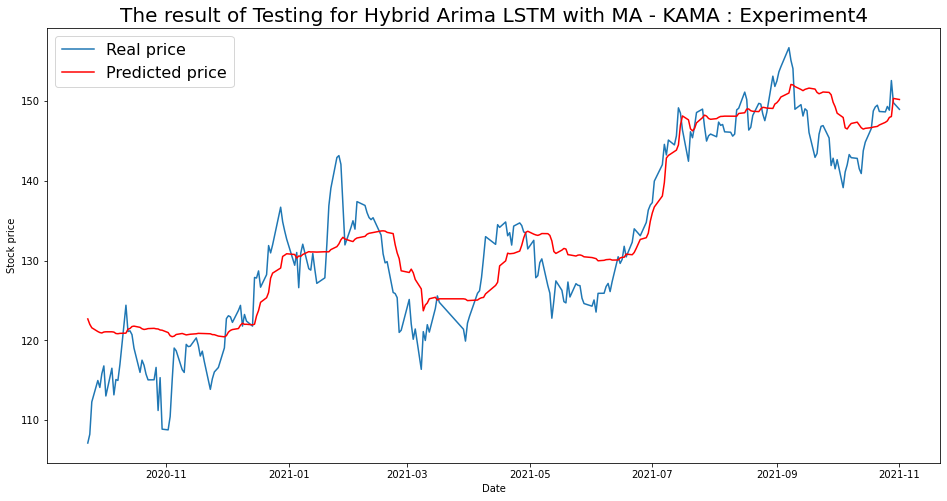

----- Test RMSE for KAMA----- 4.549058713304123
----- Test_MSE_LSTM for KAMA----- 20.693935177088164
----- Test_MAE_LSTM for KAMA----- 3.6577262429810227


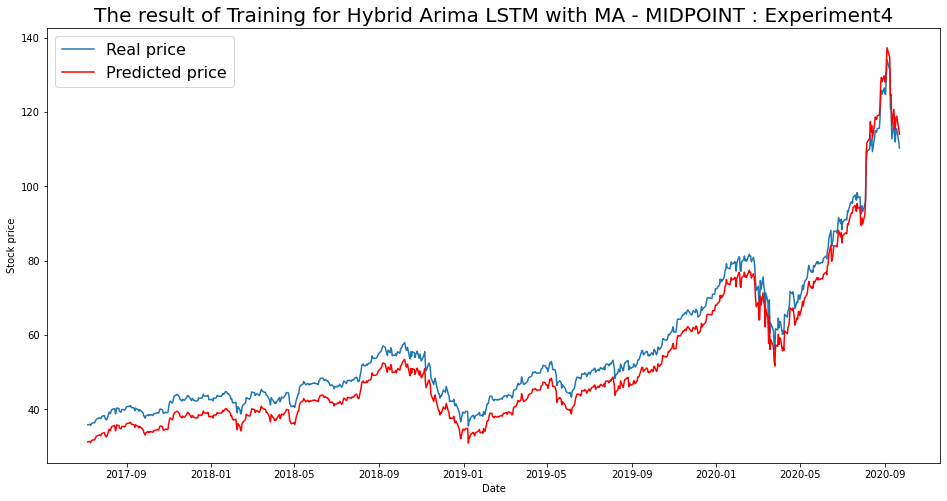

----- Train RMSE for MIDPOINT ----- 4.428587416955797
----- Train_MSE_LSTM for MIDPOINT ----- 19.612386509619217
----- Train MAE LSTM for MIDPOINT ----- 4.4129323463628785


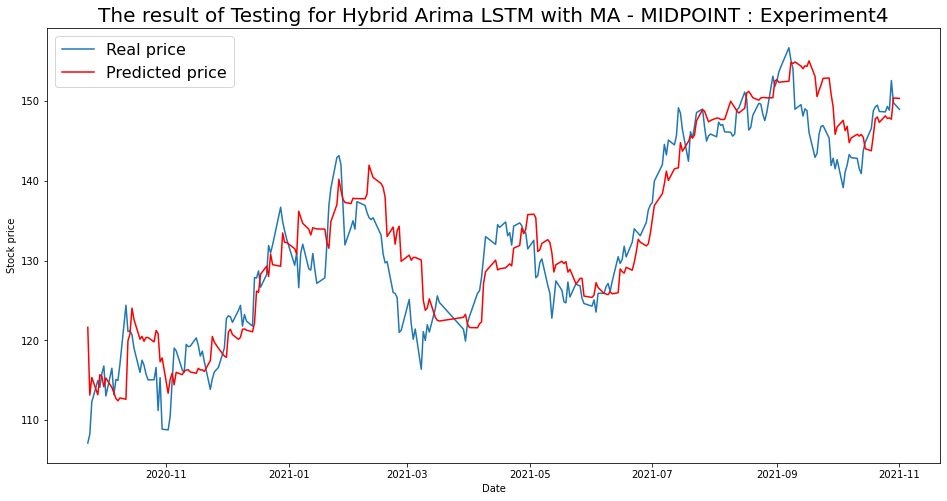

----- Test RMSE for MIDPOINT----- 4.271324788049093
----- Test_MSE_LSTM for MIDPOINT----- 18.24421544500263
----- Test_MAE_LSTM for MIDPOINT----- 3.3887721441386436


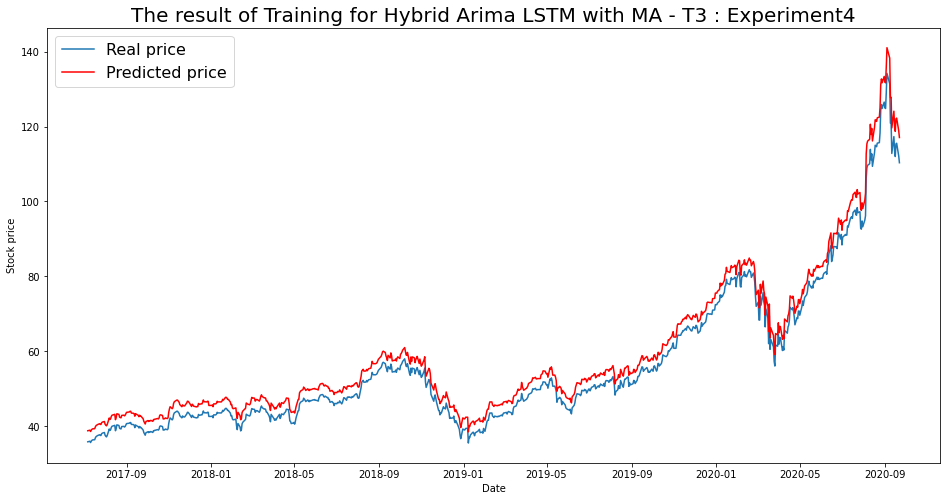

----- Train RMSE for T3 ----- 3.3089997289158237
----- Train_MSE_LSTM for T3 ----- 10.949479205964995
----- Train MAE LSTM for T3 ----- 3.209559452415693


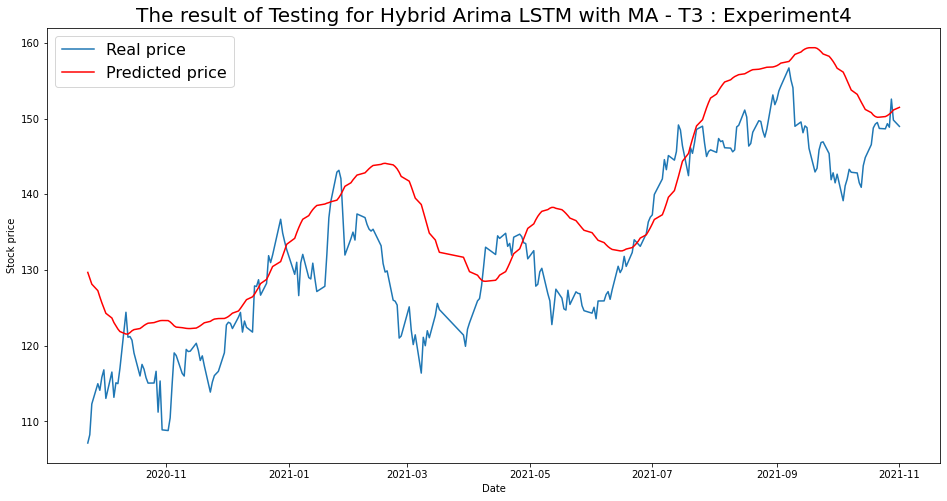

----- Test RMSE for T3----- 8.655730725901707
----- Test_MSE_LSTM for T3----- 74.9216743993189
----- Test_MAE_LSTM for T3----- 7.03412901576443


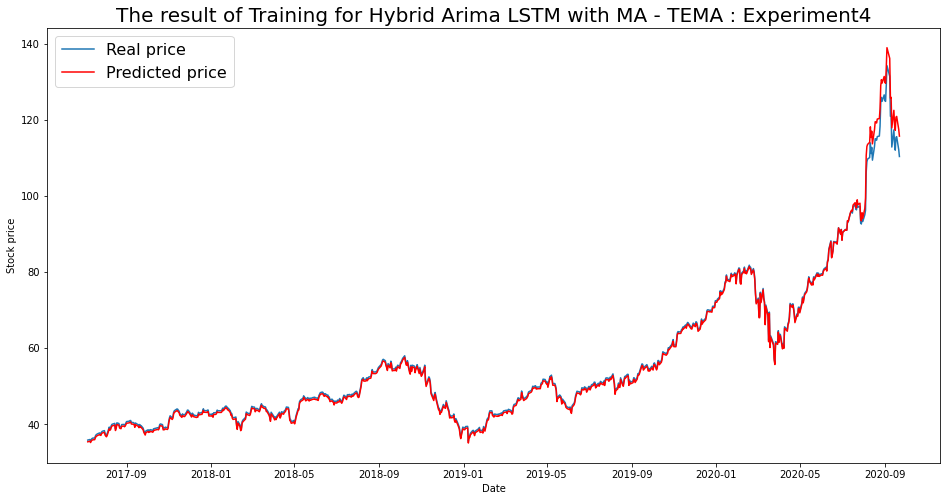

----- Train RMSE for TEMA ----- 1.0554541673050564
----- Train_MSE_LSTM for TEMA ----- 1.1139834992816098
----- Train MAE LSTM for TEMA ----- 0.602800428277195


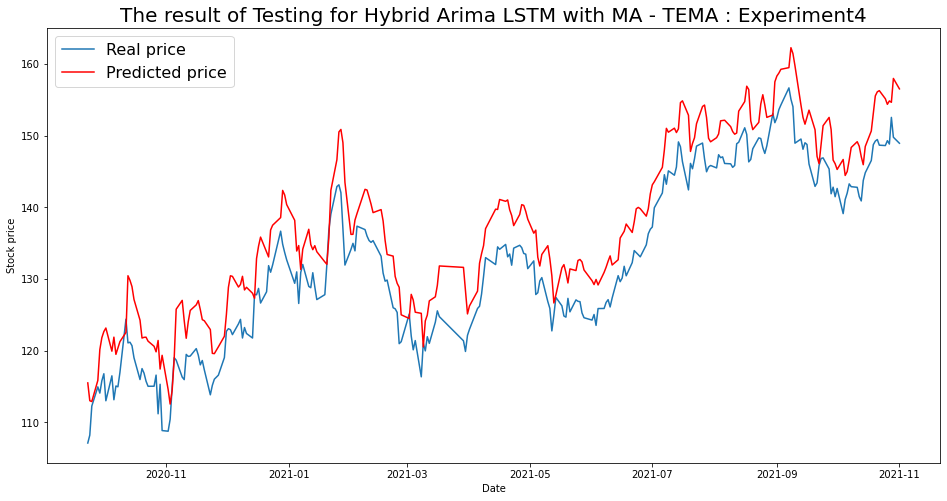

----- Test RMSE for TEMA----- 5.799675429452453
----- Test_MSE_LSTM for TEMA----- 33.63623508699449
----- Test_MAE_LSTM for TEMA----- 5.291282498785388


In [147]:
for i in range(len(list(simulation4.keys()))):
  SIM = list(simulation4.keys())[i]
  plot_train(simulation4,SIM)
  plot_test(simulation4,SIM)

## Arima w Exogenous Variable Multistep MutiVariate LSTM Hybrid Model Experiment 5

In [114]:
def get_arima_exog(dataframe,original_data, train_len, test_len):    
    

    # prepare train and test data for exogenous vr
    X_value = pd.DataFrame(low_vol.iloc[:, :])
    y_value = pd.DataFrame(low_vol.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    X_scale_dataset = X_scaler.fit_transform(X_value)
    y_scale_dataset = y_scaler.fit_transform(y_value)
    # Get data and check shape
    # X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X_scale_dataset)
    y_train, y_test, = split_train_test(y_scale_dataset)
    yc_train,yc_test = split_train_test(low_vol_data)
    yc = yc_test.values.tolist()
    y_train_list = y_train.flatten().tolist()
    y_test_list = y_test.flatten().tolist()
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

    # Initialize model
    model = auto_arima(y_train_list,exogenous  = X_train,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
            suppress_warnings=True,stepwise=True,seasonal=True)

      # Determine model parameters
    print(model.summary())
    model.fit(y_train_list,maxiter=200)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

      # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
        model = pmdarima.ARIMA(order=order)
        model.fit(y_train_list)
        # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')

        prediction.append(model.predict()[0])
        y_train_list.append(y_test_list[i])

    predictionte = y_scaler.inverse_transform(np.array(prediction).reshape(-1,1))
    y_test_ = y_scaler.inverse_transform(np.array(y_test_list).reshape(-1,1))

    # Generate error data
    mse = mean_squared_error(yc_test, predictionte)
    rmse = mse ** 0.5
    mae = mean_absolute_error(y_test_ , predictionte )
    return yc,predictionte.flatten().tolist(), mse, rmse, mae

In [115]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    model = Sequential()
    model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    model.add(Dense(units=64,activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(units=output_dim))
    model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    ## Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM5.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()


    # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 3
    # define custom activation
    # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(input_dim, feature_size)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM5.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16999.786, Time=3.27 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14568.592, Time=4.65 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15578.394, Time=8.47 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14566.592, Time=6.72 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16966.361, Time=9.33 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-16121.635, Time=9.70 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-17214.069, Time=13.01 sec
 ARIMA(0,3,3)(0,0,0)[0]             : AIC=-14562.592, Time=9.54 sec
 ARIMA(1,3,3)(0,0,0)[0]             : AIC=-14572.319, Time=9.31 sec
 ARIMA(0,3,2)(0,0,0)[0] intercept   : AIC=-14403.474, Time=41.51 sec

Best model:  ARIMA(0,3,2)(0,0,0)[0]          
Total

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.56547, saving model to LSTM5.h5
48/48 - 2s - loss: 0.2090 - val_loss: 0.5655 - lr: 0.0010 - 2s/epoch - 43ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.56547 to 0.03066, saving model to LSTM5.h5
48/48 - 0s - loss: 0.1069 - val_loss: 0.0307 - lr: 0.0010 - 405ms/epoch - 8ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.03066
48/48 - 0s - loss: 0.2029 - val_loss: 0.6358 - lr: 0.0010 - 454ms/epoch - 9ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.03066 to 0.02836, saving model to LSTM5.h5
48/48 - 0s - loss: 0.0706 - val_loss: 0.0284 - lr: 0.0010 - 400ms/epoch - 8ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.02836
48/48 - 0s - loss: 0.0601 - val_loss: 0.1206 - lr: 0.0010 - 448ms/epoch - 9ms/step
Epoch 6/500

Epoch 00006: val_loss improved from 0.02836 to 0.01619, saving model to LSTM5.h5
48/48 - 0s - loss: 0.0450 - val_loss: 0.0162 - lr: 0.0010 - 449ms/epoch - 9ms/step
Epoc

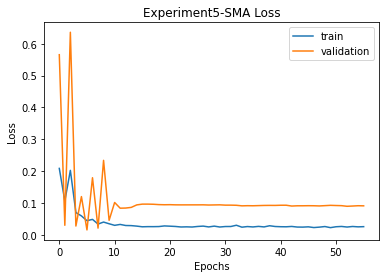


SMA
Prediction vs Close:		46.27% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 22.905457367129987 
RMSE:	 4.785964622427749 
MAPE:	 4.003866138329542
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16999.778, Time=3.17 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14568.589, Time=4.74 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-14606.447, Time=6.20 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14566.589, Time=6.93 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15343.613, Time=10.18 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-15047.583, Time=13.32 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-16858.964, Time=11.76 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-17024.022, Time=5.75 sec
 ARIMA(3,3,0)(0,0,0)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16997.990, Time=3.47 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16992.667, Time=4.34 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 96.671 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.726
Date:                Sun, 12 Dec 2021   AIC                         -17081.451
Time:                        15:13:34   BIC                         -16945.417
Sample:                             0   HQIC                        -17029.208
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.21948, saving model to LSTM5.h5
16/16 - 2s - loss: 0.6907 - val_loss: 0.2195 - lr: 0.0010 - 2s/epoch - 130ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.21948 to 0.03167, saving model to LSTM5.h5
16/16 - 0s - loss: 0.2540 - val_loss: 0.0317 - lr: 0.0010 - 162ms/epoch - 10ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.03167
16/16 - 0s - loss: 0.0860 - val_loss: 0.1915 - lr: 0.0010 - 161ms/epoch - 10ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.03167
16/16 - 0s - loss: 0.0661 - val_loss: 0.1009 - lr: 0.0010 - 163ms/epoch - 10ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.03167
16/16 - 0s - loss: 0.0508 - val_loss: 0.0429 - lr: 0.0010 - 153ms/epoch - 10ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.03167
16/16 - 0s - loss: 0.0497 - val_loss: 0.1203 - lr: 0.0010 - 140ms/epoch - 9ms/step
Epoch 7/500

Epoch 00007: ReduceLROnPlateau reducing learni

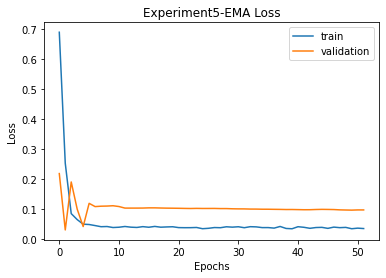


SMA
Prediction vs Close:		46.27% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 22.905457367129987 
RMSE:	 4.785964622427749 
MAPE:	 4.003866138329542

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	44.03% Accuracy
MSE:	 24.329194491765858 
RMSE:	 4.932463328983385 
MAPE:	 4.099346553838579
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16999.780, Time=3.20 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14568.589, Time=4.50 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16789.784, Time=12.14 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14566.589, Time=7.21 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16919.987, Time=9.59 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-14616.097, Time=12.21 sec

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.02747, saving model to LSTM5.h5
17/17 - 2s - loss: 0.2646 - val_loss: 0.0275 - lr: 0.0010 - 2s/epoch - 103ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.02747
17/17 - 0s - loss: 0.1004 - val_loss: 0.3699 - lr: 0.0010 - 139ms/epoch - 8ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.02747
17/17 - 0s - loss: 0.0793 - val_loss: 0.1598 - lr: 0.0010 - 153ms/epoch - 9ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.02747
17/17 - 0s - loss: 0.0976 - val_loss: 0.1705 - lr: 0.0010 - 168ms/epoch - 10ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.02747
17/17 - 0s - loss: 0.0784 - val_loss: 0.0960 - lr: 0.0010 - 158ms/epoch - 9ms/step
Epoch 6/500

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 00006: val_loss did not improve from 0.02747
17/17 - 0s - loss: 0.0657 - val_loss: 0.0759 - lr: 0.0010 - 186ms/epoch - 11ms/step
Epoch 7/5

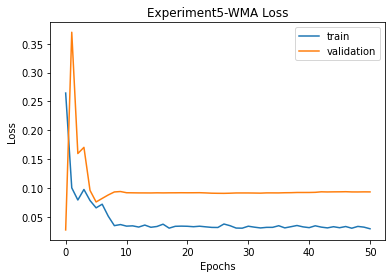


SMA
Prediction vs Close:		46.27% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 22.905457367129987 
RMSE:	 4.785964622427749 
MAPE:	 4.003866138329542

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	44.03% Accuracy
MSE:	 24.329194491765858 
RMSE:	 4.932463328983385 
MAPE:	 4.099346553838579

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 26.731339639305343 
RMSE:	 5.170235936522176 
MAPE:	 4.142288801040536
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16999.785, Time=3.45 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14568.588, Time=4.62 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15575.689, Time=9.06 sec
 ARIMA(0,3,1)(0,0,0)[0]       

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.84951, saving model to LSTM5.h5
10/10 - 2s - loss: 0.2793 - val_loss: 0.8495 - lr: 0.0010 - 2s/epoch - 166ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.84951 to 0.03753, saving model to LSTM5.h5
10/10 - 0s - loss: 0.0845 - val_loss: 0.0375 - lr: 0.0010 - 150ms/epoch - 15ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.03753
10/10 - 0s - loss: 0.0633 - val_loss: 0.1873 - lr: 0.0010 - 146ms/epoch - 15ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.03753
10/10 - 0s - loss: 0.0523 - val_loss: 0.4476 - lr: 0.0010 - 111ms/epoch - 11ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.03753
10/10 - 0s - loss: 0.0470 - val_loss: 0.3455 - lr: 0.0010 - 108ms/epoch - 11ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.03753
10/10 - 0s - loss: 0.0551 - val_loss: 0.1638 - lr: 0.0010 - 109ms/epoch - 11ms/step
Epoch 7/500

Epoch 00007: ReduceLROnPlateau reducing learn

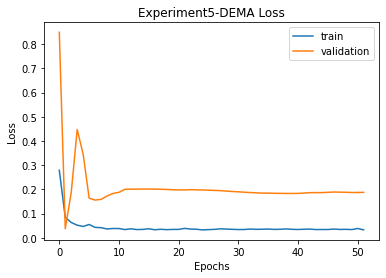


SMA
Prediction vs Close:		46.27% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 22.905457367129987 
RMSE:	 4.785964622427749 
MAPE:	 4.003866138329542

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	44.03% Accuracy
MSE:	 24.329194491765858 
RMSE:	 4.932463328983385 
MAPE:	 4.099346553838579

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 26.731339639305343 
RMSE:	 5.170235936522176 
MAPE:	 4.142288801040536

DEMA
Prediction vs Close:		48.13% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 20.555600166870196 
RMSE:	 4.53382842274277 
MAPE:	 3.6522177332314283
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16921.943, Time=10.75 sec
 ARI

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.31708, saving model to LSTM5.h5
45/45 - 2s - loss: 0.1855 - val_loss: 0.3171 - lr: 0.0010 - 2s/epoch - 44ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.31708
45/45 - 0s - loss: 0.1562 - val_loss: 0.7818 - lr: 0.0010 - 363ms/epoch - 8ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.31708
45/45 - 0s - loss: 0.0779 - val_loss: 0.5710 - lr: 0.0010 - 384ms/epoch - 9ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.31708 to 0.21579, saving model to LSTM5.h5
45/45 - 0s - loss: 0.0597 - val_loss: 0.2158 - lr: 0.0010 - 416ms/epoch - 9ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.21579 to 0.13465, saving model to LSTM5.h5
45/45 - 0s - loss: 0.0558 - val_loss: 0.1346 - lr: 0.0010 - 449ms/epoch - 10ms/step
Epoch 6/500

Epoch 00006: val_loss improved from 0.13465 to 0.10282, saving model to LSTM5.h5
45/45 - 0s - loss: 0.0428 - val_loss: 0.1028 - lr: 0.0010 - 434ms/epoch - 10ms/step
Ep

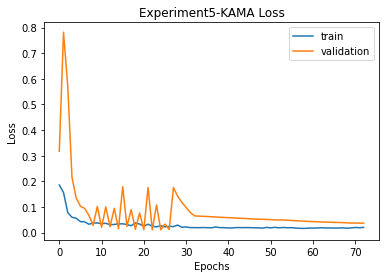


SMA
Prediction vs Close:		46.27% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 22.905457367129987 
RMSE:	 4.785964622427749 
MAPE:	 4.003866138329542

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	44.03% Accuracy
MSE:	 24.329194491765858 
RMSE:	 4.932463328983385 
MAPE:	 4.099346553838579

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 26.731339639305343 
RMSE:	 5.170235936522176 
MAPE:	 4.142288801040536

DEMA
Prediction vs Close:		48.13% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 20.555600166870196 
RMSE:	 4.53382842274277 
MAPE:	 3.6522177332314283

KAMA
Prediction vs Close:		57.84% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 36.658985139129086 
RMSE:	 6.054666393710646 
MAPE:	 4.91375972579294
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on M

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.10748, saving model to LSTM5.h5
58/58 - 2s - loss: 0.1689 - val_loss: 0.1075 - lr: 0.0010 - 2s/epoch - 37ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.10748
58/58 - 0s - loss: 0.1680 - val_loss: 0.1948 - lr: 0.0010 - 499ms/epoch - 9ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.10748
58/58 - 0s - loss: 0.0806 - val_loss: 0.2118 - lr: 0.0010 - 480ms/epoch - 8ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.10748 to 0.02087, saving model to LSTM5.h5
58/58 - 0s - loss: 0.0585 - val_loss: 0.0209 - lr: 0.0010 - 491ms/epoch - 8ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.02087
58/58 - 0s - loss: 0.0409 - val_loss: 0.1412 - lr: 0.0010 - 480ms/epoch - 8ms/step
Epoch 6/500

Epoch 00006: val_loss improved from 0.02087 to 0.00898, saving model to LSTM5.h5
58/58 - 1s - loss: 0.0370 - val_loss: 0.0090 - lr: 0.0010 - 515ms/epoch - 9ms/step
Epoch 7/500

Epoch 00007: val_loss

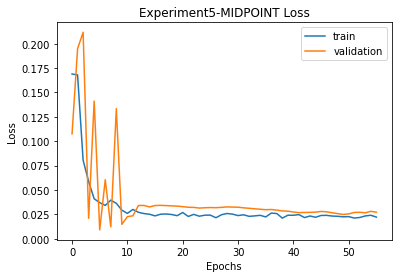


SMA
Prediction vs Close:		46.27% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 22.905457367129987 
RMSE:	 4.785964622427749 
MAPE:	 4.003866138329542

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	44.03% Accuracy
MSE:	 24.329194491765858 
RMSE:	 4.932463328983385 
MAPE:	 4.099346553838579

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 26.731339639305343 
RMSE:	 5.170235936522176 
MAPE:	 4.142288801040536

DEMA
Prediction vs Close:		48.13% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 20.555600166870196 
RMSE:	 4.53382842274277 
MAPE:	 3.6522177332314283

KAMA
Prediction vs Close:		57.84% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 36.658985139129086 
RMSE:	 6.054666393710646 
MAPE:	 4.91375972579294

MIDPOINT
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 46.211728483578064 
RMSE:	 6.797920894183608 
MAPE:	 5.510818514624332
T3
T3([input_arrays], [t

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.19644, saving model to LSTM5.h5
43/43 - 2s - loss: 0.3641 - val_loss: 0.1964 - lr: 0.0010 - 2s/epoch - 46ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.19644 to 0.02016, saving model to LSTM5.h5
43/43 - 0s - loss: 0.1791 - val_loss: 0.0202 - lr: 0.0010 - 442ms/epoch - 10ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.02016
43/43 - 0s - loss: 0.0733 - val_loss: 0.5417 - lr: 0.0010 - 363ms/epoch - 8ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.02016
43/43 - 0s - loss: 0.0581 - val_loss: 0.2098 - lr: 0.0010 - 341ms/epoch - 8ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.02016
43/43 - 0s - loss: 0.0566 - val_loss: 0.0324 - lr: 0.0010 - 405ms/epoch - 9ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.02016
43/43 - 0s - loss: 0.0494 - val_loss: 0.1509 - lr: 0.0010 - 381ms/epoch - 9ms/step
Epoch 7/500

Epoch 00007: ReduceLROnPlateau reducing learning r

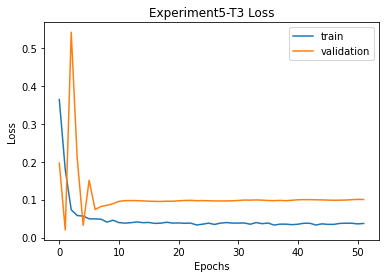


SMA
Prediction vs Close:		46.27% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 22.905457367129987 
RMSE:	 4.785964622427749 
MAPE:	 4.003866138329542

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	44.03% Accuracy
MSE:	 24.329194491765858 
RMSE:	 4.932463328983385 
MAPE:	 4.099346553838579

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 26.731339639305343 
RMSE:	 5.170235936522176 
MAPE:	 4.142288801040536

DEMA
Prediction vs Close:		48.13% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 20.555600166870196 
RMSE:	 4.53382842274277 
MAPE:	 3.6522177332314283

KAMA
Prediction vs Close:		57.84% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 36.658985139129086 
RMSE:	 6.054666393710646 
MAPE:	 4.91375972579294

MIDPOINT
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 46.211728483578064 
RMSE:	 6.797920894183608 
MAPE:	 5.510818514624332

T3
Prediction vs Close:

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16523.926, Time=4.41 sec
 ARIMA(1,3,1)(0,0,0)[0] intercept   : AIC=-16696.008, Time=3.28 sec

Best model:  ARIMA(1,3,1)(0,0,0)[0]          
Total fit time: 72.746 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(1, 3, 1)   Log Likelihood                8408.400
Date:                Sun, 12 Dec 2021   AIC                         -16762.799
Time:                        15:53:36   BIC                         -16636.147
Sample:                             0   HQIC                        -16714.159
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.08859, saving model to LSTM5.h5
90/90 - 2s - loss: 0.1608 - val_loss: 0.0886 - lr: 0.0010 - 2s/epoch - 27ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.08859
90/90 - 1s - loss: 0.0697 - val_loss: 0.1741 - lr: 0.0010 - 742ms/epoch - 8ms/step
Epoch 3/500

Epoch 00003: val_loss improved from 0.08859 to 0.03433, saving model to LSTM5.h5
90/90 - 1s - loss: 0.0543 - val_loss: 0.0343 - lr: 0.0010 - 787ms/epoch - 9ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.03433 to 0.01881, saving model to LSTM5.h5
90/90 - 1s - loss: 0.0596 - val_loss: 0.0188 - lr: 0.0010 - 739ms/epoch - 8ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.01881 to 0.01390, saving model to LSTM5.h5
90/90 - 1s - loss: 0.0722 - val_loss: 0.0139 - lr: 0.0010 - 744ms/epoch - 8ms/step
Epoch 6/500

Epoch 00006: val_loss did not improve from 0.01390
90/90 - 1s - loss: 0.0503 - val_loss: 0.4205 - lr: 0.0010 - 706ms/epoch - 8ms/step
Epoc

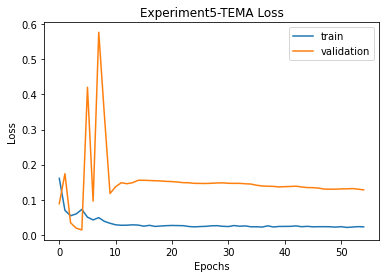


SMA
Prediction vs Close:		46.27% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 22.905457367129987 
RMSE:	 4.785964622427749 
MAPE:	 4.003866138329542

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	44.03% Accuracy
MSE:	 24.329194491765858 
RMSE:	 4.932463328983385 
MAPE:	 4.099346553838579

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 26.731339639305343 
RMSE:	 5.170235936522176 
MAPE:	 4.142288801040536

DEMA
Prediction vs Close:		48.13% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 20.555600166870196 
RMSE:	 4.53382842274277 
MAPE:	 3.6522177332314283

KAMA
Prediction vs Close:		57.84% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 36.658985139129086 
RMSE:	 6.054666393710646 
MAPE:	 4.91375972579294

MIDPOINT
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 46.211728483578064 
RMSE:	 6.797920894183608 
MAPE:	 5.510818514624332

T3
Prediction vs Close:

In [116]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation5 = {}
    imgfile = 'Experiment5'
    for ma in optimized_period:
                print(ma)
                print(functions[ma])
                print ( int( optimized_period[ma]))
              # if ma == 'SMA':
                low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
                low_vol = low_vol.fillna(0)
                low_vol_data = df['close']
                high_vol = pd.DataFrame()
                df2 = df.copy()
                for i in df2.columns:
                  if i in low_vol.columns:
                    high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
                high_vol_data = df['close']
                ## *****************************************************
                # Generate ARIMA and LSTM predictions
                print('\nWorking on ' + ma + ' predictions')
                try:
                  print('parameters used : ', train_len, test_len)
                  low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima_exog(low_vol,low_vol_data, train_len, test_len)
                except:
                    print('ARIMA error, skipping to next MA type')
                    continue
                Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
                final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
                mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
                rmse_ftr = mse_ftr ** 0.5
                mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
                mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

                final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
                mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
                rmse = mse ** 0.5
                mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                # Generate prediction accuracy
                actual = df['close'].tail(test_len).values
                result_1 = []
                result_2 = []
                for i in range(1, len(final_prediction)):
                    # Compare prediction to previous close price
                    if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                        result_1.append(1)
                    elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                        result_1.append(1)
                    else:
                        result_1.append(0)

                    # Compare prediction to previous prediction
                    if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                        result_2.append(1)
                    elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                        result_2.append(1)
                    else:
                        result_2.append(0)

                accuracy_1 = np.mean(result_1)
                accuracy_2 = np.mean(result_2)

                simulation5[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                              'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                  'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                              'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                  'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                              'rmse': rmse_ftr, 'mae' : mae_ftr},
                                  'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                            'rmse': rmse, 'mae': mae },
                                  'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

                # save simulation data here as checkpoint
                with open('simulation5_data.json', 'w') as fp:
                    json.dump(simulation5, fp)

                for ma in simulation5.keys():
                    print('\n' + ma)
                    print('Prediction vs Close:\t\t' + str(round(100*simulation5[ma]['accuracy']['prediction vs close'], 2))
                          + '% Accuracy')
                    print('Prediction vs Prediction:\t' + str(round(100*simulation5[ma]['accuracy']['prediction vs prediction'], 2))
                          + '% Accuracy')
                    print('MSE:\t', simulation5[ma]['final']['mse'],
                          '\nRMSE:\t', simulation5[ma]['final']['rmse'],
                          '\nMAPE:\t', simulation5[ma]['final']['mae'])#,
                          # '\nMAPE:\t', simulation[ma]['final']['mape'])
              # else:
              #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [117]:
from google.colab import files
import cv2
uploaded = files.upload()

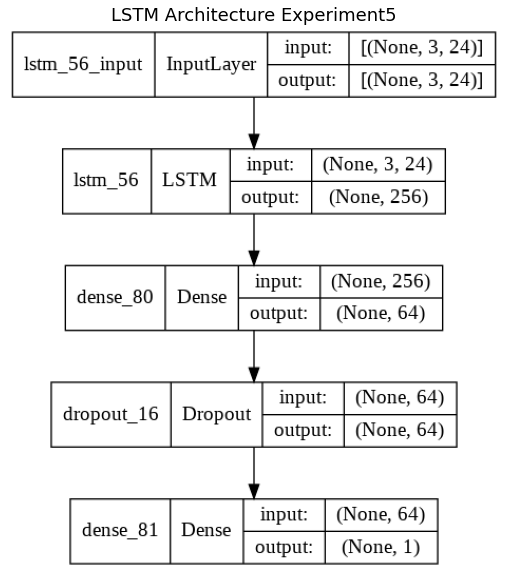

In [118]:
img = cv2.imread('Experiment5.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [148]:
with open('simulation5_data.json') as json_file:
    simulation5 = json.load(json_file)
fileimg = 'Experiment5'

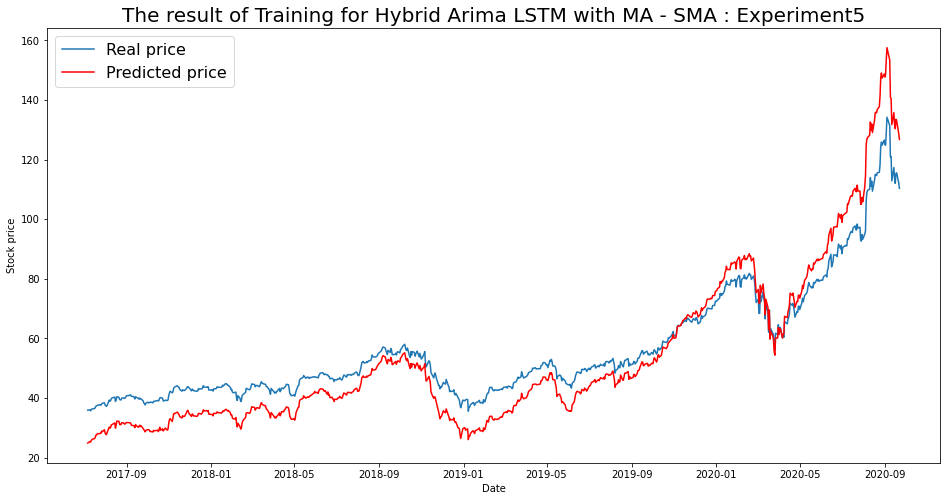

----- Train RMSE for SMA ----- 8.067881033957713
----- Train_MSE_LSTM for SMA ----- 65.09070437809457
----- Train MAE LSTM for SMA ----- 7.037769857791742


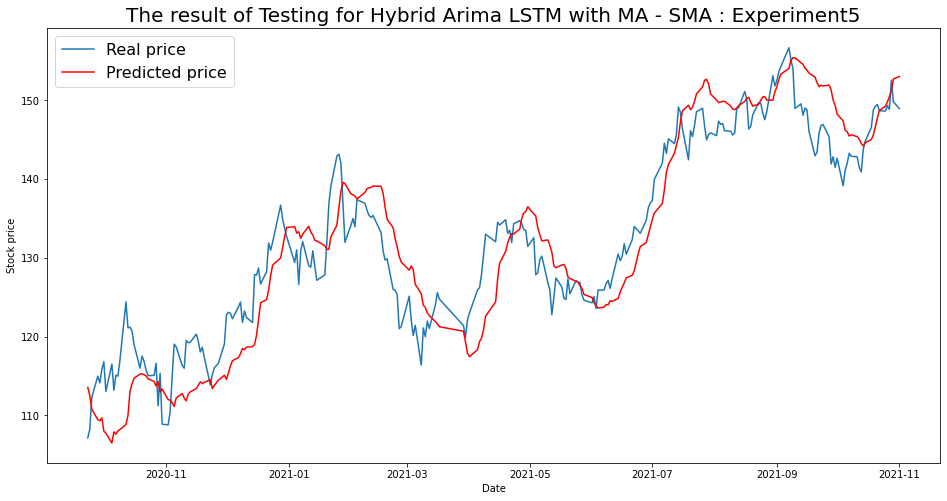

----- Test RMSE for SMA----- 4.785964622427749
----- Test_MSE_LSTM for SMA----- 22.905457367129987
----- Test_MAE_LSTM for SMA----- 4.003866138329542


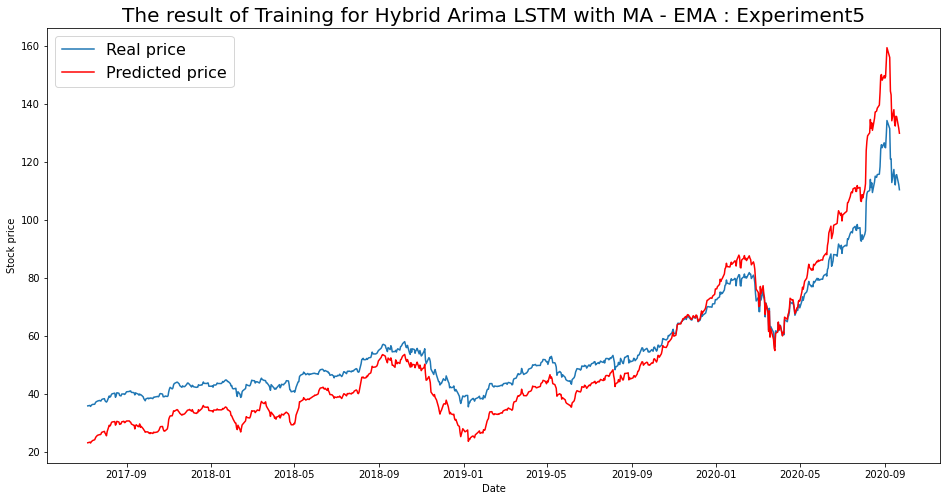

----- Train RMSE for EMA ----- 9.103310494431582
----- Train_MSE_LSTM for EMA ----- 82.8702619580282
----- Train MAE LSTM for EMA ----- 7.942187929793381


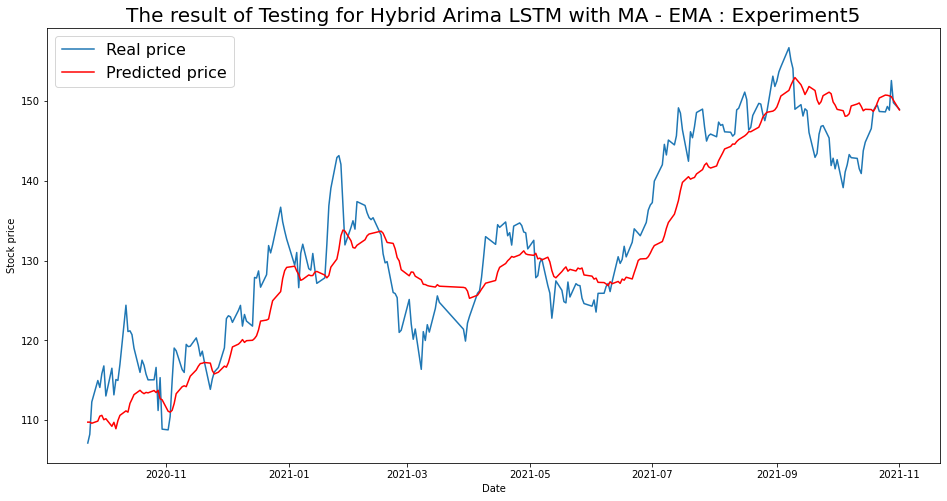

----- Test RMSE for EMA----- 4.932463328983385
----- Test_MSE_LSTM for EMA----- 24.329194491765858
----- Test_MAE_LSTM for EMA----- 4.099346553838579


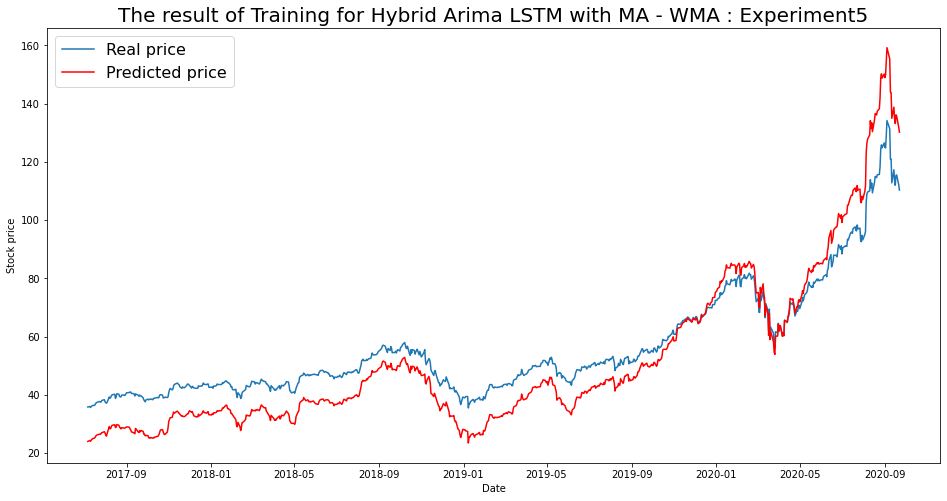

----- Train RMSE for WMA ----- 9.385901722462174
----- Train_MSE_LSTM for WMA ----- 88.09515114371841
----- Train MAE LSTM for WMA ----- 8.302396097763367


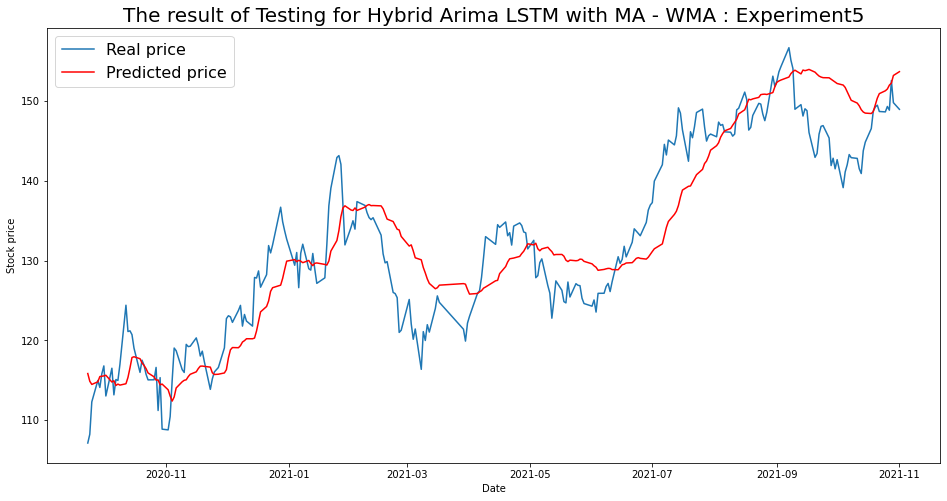

----- Test RMSE for WMA----- 5.170235936522176
----- Test_MSE_LSTM for WMA----- 26.731339639305343
----- Test_MAE_LSTM for WMA----- 4.142288801040536


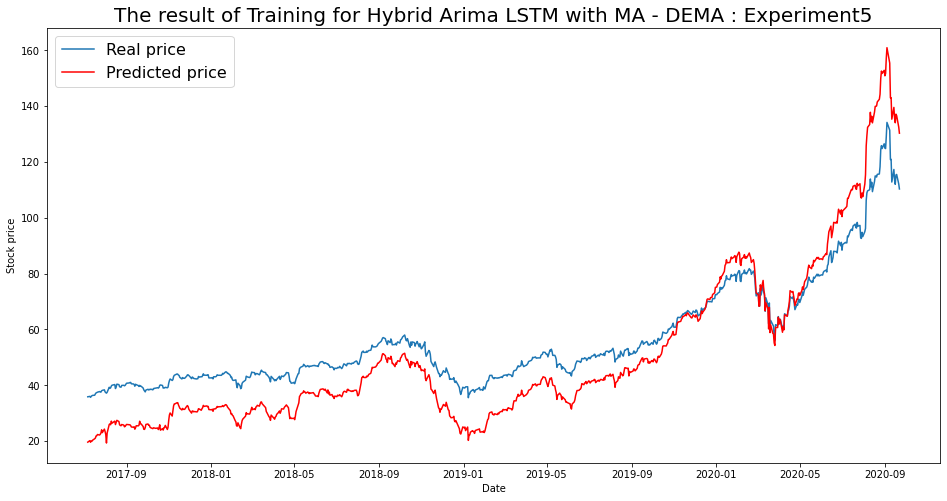

----- Train RMSE for DEMA ----- 11.174629479833136
----- Train_MSE_LSTM for DEMA ----- 124.8723440115558
----- Train MAE LSTM for DEMA ----- 9.963720709179979


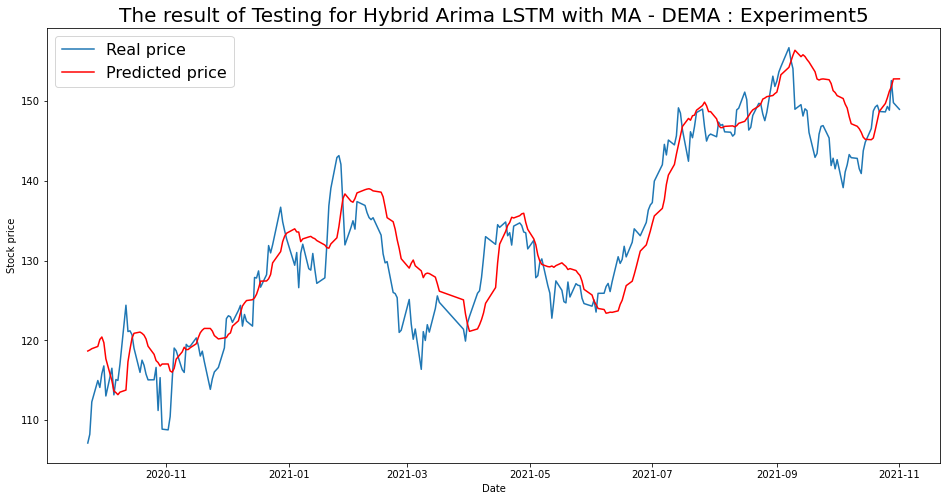

----- Test RMSE for DEMA----- 4.53382842274277
----- Test_MSE_LSTM for DEMA----- 20.555600166870196
----- Test_MAE_LSTM for DEMA----- 3.6522177332314283


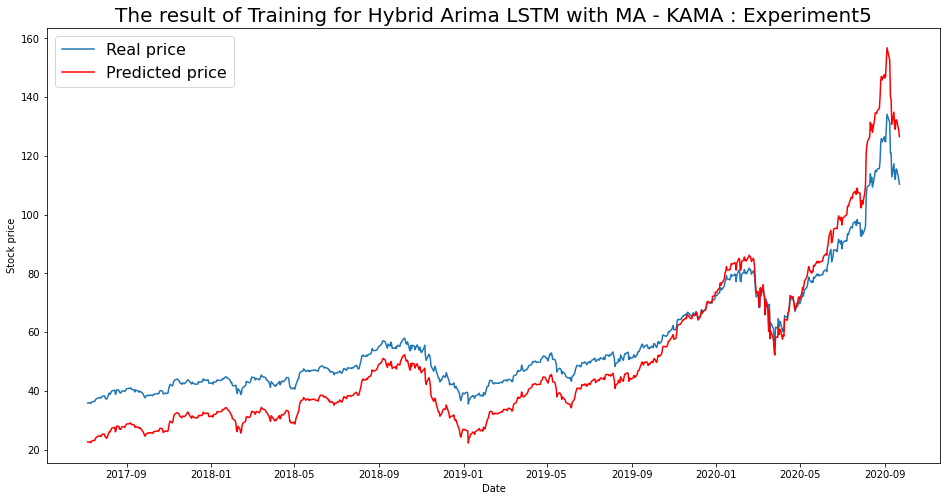

----- Train RMSE for KAMA ----- 9.612463288091494
----- Train_MSE_LSTM for KAMA ----- 92.39945046490672
----- Train MAE LSTM for KAMA ----- 8.617087029614533


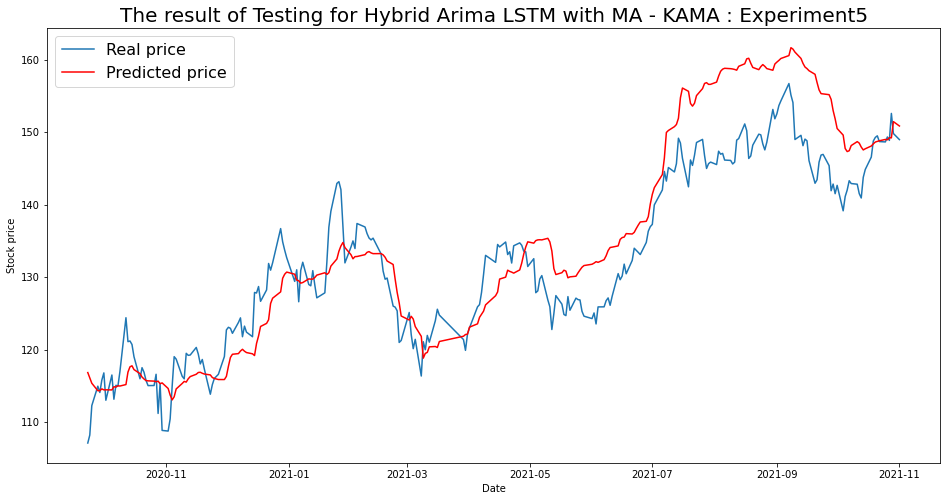

----- Test RMSE for KAMA----- 6.054666393710646
----- Test_MSE_LSTM for KAMA----- 36.658985139129086
----- Test_MAE_LSTM for KAMA----- 4.91375972579294


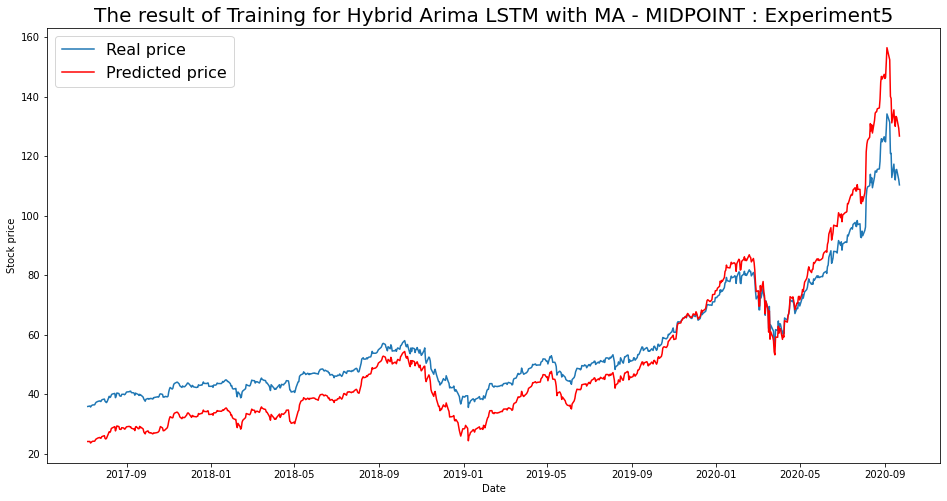

----- Train RMSE for MIDPOINT ----- 8.63124538592405
----- Train_MSE_LSTM for MIDPOINT ----- 74.49839691203519
----- Train MAE LSTM for MIDPOINT ----- 7.641012681592809


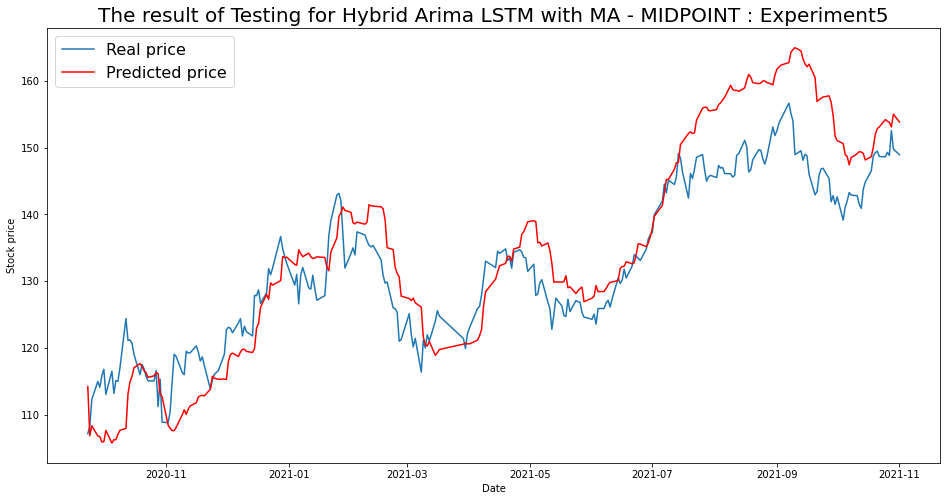

----- Test RMSE for MIDPOINT----- 6.797920894183608
----- Test_MSE_LSTM for MIDPOINT----- 46.211728483578064
----- Test_MAE_LSTM for MIDPOINT----- 5.510818514624332


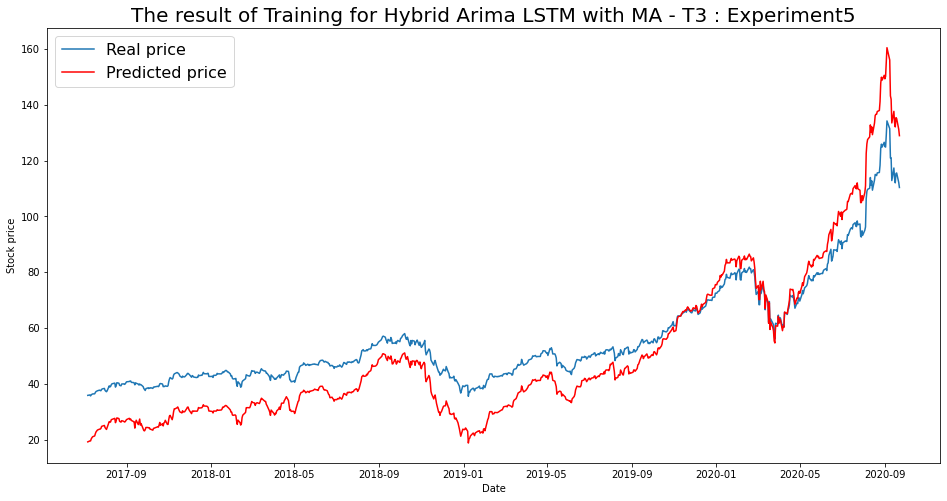

----- Train RMSE for T3 ----- 10.712175422308457
----- Train_MSE_LSTM for T3 ----- 114.75070227830938
----- Train MAE LSTM for T3 ----- 9.554836890139239


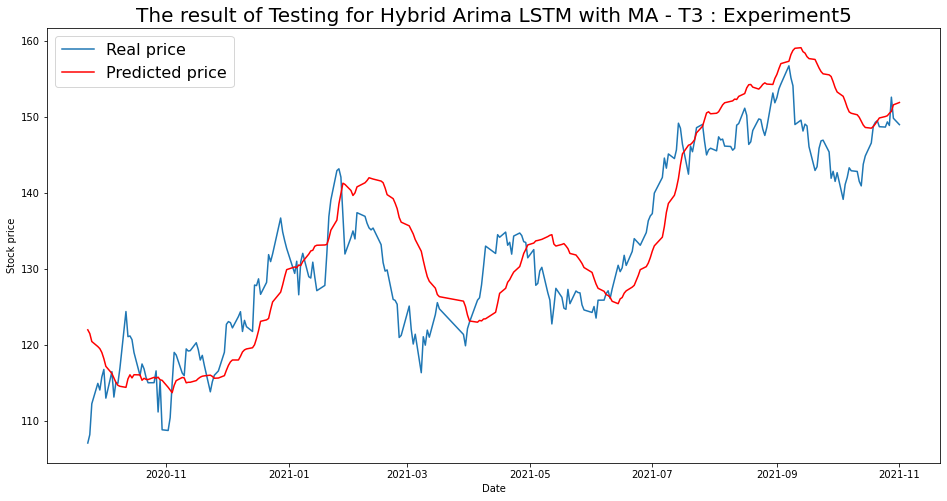

----- Test RMSE for T3----- 6.278727107833918
----- Test_MSE_LSTM for T3----- 39.422414094648474
----- Test_MAE_LSTM for T3----- 5.177910469752962


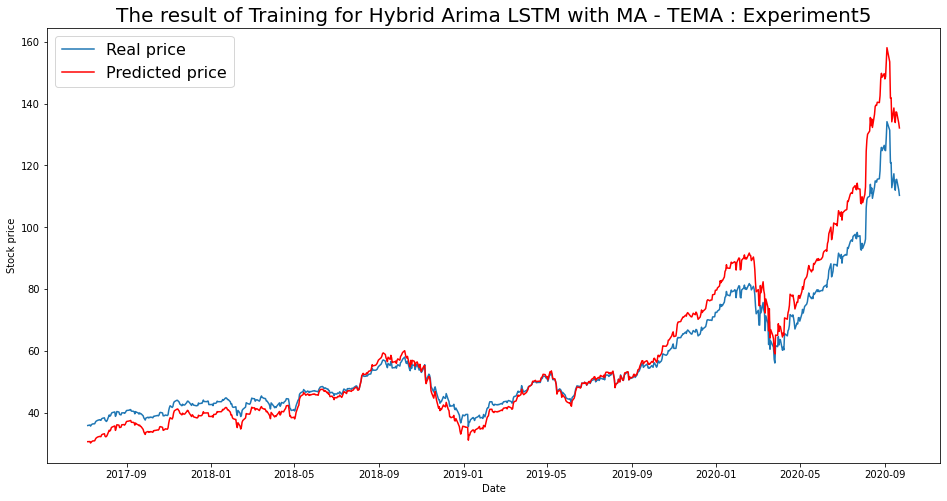

----- Train RMSE for TEMA ----- 6.84563619096288
----- Train_MSE_LSTM for TEMA ----- 46.86273485902077
----- Train MAE LSTM for TEMA ----- 4.587888858994552


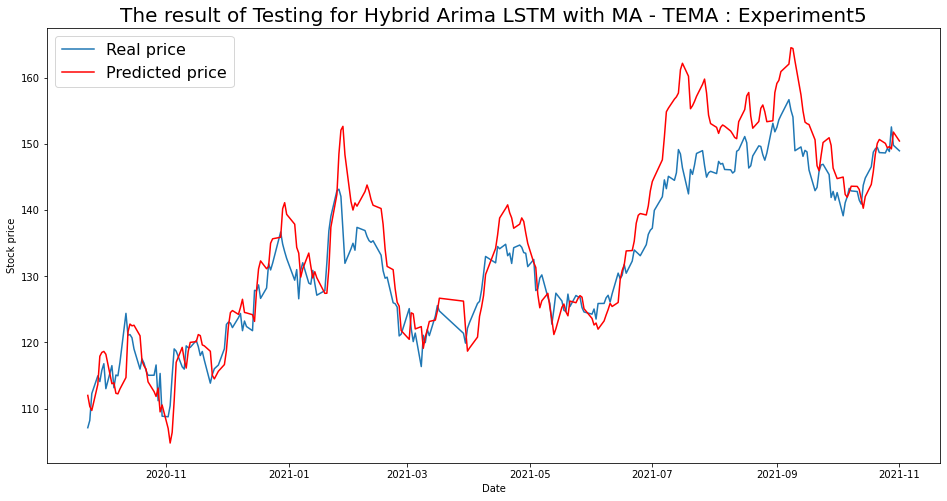

----- Test RMSE for TEMA----- 5.217204420122223
----- Test_MSE_LSTM for TEMA----- 27.219221961342864
----- Test_MAE_LSTM for TEMA----- 4.028826161355838


In [149]:
for i in range(len(list(simulation5.keys()))):
  SIM = list(simulation5.keys())[i]
  plot_train(simulation5,SIM)
  plot_test(simulation5,SIM)

## Arima w Exogenous Variable Multistep MutiVariate LSTM Hybrid Model Experiment 6

In [120]:
def get_arima_exog(dataframe,original_data, train_len, test_len):    
    

    # prepare train and test data for exogenous vr
    X_value = pd.DataFrame(low_vol.iloc[:, :])
    y_value = pd.DataFrame(low_vol.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    X_scale_dataset = X_scaler.fit_transform(X_value)
    y_scale_dataset = y_scaler.fit_transform(y_value)
    # Get data and check shape
    # X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X_scale_dataset)
    y_train, y_test, = split_train_test(y_scale_dataset)
    yc_train,yc_test = split_train_test(low_vol_data)
    yc = yc_test.values.tolist()
    y_train_list = y_train.flatten().tolist()
    y_test_list = y_test.flatten().tolist()
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

    # Initialize model
    model = auto_arima(y_train_list,exogenous  = X_train,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
            suppress_warnings=True,stepwise=True,seasonal=True)

      # Determine model parameters
    print(model.summary())
    model.fit(y_train_list,maxiter=200)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

      # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
        model = pmdarima.ARIMA(order=order)
        model.fit(y_train_list)
        # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')

        prediction.append(model.predict()[0])
        y_train_list.append(y_test_list[i])

    predictionte = y_scaler.inverse_transform(np.array(prediction).reshape(-1,1))
    y_test_ = y_scaler.inverse_transform(np.array(y_test_list).reshape(-1,1))

    # Generate error data
    mse = mean_squared_error(yc_test, predictionte)
    rmse = mse ** 0.5
    mae = mean_absolute_error(y_test_ , predictionte )
    return yc,predictionte.flatten().tolist(), mse, rmse, mae

In [122]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det =20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()


    # # option 2
    model = Sequential()
    model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    model.add(Dense(64))
    model.add(Dense(units=output_dim))
    model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM6.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()

    # Option 3
    # define custom activation
    # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16999.786, Time=3.31 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14568.592, Time=4.55 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15578.394, Time=8.68 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14566.592, Time=7.49 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16966.361, Time=9.62 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-16121.635, Time=10.86 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-17214.069, Time=13.36 sec
 ARIMA(0,3,3)(0,0,0)[0]             : AIC=-14562.592, Time=9.23 sec
 ARIMA(1,3,3)(0,0,0)[0]             : AIC=-14572.319, Time=10.05 sec
 ARIMA(0,3,2)(0,0,0)[0] intercept   : AIC=-14403.474, Time=42.41 sec

Best model:  ARIMA(0,3,2)(0,0,0)[0]          
Tot

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.00838, saving model to LSTM6.h5
48/48 - 4s - loss: 0.1905 - accuracy: 0.0000e+00 - val_loss: 0.0084 - val_accuracy: 0.0037 - lr: 0.0010 - 4s/epoch - 81ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.00838
48/48 - 0s - loss: 0.0400 - accuracy: 0.0000e+00 - val_loss: 0.0181 - val_accuracy: 0.0037 - lr: 0.0010 - 245ms/epoch - 5ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.00838
48/48 - 0s - loss: 0.0195 - accuracy: 0.0000e+00 - val_loss: 0.0654 - val_accuracy: 0.0037 - lr: 0.0010 - 260ms/epoch - 5ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.00838 to 0.00497, saving model to LSTM6.h5
48/48 - 0s - loss: 0.0279 - accuracy: 0.0000e+00 - val_loss: 0.0050 - val_accuracy: 0.0037 - lr: 0.0010 - 314ms/epoch - 7ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.00497 to 0.00441, saving model to LSTM6.h5
48/48 - 0s - loss: 0.0026 - accuracy: 0.0000e+00 - val_loss: 0.0044 - val_accura

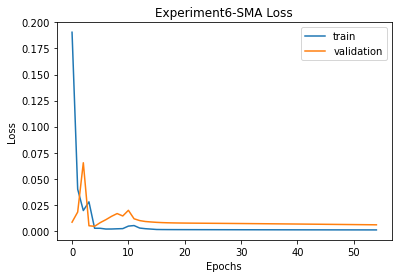


SMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 109.05489356902385 
RMSE:	 10.442935103170173 
MAPE:	 8.732625329283675
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16999.778, Time=3.00 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14568.589, Time=4.60 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-14606.447, Time=6.14 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14566.589, Time=6.87 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15343.613, Time=9.59 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-15047.583, Time=13.16 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-16858.964, Time=11.54 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-17024.022, Time=6.08 sec
 ARIMA(3,3,0)(0,0,0)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16997.990, Time=3.81 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16992.667, Time=4.71 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 97.502 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.726
Date:                Sun, 12 Dec 2021   AIC                         -17081.451
Time:                        16:12:48   BIC                         -16945.417
Sample:                             0   HQIC                        -17029.208
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.01247, saving model to LSTM6.h5
16/16 - 4s - loss: 0.1231 - accuracy: 0.0000e+00 - val_loss: 0.0125 - val_accuracy: 0.0037 - lr: 0.0010 - 4s/epoch - 225ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.01247
16/16 - 0s - loss: 0.0716 - accuracy: 0.0000e+00 - val_loss: 0.0196 - val_accuracy: 0.0037 - lr: 0.0010 - 91ms/epoch - 6ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.01247
16/16 - 0s - loss: 0.0081 - accuracy: 0.0000e+00 - val_loss: 0.0408 - val_accuracy: 0.0037 - lr: 0.0010 - 138ms/epoch - 9ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.01247 to 0.00713, saving model to LSTM6.h5
16/16 - 0s - loss: 0.0251 - accuracy: 0.0000e+00 - val_loss: 0.0071 - val_accuracy: 0.0037 - lr: 0.0010 - 130ms/epoch - 8ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00713
16/16 - 0s - loss: 0.0132 - accuracy: 0.0000e+00 - val_loss: 0.0361 - val_accuracy: 0.0037 - lr: 0.0010 - 104m

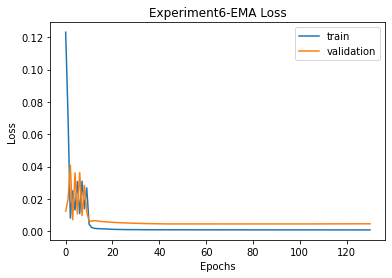


SMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 109.05489356902385 
RMSE:	 10.442935103170173 
MAPE:	 8.732625329283675

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 73.04142380966745 
RMSE:	 8.546427546622475 
MAPE:	 7.099244401385842
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16999.780, Time=3.11 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14568.589, Time=4.60 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16789.784, Time=12.13 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14566.589, Time=7.20 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16919.987, Time=8.97 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-14616.097, Time=11.93 sec

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.04829, saving model to LSTM6.h5
17/17 - 4s - loss: 0.1049 - accuracy: 0.0000e+00 - val_loss: 0.0483 - val_accuracy: 0.0037 - lr: 0.0010 - 4s/epoch - 229ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.04829
17/17 - 0s - loss: 0.0452 - accuracy: 0.0000e+00 - val_loss: 0.1689 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 100ms/epoch - 6ms/step
Epoch 3/500

Epoch 00003: val_loss improved from 0.04829 to 0.03648, saving model to LSTM6.h5
17/17 - 0s - loss: 0.0148 - accuracy: 0.0000e+00 - val_loss: 0.0365 - val_accuracy: 0.0037 - lr: 0.0010 - 146ms/epoch - 9ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.03648 to 0.00656, saving model to LSTM6.h5
17/17 - 0s - loss: 0.0075 - accuracy: 0.0000e+00 - val_loss: 0.0066 - val_accuracy: 0.0037 - lr: 0.0010 - 147ms/epoch - 9ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00656
17/17 - 0s - loss: 0.0322 - accuracy: 0.0000e+00 - val_loss: 0.0123 - val_a

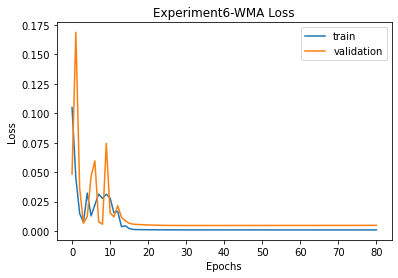


SMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 109.05489356902385 
RMSE:	 10.442935103170173 
MAPE:	 8.732625329283675

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 73.04142380966745 
RMSE:	 8.546427546622475 
MAPE:	 7.099244401385842

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 84.94978866341171 
RMSE:	 9.21682096296829 
MAPE:	 7.490547440692417
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16999.785, Time=3.12 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14568.588, Time=4.69 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15575.689, Time=9.23 sec
 ARIMA(0,3,1)(0,0,0)[0]         

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.01647, saving model to LSTM6.h5
10/10 - 4s - loss: 0.2634 - accuracy: 0.0000e+00 - val_loss: 0.0165 - val_accuracy: 0.0037 - lr: 0.0010 - 4s/epoch - 397ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.01647
10/10 - 0s - loss: 0.1891 - accuracy: 0.0000e+00 - val_loss: 0.0248 - val_accuracy: 0.0037 - lr: 0.0010 - 70ms/epoch - 7ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.01647
10/10 - 0s - loss: 0.0093 - accuracy: 0.0000e+00 - val_loss: 0.0261 - val_accuracy: 0.0037 - lr: 0.0010 - 77ms/epoch - 8ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.01647
10/10 - 0s - loss: 0.0087 - accuracy: 0.0000e+00 - val_loss: 0.0570 - val_accuracy: 0.0037 - lr: 0.0010 - 78ms/epoch - 8ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.01647 to 0.01335, saving model to LSTM6.h5
10/10 - 0s - loss: 0.0097 - accuracy: 0.0000e+00 - val_loss: 0.0134 - val_accuracy: 0.0037 - lr: 0.0010 - 88ms/e

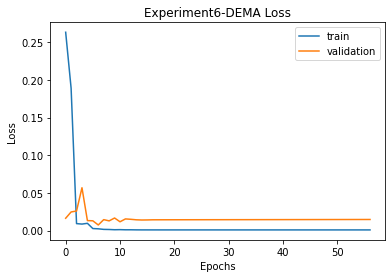


SMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 109.05489356902385 
RMSE:	 10.442935103170173 
MAPE:	 8.732625329283675

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 73.04142380966745 
RMSE:	 8.546427546622475 
MAPE:	 7.099244401385842

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 84.94978866341171 
RMSE:	 9.21682096296829 
MAPE:	 7.490547440692417

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 151.61070955572364 
RMSE:	 12.313030072070955 
MAPE:	 11.085595013418024
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16921.943, Time=10.24 sec
 ARIM

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.10479, saving model to LSTM6.h5
45/45 - 5s - loss: 0.1250 - accuracy: 0.0000e+00 - val_loss: 0.1048 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 5s/epoch - 102ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.10479 to 0.08778, saving model to LSTM6.h5
45/45 - 0s - loss: 0.0877 - accuracy: 0.0000e+00 - val_loss: 0.0878 - val_accuracy: 0.0037 - lr: 0.0010 - 295ms/epoch - 7ms/step
Epoch 3/500

Epoch 00003: val_loss improved from 0.08778 to 0.00637, saving model to LSTM6.h5
45/45 - 0s - loss: 0.0120 - accuracy: 0.0000e+00 - val_loss: 0.0064 - val_accuracy: 0.0037 - lr: 0.0010 - 308ms/epoch - 7ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.00637
45/45 - 0s - loss: 0.0063 - accuracy: 0.0000e+00 - val_loss: 0.0347 - val_accuracy: 0.0037 - lr: 0.0010 - 295ms/epoch - 7ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.00637 to 0.00356, saving model to LSTM6.h5
45/45 - 0s - loss: 0.0064 - accuracy: 0.0000e

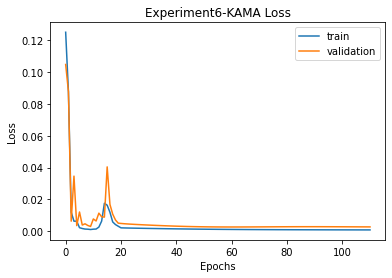


SMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 109.05489356902385 
RMSE:	 10.442935103170173 
MAPE:	 8.732625329283675

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 73.04142380966745 
RMSE:	 8.546427546622475 
MAPE:	 7.099244401385842

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 84.94978866341171 
RMSE:	 9.21682096296829 
MAPE:	 7.490547440692417

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 151.61070955572364 
RMSE:	 12.313030072070955 
MAPE:	 11.085595013418024

KAMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 80.0014001509936 
RMSE:	 8.944350180476702 
MAPE:	 7.358601729961256
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MID

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.03788, saving model to LSTM6.h5
58/58 - 4s - loss: 0.1476 - accuracy: 0.0000e+00 - val_loss: 0.0379 - val_accuracy: 0.0037 - lr: 0.0010 - 4s/epoch - 68ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.03788 to 0.00696, saving model to LSTM6.h5
58/58 - 0s - loss: 0.0220 - accuracy: 0.0000e+00 - val_loss: 0.0070 - val_accuracy: 0.0037 - lr: 0.0010 - 347ms/epoch - 6ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.00696
58/58 - 0s - loss: 0.0223 - accuracy: 0.0000e+00 - val_loss: 0.0802 - val_accuracy: 0.0037 - lr: 0.0010 - 352ms/epoch - 6ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.00696
58/58 - 0s - loss: 0.0103 - accuracy: 0.0000e+00 - val_loss: 0.0215 - val_accuracy: 0.0037 - lr: 0.0010 - 322ms/epoch - 6ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00696
58/58 - 0s - loss: 0.0040 - accuracy: 0.0000e+00 - val_loss: 0.0176 - val_accuracy: 0.0037 - lr: 0.0010 - 331m

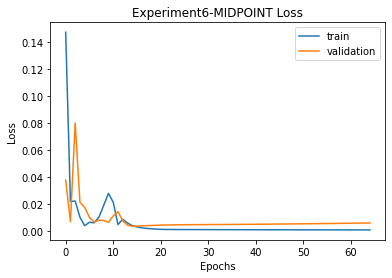


SMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 109.05489356902385 
RMSE:	 10.442935103170173 
MAPE:	 8.732625329283675

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 73.04142380966745 
RMSE:	 8.546427546622475 
MAPE:	 7.099244401385842

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 84.94978866341171 
RMSE:	 9.21682096296829 
MAPE:	 7.490547440692417

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 151.61070955572364 
RMSE:	 12.313030072070955 
MAPE:	 11.085595013418024

KAMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 80.0014001509936 
RMSE:	 8.944350180476702 
MAPE:	 7.358601729961256

MIDPOINT
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 61.18379984959283 
RMSE:	 7.822007405365507 
MAPE:	 6.441728946960992
T3
T3([input_arrays], [tim

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.07461, saving model to LSTM6.h5
43/43 - 4s - loss: 0.1214 - accuracy: 0.0000e+00 - val_loss: 0.0746 - val_accuracy: 0.0037 - lr: 0.0010 - 4s/epoch - 104ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.07461 to 0.04371, saving model to LSTM6.h5
43/43 - 0s - loss: 0.0526 - accuracy: 0.0000e+00 - val_loss: 0.0437 - val_accuracy: 0.0037 - lr: 0.0010 - 291ms/epoch - 7ms/step
Epoch 3/500

Epoch 00003: val_loss improved from 0.04371 to 0.00965, saving model to LSTM6.h5
43/43 - 0s - loss: 0.0168 - accuracy: 0.0000e+00 - val_loss: 0.0096 - val_accuracy: 0.0037 - lr: 0.0010 - 267ms/epoch - 6ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.00965
43/43 - 0s - loss: 0.0040 - accuracy: 0.0000e+00 - val_loss: 0.0155 - val_accuracy: 0.0037 - lr: 0.0010 - 267ms/epoch - 6ms/step
Epoch 5/500

Epoch 00005: val_loss improved from 0.00965 to 0.00469, saving model to LSTM6.h5
43/43 - 0s - loss: 0.0071 - accuracy: 0.0000e+00 

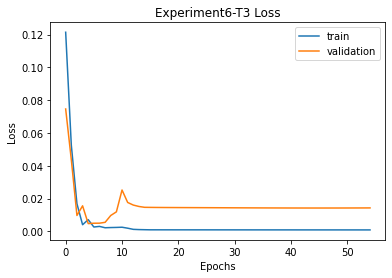


SMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 109.05489356902385 
RMSE:	 10.442935103170173 
MAPE:	 8.732625329283675

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 73.04142380966745 
RMSE:	 8.546427546622475 
MAPE:	 7.099244401385842

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 84.94978866341171 
RMSE:	 9.21682096296829 
MAPE:	 7.490547440692417

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 151.61070955572364 
RMSE:	 12.313030072070955 
MAPE:	 11.085595013418024

KAMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 80.0014001509936 
RMSE:	 8.944350180476702 
MAPE:	 7.358601729961256

MIDPOINT
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 61.18379984959283 
RMSE:	 7.822007405365507 
MAPE:	 6.441728946960992

T3
Prediction vs Close:		

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16523.926, Time=3.78 sec
 ARIMA(1,3,1)(0,0,0)[0] intercept   : AIC=-16696.008, Time=3.35 sec

Best model:  ARIMA(1,3,1)(0,0,0)[0]          
Total fit time: 69.865 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(1, 3, 1)   Log Likelihood                8408.400
Date:                Sun, 12 Dec 2021   AIC                         -16762.799
Time:                        16:52:44   BIC                         -16636.147
Sample:                             0   HQIC                        -16714.159
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.05037, saving model to LSTM6.h5
90/90 - 5s - loss: 0.0961 - accuracy: 0.0000e+00 - val_loss: 0.0504 - val_accuracy: 0.0037 - lr: 0.0010 - 5s/epoch - 50ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.05037
90/90 - 0s - loss: 0.1160 - accuracy: 0.0000e+00 - val_loss: 0.2484 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 482ms/epoch - 5ms/step
Epoch 3/500

Epoch 00003: val_loss improved from 0.05037 to 0.01092, saving model to LSTM6.h5
90/90 - 1s - loss: 0.0670 - accuracy: 0.0000e+00 - val_loss: 0.0109 - val_accuracy: 0.0037 - lr: 0.0010 - 529ms/epoch - 6ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.01092
90/90 - 1s - loss: 0.0270 - accuracy: 0.0000e+00 - val_loss: 0.0156 - val_accuracy: 0.0037 - lr: 0.0010 - 503ms/epoch - 6ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.01092
90/90 - 1s - loss: 0.0116 - accuracy: 0.0000e+00 - val_loss: 0.0272 - val_accuracy: 0.0037 - lr: 0.0010 - 

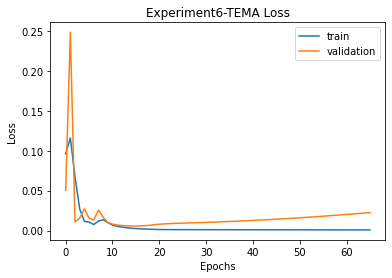


SMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 109.05489356902385 
RMSE:	 10.442935103170173 
MAPE:	 8.732625329283675

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	44.4% Accuracy
MSE:	 73.04142380966745 
RMSE:	 8.546427546622475 
MAPE:	 7.099244401385842

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 84.94978866341171 
RMSE:	 9.21682096296829 
MAPE:	 7.490547440692417

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 151.61070955572364 
RMSE:	 12.313030072070955 
MAPE:	 11.085595013418024

KAMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 80.0014001509936 
RMSE:	 8.944350180476702 
MAPE:	 7.358601729961256

MIDPOINT
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 61.18379984959283 
RMSE:	 7.822007405365507 
MAPE:	 6.441728946960992

T3
Prediction vs Close:		

In [123]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation6 = {}
    imgfile = 'Experiment6'
    for ma in optimized_period:
                print(ma)
                print(functions[ma])
                print ( int( optimized_period[ma]))
              # if ma == 'SMA':
                low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
                low_vol = low_vol.fillna(0)
                low_vol_data = df['close']
                high_vol = pd.DataFrame()
                df2 = df.copy()
                for i in df2.columns:
                  if i in low_vol.columns:
                    high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
                high_vol_data = df['close']
                ## *****************************************************
                # Generate ARIMA and LSTM predictions
                print('\nWorking on ' + ma + ' predictions')
                try:
                  print('parameters used : ', train_len, test_len)
                  low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima_exog(low_vol,low_vol_data, train_len, test_len)
                except:
                    print('ARIMA error, skipping to next MA type')
                    continue
                Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
                final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
                mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
                rmse_ftr = mse_ftr ** 0.5
                mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
                mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

                final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
                mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
                rmse = mse ** 0.5
                mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                # Generate prediction accuracy
                actual = df['close'].tail(test_len).values
                result_1 = []
                result_2 = []
                for i in range(1, len(final_prediction)):
                    # Compare prediction to previous close price
                    if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                        result_1.append(1)
                    elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                        result_1.append(1)
                    else:
                        result_1.append(0)

                    # Compare prediction to previous prediction
                    if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                        result_2.append(1)
                    elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                        result_2.append(1)
                    else:
                        result_2.append(0)

                accuracy_1 = np.mean(result_1)
                accuracy_2 = np.mean(result_2)

                simulation6[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                              'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                  'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                              'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                  'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                              'rmse': rmse_ftr, 'mae' : mae_ftr},
                                  'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                            'rmse': rmse, 'mae': mae },
                                  'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

                # save simulation data here as checkpoint
                with open('simulation6_data.json', 'w') as fp:
                    json.dump(simulation6, fp)

                for ma in simulation6.keys():
                    print('\n' + ma)
                    print('Prediction vs Close:\t\t' + str(round(100*simulation6[ma]['accuracy']['prediction vs close'], 2))
                          + '% Accuracy')
                    print('Prediction vs Prediction:\t' + str(round(100*simulation6[ma]['accuracy']['prediction vs prediction'], 2))
                          + '% Accuracy')
                    print('MSE:\t', simulation6[ma]['final']['mse'],
                          '\nRMSE:\t', simulation6[ma]['final']['rmse'],
                          '\nMAPE:\t', simulation6[ma]['final']['mae'])#,
                          # '\nMAPE:\t', simulation[ma]['final']['mape'])
              # else:
              #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [128]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment6.png to Experiment6 (2).png


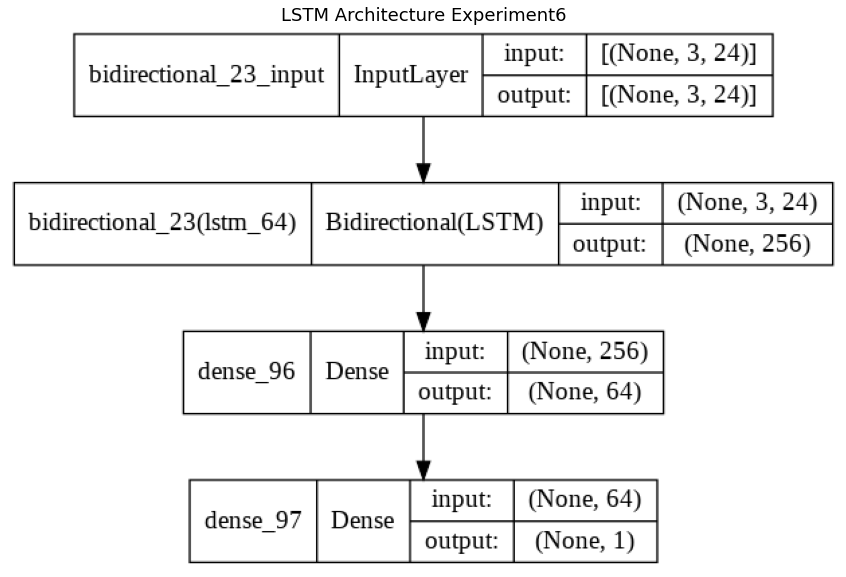

In [130]:
img = cv2.imread('Experiment6.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [150]:
with open('simulation6_data.json') as json_file:
    simulation6 = json.load(json_file)
fileimg = 'Experiment6'

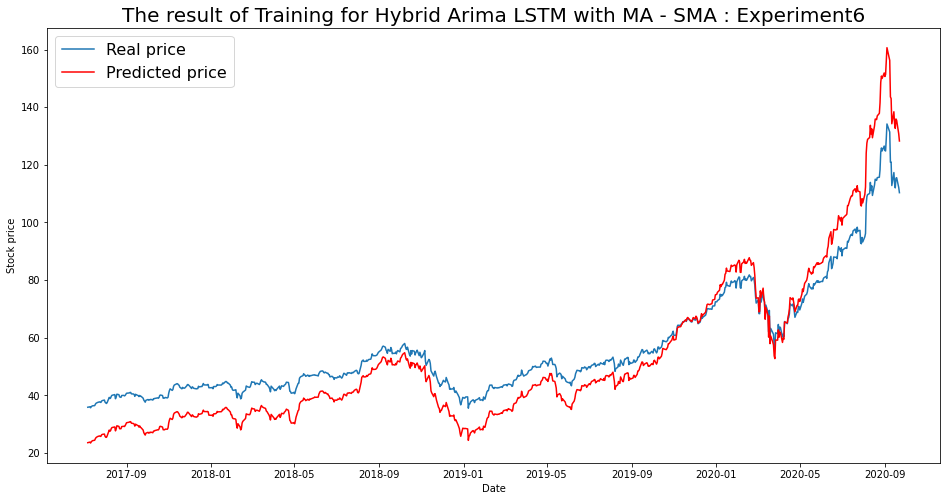

----- Train RMSE for SMA ----- 8.884485327179771
----- Train_MSE_LSTM for SMA ----- 78.93407952887263
----- Train MAE LSTM for SMA ----- 7.7230452013589295


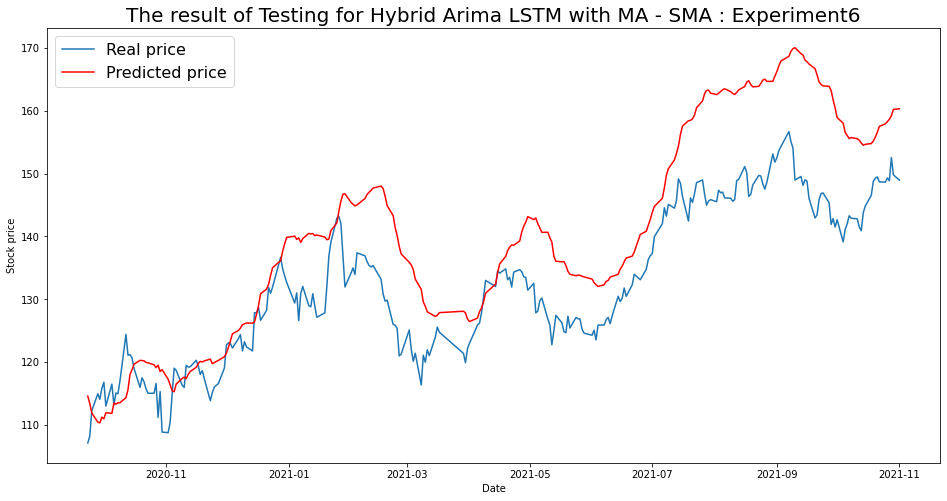

----- Test RMSE for SMA----- 10.442935103170173
----- Test_MSE_LSTM for SMA----- 109.05489356902385
----- Test_MAE_LSTM for SMA----- 8.732625329283675


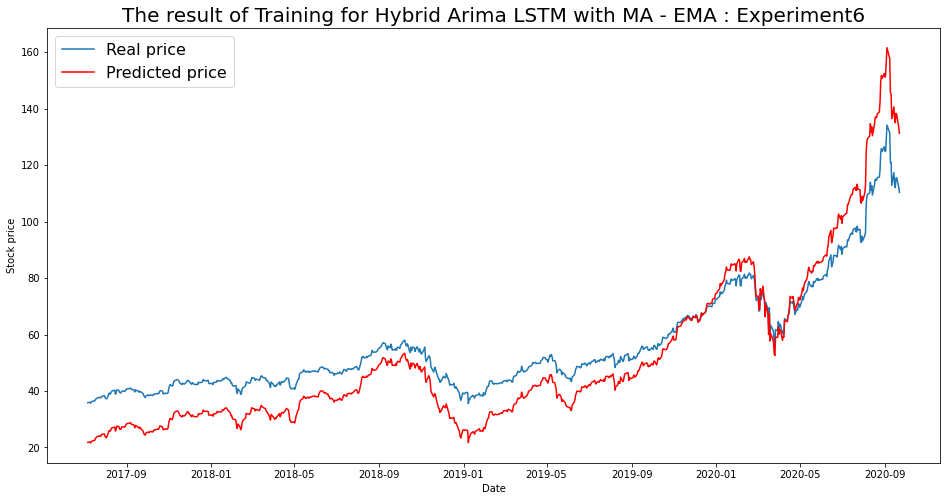

----- Train RMSE for EMA ----- 10.171650757359036
----- Train_MSE_LSTM for EMA ----- 103.46247912968265
----- Train MAE LSTM for EMA ----- 8.997792035349331


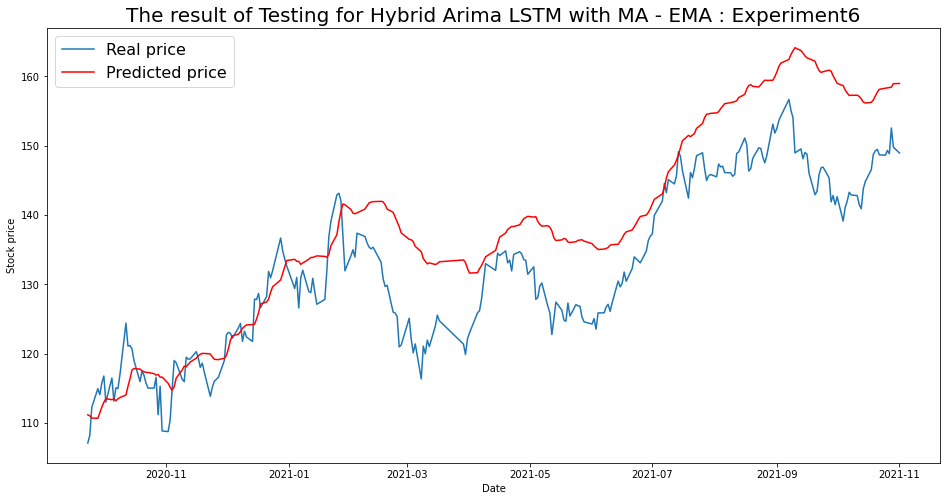

----- Test RMSE for EMA----- 8.546427546622475
----- Test_MSE_LSTM for EMA----- 73.04142380966745
----- Test_MAE_LSTM for EMA----- 7.099244401385842


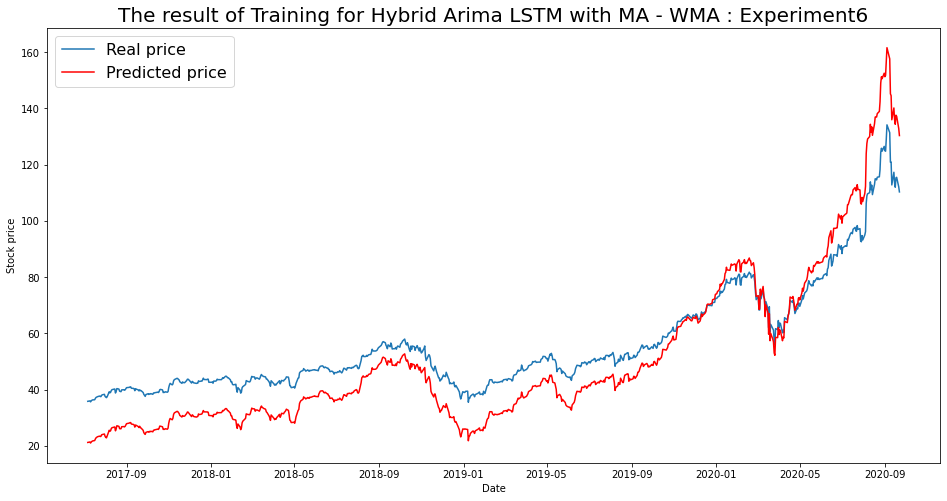

----- Train RMSE for WMA ----- 10.46606060205442
----- Train_MSE_LSTM for WMA ----- 109.53842452587571
----- Train MAE LSTM for WMA ----- 9.32499706302078


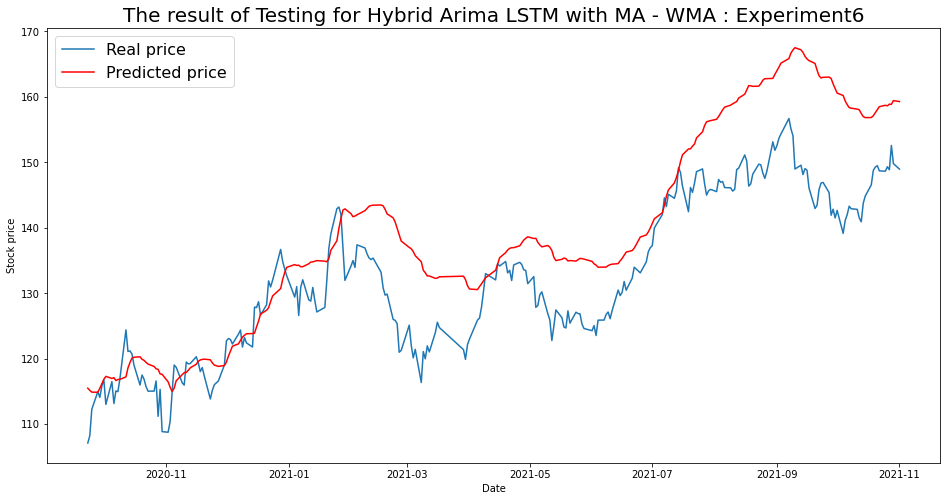

----- Test RMSE for WMA----- 9.21682096296829
----- Test_MSE_LSTM for WMA----- 84.94978866341171
----- Test_MAE_LSTM for WMA----- 7.490547440692417


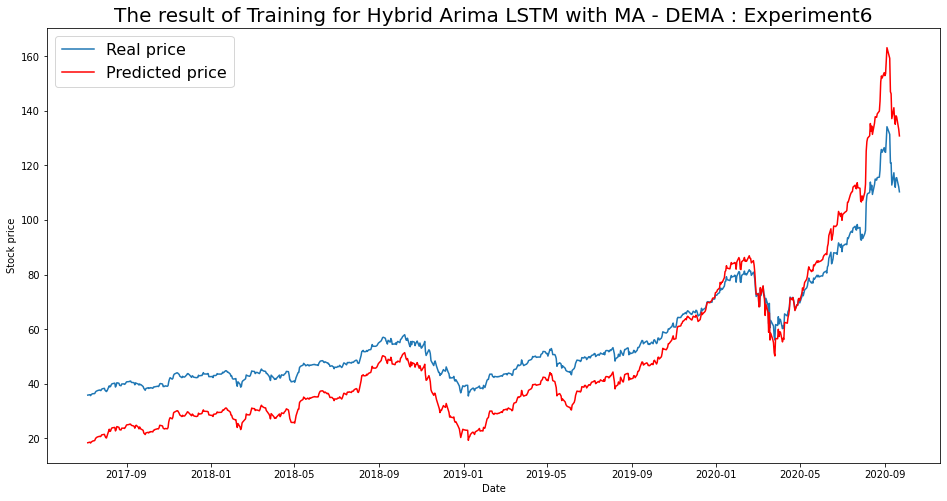

----- Train RMSE for DEMA ----- 12.135400340426562
----- Train_MSE_LSTM for DEMA ----- 147.26794142242514
----- Train MAE LSTM for DEMA ----- 10.923669650609977


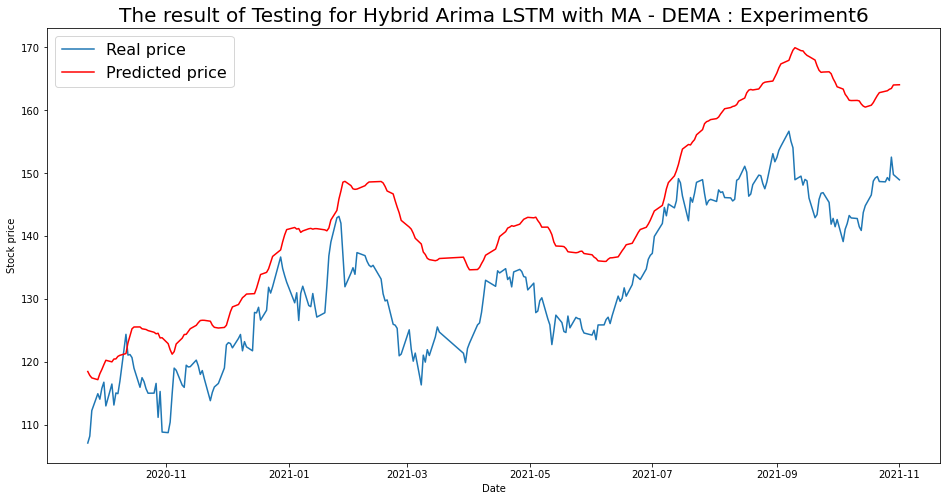

----- Test RMSE for DEMA----- 12.313030072070955
----- Test_MSE_LSTM for DEMA----- 151.61070955572364
----- Test_MAE_LSTM for DEMA----- 11.085595013418024


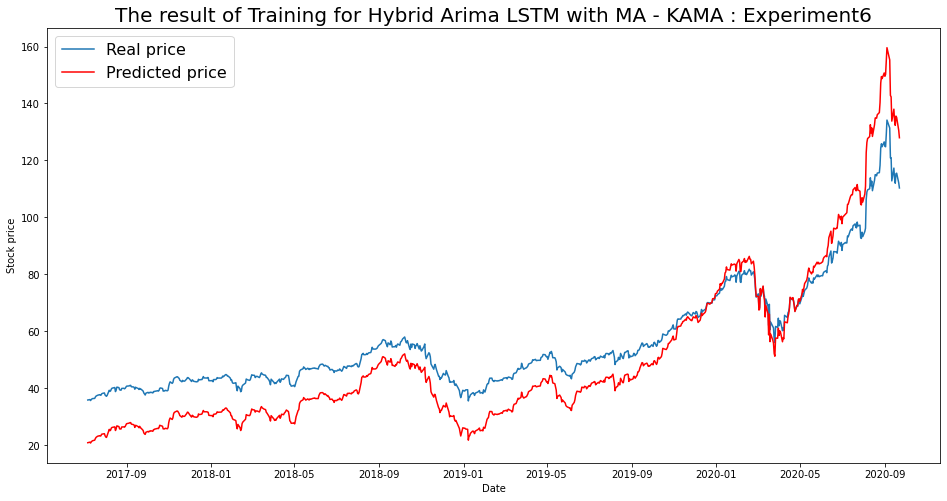

----- Train RMSE for KAMA ----- 10.536710095405018
----- Train_MSE_LSTM for KAMA ----- 111.02225963461002
----- Train MAE LSTM for KAMA ----- 9.489313762266152


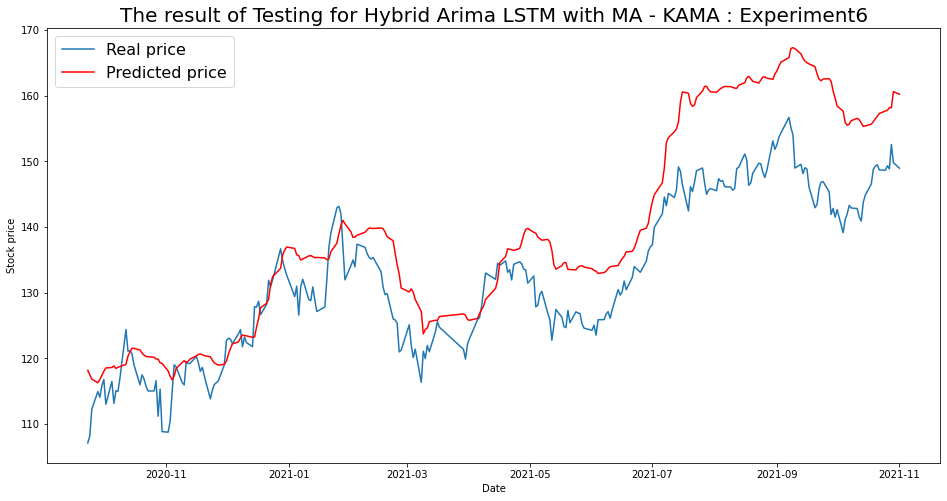

----- Test RMSE for KAMA----- 8.944350180476702
----- Test_MSE_LSTM for KAMA----- 80.0014001509936
----- Test_MAE_LSTM for KAMA----- 7.358601729961256


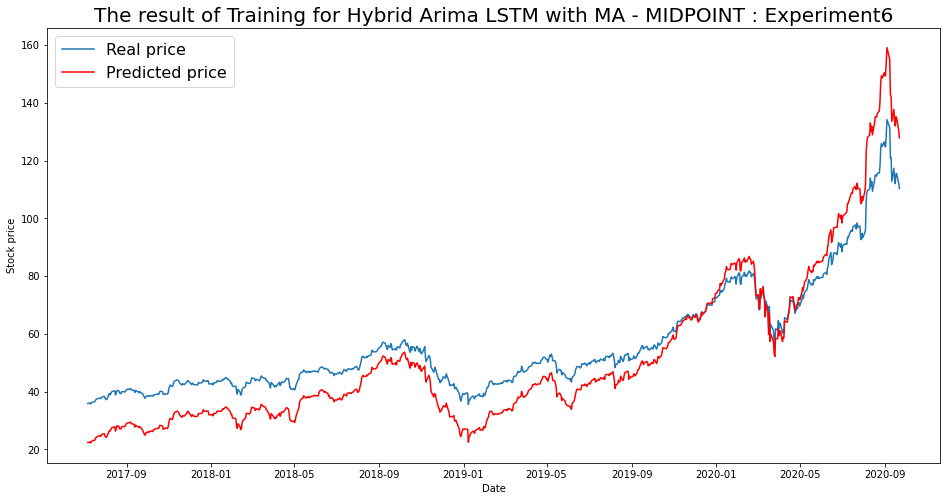

----- Train RMSE for MIDPOINT ----- 9.483224784900598
----- Train_MSE_LSTM for MIDPOINT ----- 89.93155232095299
----- Train MAE LSTM for MIDPOINT ----- 8.402424233592125


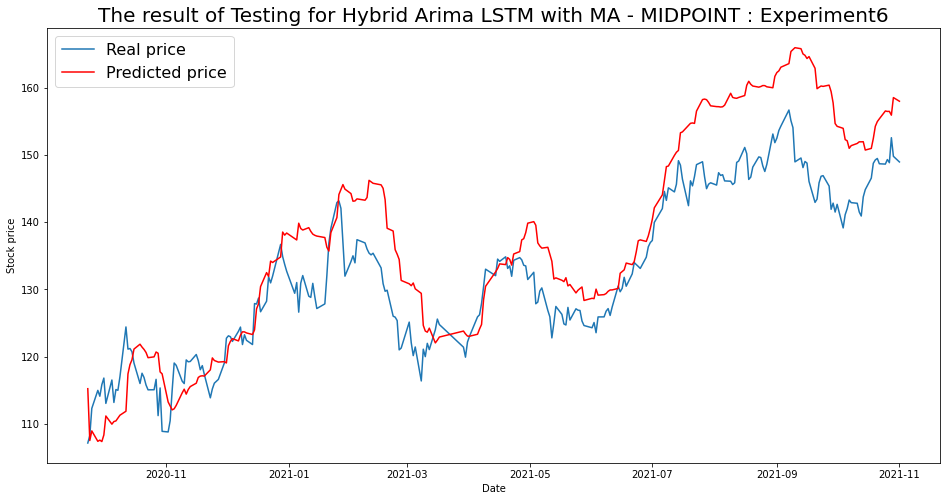

----- Test RMSE for MIDPOINT----- 7.822007405365507
----- Test_MSE_LSTM for MIDPOINT----- 61.18379984959283
----- Test_MAE_LSTM for MIDPOINT----- 6.441728946960992


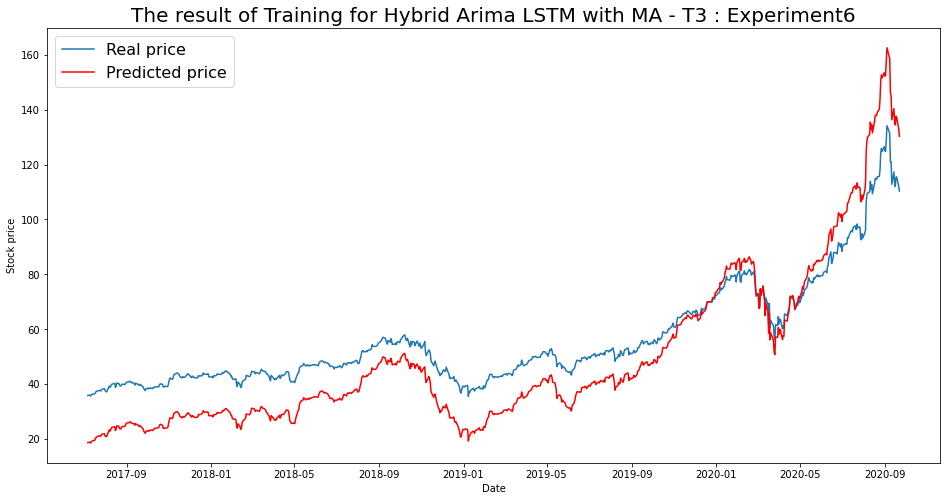

----- Train RMSE for T3 ----- 12.056010756671938
----- Train_MSE_LSTM for T3 ----- 145.3473953649895
----- Train MAE LSTM for T3 ----- 10.855993463265904


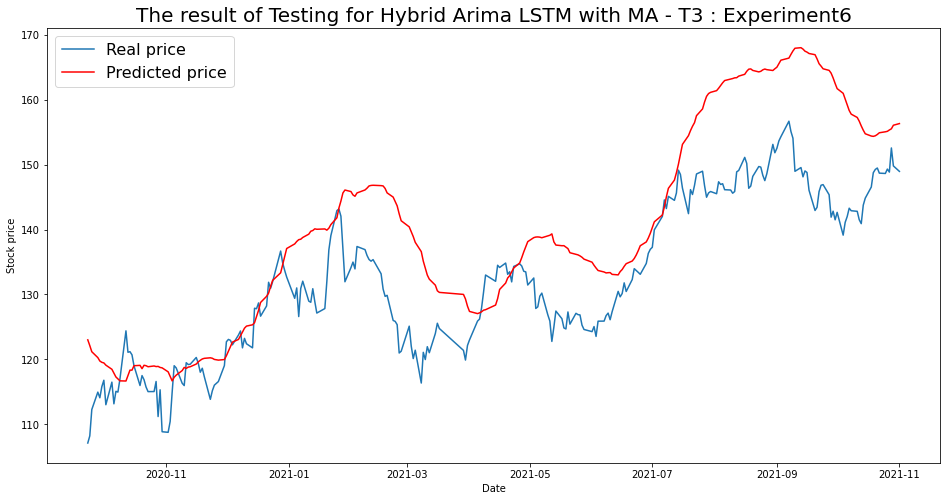

----- Test RMSE for T3----- 10.514998001927937
----- Test_MSE_LSTM for T3----- 110.56518298054853
----- Test_MAE_LSTM for T3----- 8.473394546481362


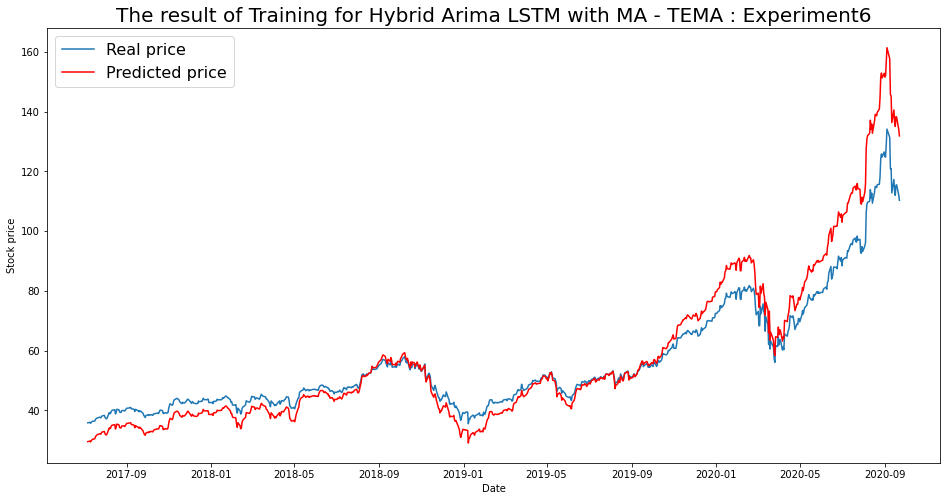

----- Train RMSE for TEMA ----- 7.432705233614638
----- Train_MSE_LSTM for TEMA ----- 55.24510708980243
----- Train MAE LSTM for TEMA ----- 5.131892957309109


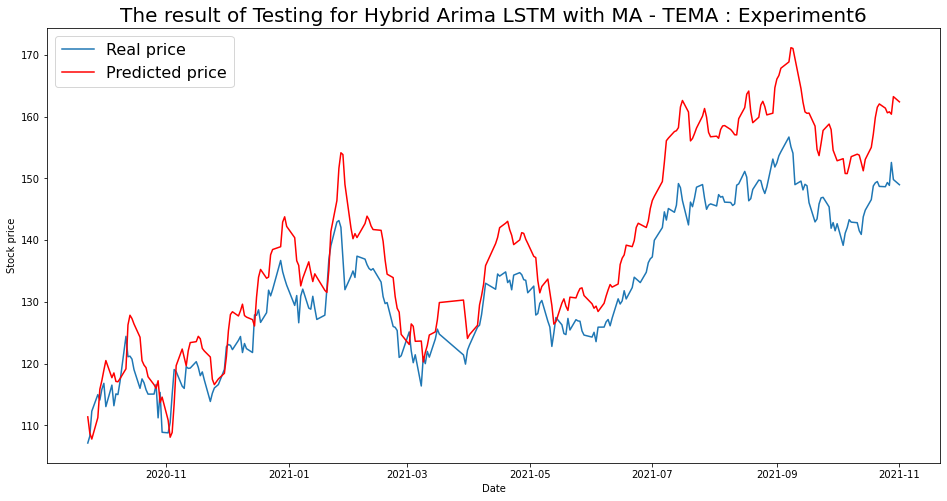

----- Test RMSE for TEMA----- 8.340715527022663
----- Test_MSE_LSTM for TEMA----- 69.56753550271695
----- Test_MAE_LSTM for TEMA----- 7.185876850367952


In [151]:
for i in range(len(list(simulation6.keys()))):
  SIM = list(simulation6.keys())[i]
  plot_train(simulation6,SIM)
  plot_test(simulation6,SIM)

## Arima w Exogenous Variable Multistep MutiVariate LSTM Hybrid Model Experiment 7

In [131]:
def get_arima_exog(dataframe,original_data, train_len, test_len):    
    

    # prepare train and test data for exogenous vr
    X_value = pd.DataFrame(low_vol.iloc[:, :])
    y_value = pd.DataFrame(low_vol.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    X_scale_dataset = X_scaler.fit_transform(X_value)
    y_scale_dataset = y_scaler.fit_transform(y_value)
    # Get data and check shape
    # X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X_scale_dataset)
    y_train, y_test, = split_train_test(y_scale_dataset)
    yc_train,yc_test = split_train_test(low_vol_data)
    yc = yc_test.values.tolist()
    y_train_list = y_train.flatten().tolist()
    y_test_list = y_test.flatten().tolist()
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

    # Initialize model
    model = auto_arima(y_train_list,exogenous  = X_train,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
            suppress_warnings=True,stepwise=True,seasonal=True)

      # Determine model parameters
    print(model.summary())
    model.fit(y_train_list,maxiter=200)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

      # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
        model = pmdarima.ARIMA(order=order)
        model.fit(y_train_list)
        # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')

        prediction.append(model.predict()[0])
        y_train_list.append(y_test_list[i])

    predictionte = y_scaler.inverse_transform(np.array(prediction).reshape(-1,1))
    y_test_ = y_scaler.inverse_transform(np.array(y_test_list).reshape(-1,1))

    # Generate error data
    mse = mean_squared_error(yc_test, predictionte)
    rmse = mse ** 0.5
    mae = mean_absolute_error(y_test_ , predictionte )
    return yc,predictionte.flatten().tolist(), mse, rmse, mae

In [132]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det =20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM7.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma+' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 3
    # define custom activation
    # 
    class Double_Tanh(Activation):
        def __init__(self, activation, **kwargs):
            super(Double_Tanh, self).__init__(activation, **kwargs)
            self.__name__ = 'double_tanh'

    def double_tanh(x):
        return (K.tanh(x) * 2)

    get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
        # Model Generation
    model = Sequential()
    #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    model.add(Dense(1))
    model.add(Activation(double_tanh))
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM7.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16999.786, Time=3.39 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14568.592, Time=4.80 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15578.394, Time=8.54 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14566.592, Time=7.06 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16966.361, Time=9.28 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-16121.635, Time=10.17 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-17214.069, Time=13.33 sec
 ARIMA(0,3,3)(0,0,0)[0]             : AIC=-14562.592, Time=9.04 sec
 ARIMA(1,3,3)(0,0,0)[0]             : AIC=-14572.319, Time=10.11 sec
 ARIMA(0,3,2)(0,0,0)[0] intercept   : AIC=-14403.474, Time=43.98 sec

Best model:  ARIMA(0,3,2)(0,0,0)[0]          
Tot

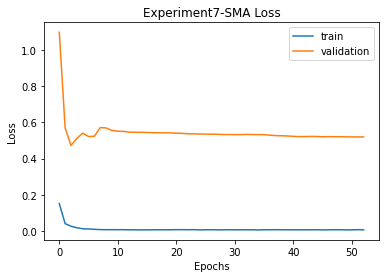


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 133.6684179910327 
RMSE:	 11.561505870388714 
MAPE:	 10.289389775089397
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16999.778, Time=3.24 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14568.589, Time=4.62 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-14606.447, Time=5.96 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14566.589, Time=7.07 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15343.613, Time=9.68 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-15047.583, Time=12.72 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-16858.964, Time=11.56 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-17024.022, Time=6.23 sec
 ARIMA(3,3,0)(0,0,0)[

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16997.990, Time=3.75 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16992.667, Time=4.25 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 96.460 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.726
Date:                Sun, 12 Dec 2021   AIC                         -17081.451
Time:                        17:11:15   BIC                         -16945.417
Sample:                             0   HQIC                        -17029.208
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

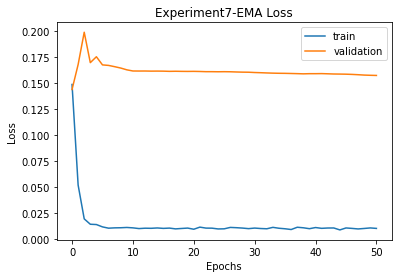


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 133.6684179910327 
RMSE:	 11.561505870388714 
MAPE:	 10.289389775089397

EMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 34.52931938659473 
RMSE:	 5.876165364129462 
MAPE:	 4.852473639818076
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16999.780, Time=2.89 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14568.589, Time=4.60 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16789.784, Time=12.16 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14566.589, Time=7.24 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16919.987, Time=9.55 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-14616.097, Time=12.57 sec
 

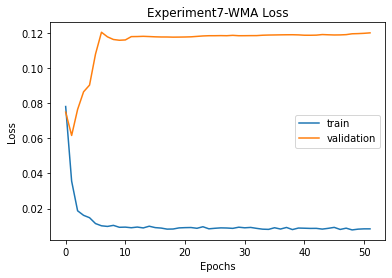


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 133.6684179910327 
RMSE:	 11.561505870388714 
MAPE:	 10.289389775089397

EMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 34.52931938659473 
RMSE:	 5.876165364129462 
MAPE:	 4.852473639818076

WMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.74468487644727 
RMSE:	 6.061739426637149 
MAPE:	 4.85767480758183
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16999.785, Time=3.06 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14568.588, Time=4.53 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15575.689, Time=8.72 sec
 ARIMA(0,3,1)(0,0,0)[0]           

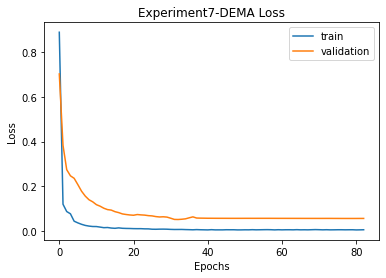


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 133.6684179910327 
RMSE:	 11.561505870388714 
MAPE:	 10.289389775089397

EMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 34.52931938659473 
RMSE:	 5.876165364129462 
MAPE:	 4.852473639818076

WMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.74468487644727 
RMSE:	 6.061739426637149 
MAPE:	 4.85767480758183

DEMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 87.45802496937279 
RMSE:	 9.351899538028238 
MAPE:	 8.239361009856534
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16921.943, Time=10.66 sec
 ARIMA(0,3

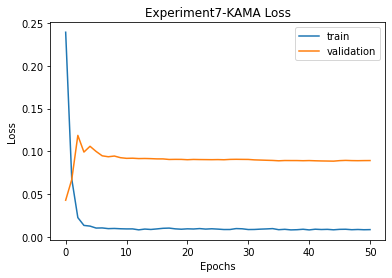


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 133.6684179910327 
RMSE:	 11.561505870388714 
MAPE:	 10.289389775089397

EMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 34.52931938659473 
RMSE:	 5.876165364129462 
MAPE:	 4.852473639818076

WMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.74468487644727 
RMSE:	 6.061739426637149 
MAPE:	 4.85767480758183

DEMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 87.45802496937279 
RMSE:	 9.351899538028238 
MAPE:	 8.239361009856534

KAMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 55.655998887145394 
RMSE:	 7.460294825752223 
MAPE:	 6.325008398714769
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MIDPOI

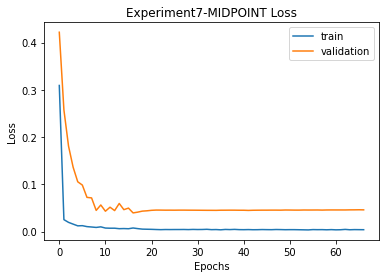


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 133.6684179910327 
RMSE:	 11.561505870388714 
MAPE:	 10.289389775089397

EMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 34.52931938659473 
RMSE:	 5.876165364129462 
MAPE:	 4.852473639818076

WMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.74468487644727 
RMSE:	 6.061739426637149 
MAPE:	 4.85767480758183

DEMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 87.45802496937279 
RMSE:	 9.351899538028238 
MAPE:	 8.239361009856534

KAMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 55.655998887145394 
RMSE:	 7.460294825752223 
MAPE:	 6.325008398714769

MIDPOINT
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 28.58496814832563 
RMSE:	 5.346491199686541 
MAPE:	 4.412567377496203
T3
T3([input_arrays], [timepe

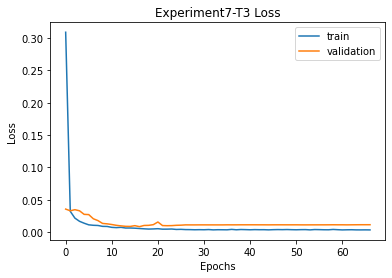


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 133.6684179910327 
RMSE:	 11.561505870388714 
MAPE:	 10.289389775089397

EMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 34.52931938659473 
RMSE:	 5.876165364129462 
MAPE:	 4.852473639818076

WMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.74468487644727 
RMSE:	 6.061739426637149 
MAPE:	 4.85767480758183

DEMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 87.45802496937279 
RMSE:	 9.351899538028238 
MAPE:	 8.239361009856534

KAMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 55.655998887145394 
RMSE:	 7.460294825752223 
MAPE:	 6.325008398714769

MIDPOINT
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 28.58496814832563 
RMSE:	 5.346491199686541 
MAPE:	 4.412567377496203

T3
Prediction vs Close:		52.

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16523.926, Time=3.65 sec
 ARIMA(1,3,1)(0,0,0)[0] intercept   : AIC=-16696.008, Time=3.22 sec

Best model:  ARIMA(1,3,1)(0,0,0)[0]          
Total fit time: 68.599 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(1, 3, 1)   Log Likelihood                8408.400
Date:                Sun, 12 Dec 2021   AIC                         -16762.799
Time:                        17:50:11   BIC                         -16636.147
Sample:                             0   HQIC                        -16714.159
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

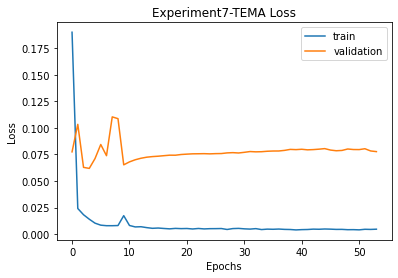


SMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 133.6684179910327 
RMSE:	 11.561505870388714 
MAPE:	 10.289389775089397

EMA
Prediction vs Close:		50.0% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 34.52931938659473 
RMSE:	 5.876165364129462 
MAPE:	 4.852473639818076

WMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 36.74468487644727 
RMSE:	 6.061739426637149 
MAPE:	 4.85767480758183

DEMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 87.45802496937279 
RMSE:	 9.351899538028238 
MAPE:	 8.239361009856534

KAMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 55.655998887145394 
RMSE:	 7.460294825752223 
MAPE:	 6.325008398714769

MIDPOINT
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 28.58496814832563 
RMSE:	 5.346491199686541 
MAPE:	 4.412567377496203

T3
Prediction vs Close:		52.

In [133]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation7 = {}
    imgfile = 'Experiment7'
    for ma in optimized_period:
                print(ma)
                print(functions[ma])
                print ( int( optimized_period[ma]))
              # if ma == 'SMA':
                low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
                low_vol = low_vol.fillna(0)
                low_vol_data = df['close']
                high_vol = pd.DataFrame()
                df2 = df.copy()
                for i in df2.columns:
                  if i in low_vol.columns:
                    high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
                high_vol_data = df['close']
                ## *****************************************************
                # Generate ARIMA and LSTM predictions
                print('\nWorking on ' + ma + ' predictions')
                try:
                  print('parameters used : ', train_len, test_len)
                  low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima_exog(low_vol,low_vol_data, train_len, test_len)
                except:
                    print('ARIMA error, skipping to next MA type')
                    continue
                Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
                final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
                mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
                rmse_ftr = mse_ftr ** 0.5
                mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
                mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

                final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
                mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
                rmse = mse ** 0.5
                mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                # Generate prediction accuracy
                actual = df['close'].tail(test_len).values
                result_1 = []
                result_2 = []
                for i in range(1, len(final_prediction)):
                    # Compare prediction to previous close price
                    if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                        result_1.append(1)
                    elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                        result_1.append(1)
                    else:
                        result_1.append(0)

                    # Compare prediction to previous prediction
                    if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                        result_2.append(1)
                    elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                        result_2.append(1)
                    else:
                        result_2.append(0)

                accuracy_1 = np.mean(result_1)
                accuracy_2 = np.mean(result_2)

                simulation7[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                              'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                  'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                              'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                  'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                              'rmse': rmse_ftr, 'mae' : mae_ftr},
                                  'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                            'rmse': rmse, 'mae': mae },
                                  'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

                # save simulation data here as checkpoint
                with open('simulation7_data.json', 'w') as fp:
                    json.dump(simulation7, fp)

                for ma in simulation7.keys():
                    print('\n' + ma)
                    print('Prediction vs Close:\t\t' + str(round(100*simulation7[ma]['accuracy']['prediction vs close'], 2))
                          + '% Accuracy')
                    print('Prediction vs Prediction:\t' + str(round(100*simulation7[ma]['accuracy']['prediction vs prediction'], 2))
                          + '% Accuracy')
                    print('MSE:\t', simulation7[ma]['final']['mse'],
                          '\nRMSE:\t', simulation7[ma]['final']['rmse'],
                          '\nMAPE:\t', simulation7[ma]['final']['mae'])#,
                          # '\nMAPE:\t', simulation[ma]['final']['mape'])
              # else:
              #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [134]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment7.png to Experiment7 (1).png


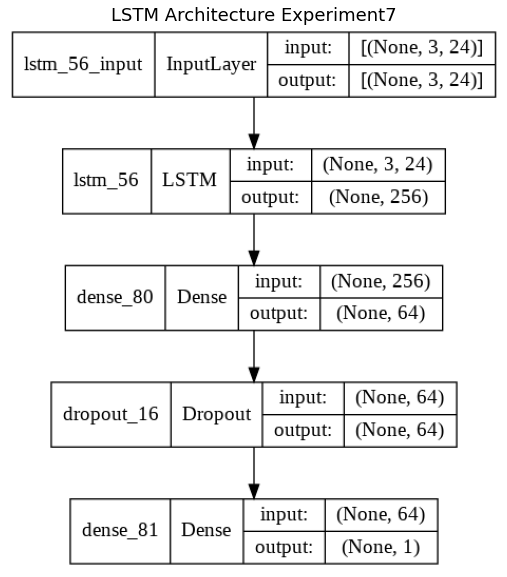

In [135]:
img = cv2.imread('Experiment5.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [164]:
import json
with open('simulation7_data.json') as json_file:
    simulation7 = json.load(json_file)
fileimg = 'Experiment7'

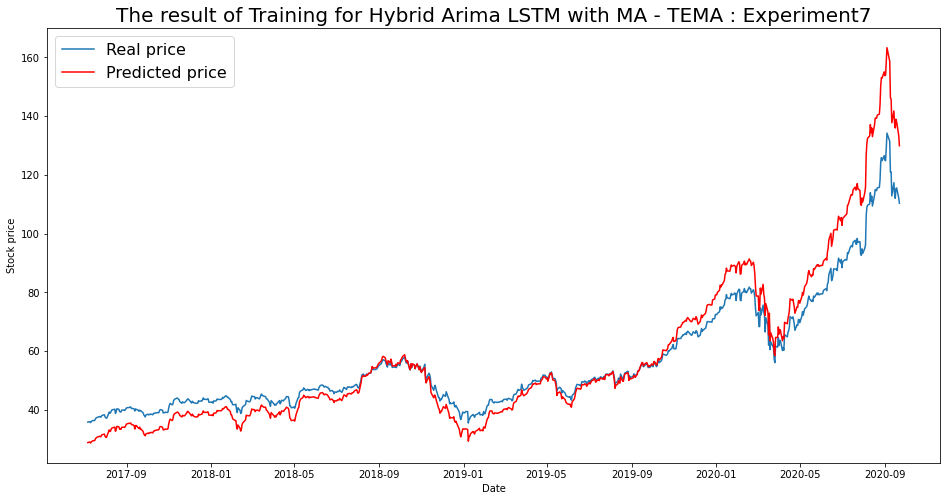

----- Train RMSE for TEMA ----- 7.535421816948624
----- Train_MSE_LSTM for TEMA ----- 56.7825819593453
----- Train MAE LSTM for TEMA ----- 5.2132834616768555


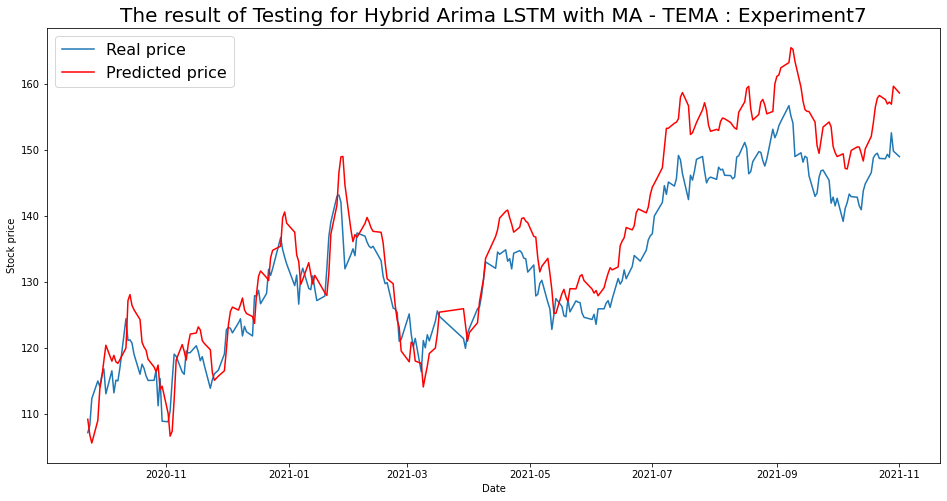

----- Test RMSE for TEMA----- 5.8480564200717415
----- Test_MSE_LSTM for TEMA----- 34.19976389234231
----- Test_MAE_LSTM for TEMA----- 5.017065986818192


In [165]:
for i in range(len(list(simulation8.keys()))):
  SIM = list(simulation7.keys())[i]
  plot_train(simulation7,SIM)
  plot_test(simulation7,SIM)

## Arima w Exogenous Variable Multistep MutiVariate LSTM Hybrid Model Experiment 8

In [137]:
def get_arima_exog(dataframe,original_data, train_len, test_len):    
    

    # prepare train and test data for exogenous vr
    X_value = pd.DataFrame(low_vol.iloc[:, :])
    y_value = pd.DataFrame(low_vol.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    X_scale_dataset = X_scaler.fit_transform(X_value)
    y_scale_dataset = y_scaler.fit_transform(y_value)
    # Get data and check shape
    # X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X_scale_dataset)
    y_train, y_test, = split_train_test(y_scale_dataset)
    yc_train,yc_test = split_train_test(low_vol_data)
    yc = yc_test.values.tolist()
    y_train_list = y_train.flatten().tolist()
    y_test_list = y_test.flatten().tolist()
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

    # Initialize model
    model = auto_arima(y_train_list,exogenous  = X_train,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
            suppress_warnings=True,stepwise=True,seasonal=True)

      # Determine model parameters
    print(model.summary())
    model.fit(y_train_list,maxiter=200)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

      # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
        model = pmdarima.ARIMA(order=order)
        model.fit(y_train_list)
        # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')

        prediction.append(model.predict()[0])
        y_train_list.append(y_test_list[i])

    predictionte = y_scaler.inverse_transform(np.array(prediction).reshape(-1,1))
    y_test_ = y_scaler.inverse_transform(np.array(y_test_list).reshape(-1,1))

    # Generate error data
    mse = mean_squared_error(yc_test, predictionte)
    rmse = mse ** 0.5
    mae = mean_absolute_error(y_test_ , predictionte )
    return yc,predictionte.flatten().tolist(), mse, rmse, mae

In [138]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det =20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM7.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma+' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 3
    # define custom activation
    # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM7.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma+' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # #Option 4
    # # Set up & fit LSTM RNN
    model = Sequential()
    model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(input_dim, feature_size)))
    model.add(LSTM(units=int(lstm_len/2)))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='mean_squared_error', optimizer='adam')
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM8.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16999.786, Time=3.28 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14568.592, Time=4.67 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15578.394, Time=8.51 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14566.592, Time=7.38 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16966.361, Time=9.48 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-16121.635, Time=9.85 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-17214.069, Time=12.68 sec
 ARIMA(0,3,3)(0,0,0)[0]             : AIC=-14562.592, Time=9.21 sec
 ARIMA(1,3,3)(0,0,0)[0]             : AIC=-14572.319, Time=9.59 sec
 ARIMA(0,3,2)(0,0,0)[0] intercept   : AIC=-14403.474, Time=41.33 sec

Best model:  ARIMA(0,3,2)(0,0,0)[0]          
Total

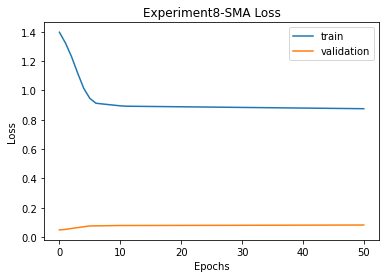


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 23.82392201920814 
RMSE:	 4.880975519218278 
MAPE:	 3.848681389687446
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16999.778, Time=3.08 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14568.589, Time=4.43 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-14606.447, Time=6.05 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14566.589, Time=6.66 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15343.613, Time=9.81 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-15047.583, Time=13.53 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-16858.964, Time=11.94 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-17024.022, Time=6.03 sec
 ARIMA(3,3,0)(0,0,0)[0]

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16997.990, Time=3.51 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16992.667, Time=4.34 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 96.060 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.726
Date:                Sun, 12 Dec 2021   AIC                         -17081.451
Time:                        18:08:04   BIC                         -16945.417
Sample:                             0   HQIC                        -17029.208
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

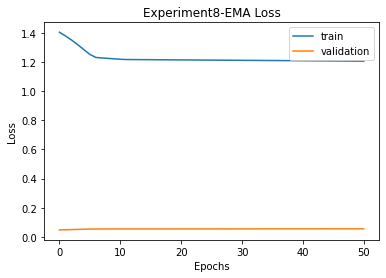


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 23.82392201920814 
RMSE:	 4.880975519218278 
MAPE:	 3.848681389687446

EMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 36.51946703896653 
RMSE:	 6.043133875644865 
MAPE:	 4.745071953502077
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16999.780, Time=2.87 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14568.589, Time=4.52 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16789.784, Time=11.92 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14566.589, Time=7.18 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16919.987, Time=9.64 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-14616.097, Time=11.83 sec
 

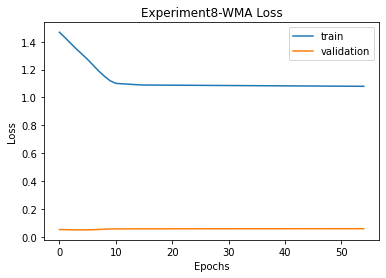


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 23.82392201920814 
RMSE:	 4.880975519218278 
MAPE:	 3.848681389687446

EMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 36.51946703896653 
RMSE:	 6.043133875644865 
MAPE:	 4.745071953502077

WMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 43.8622174139386 
RMSE:	 6.622855684214975 
MAPE:	 5.251112001385055
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16999.785, Time=3.17 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14568.588, Time=4.72 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15575.689, Time=9.20 sec
 ARIMA(0,3,1)(0,0,0)[0]           

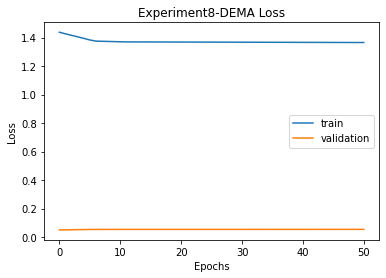


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 23.82392201920814 
RMSE:	 4.880975519218278 
MAPE:	 3.848681389687446

EMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 36.51946703896653 
RMSE:	 6.043133875644865 
MAPE:	 4.745071953502077

WMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 43.8622174139386 
RMSE:	 6.622855684214975 
MAPE:	 5.251112001385055

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 142.0772798190819 
RMSE:	 11.91961743593652 
MAPE:	 10.62322903609799
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16921.943, Time=10.33 sec
 ARIMA(0,

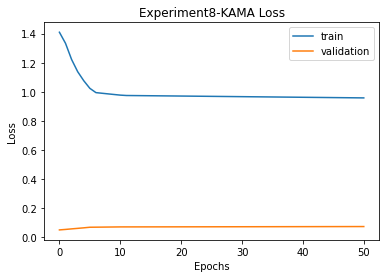


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 23.82392201920814 
RMSE:	 4.880975519218278 
MAPE:	 3.848681389687446

EMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 36.51946703896653 
RMSE:	 6.043133875644865 
MAPE:	 4.745071953502077

WMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 43.8622174139386 
RMSE:	 6.622855684214975 
MAPE:	 5.251112001385055

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 142.0772798190819 
RMSE:	 11.91961743593652 
MAPE:	 10.62322903609799

KAMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 22.038946216129663 
RMSE:	 4.694565604625168 
MAPE:	 3.7548184287573756
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MIDPOI

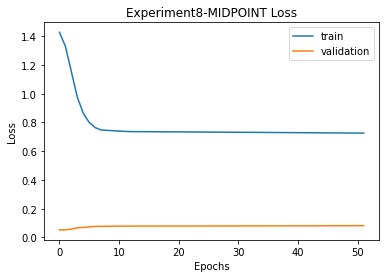


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 23.82392201920814 
RMSE:	 4.880975519218278 
MAPE:	 3.848681389687446

EMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 36.51946703896653 
RMSE:	 6.043133875644865 
MAPE:	 4.745071953502077

WMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 43.8622174139386 
RMSE:	 6.622855684214975 
MAPE:	 5.251112001385055

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 142.0772798190819 
RMSE:	 11.91961743593652 
MAPE:	 10.62322903609799

KAMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 22.038946216129663 
RMSE:	 4.694565604625168 
MAPE:	 3.7548184287573756

MIDPOINT
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 18.4805779796863 
RMSE:	 4.298904276636815 
MAPE:	 3.422385888494848
T3
T3([input_arrays], [timeper

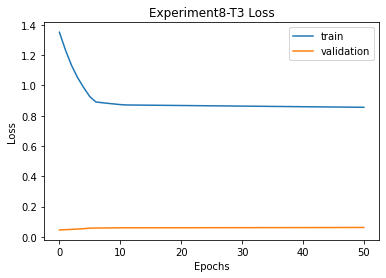


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 23.82392201920814 
RMSE:	 4.880975519218278 
MAPE:	 3.848681389687446

EMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 36.51946703896653 
RMSE:	 6.043133875644865 
MAPE:	 4.745071953502077

WMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 43.8622174139386 
RMSE:	 6.622855684214975 
MAPE:	 5.251112001385055

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 142.0772798190819 
RMSE:	 11.91961743593652 
MAPE:	 10.62322903609799

KAMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 22.038946216129663 
RMSE:	 4.694565604625168 
MAPE:	 3.7548184287573756

MIDPOINT
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 18.4805779796863 
RMSE:	 4.298904276636815 
MAPE:	 3.422385888494848

T3
Prediction vs Close:		53.3

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16523.926, Time=3.73 sec
 ARIMA(1,3,1)(0,0,0)[0] intercept   : AIC=-16696.008, Time=3.66 sec

Best model:  ARIMA(1,3,1)(0,0,0)[0]          
Total fit time: 71.466 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(1, 3, 1)   Log Likelihood                8408.400
Date:                Sun, 12 Dec 2021   AIC                         -16762.799
Time:                        18:47:46   BIC                         -16636.147
Sample:                             0   HQIC                        -16714.159
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

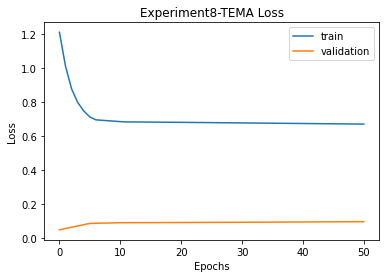


SMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 23.82392201920814 
RMSE:	 4.880975519218278 
MAPE:	 3.848681389687446

EMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 36.51946703896653 
RMSE:	 6.043133875644865 
MAPE:	 4.745071953502077

WMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 43.8622174139386 
RMSE:	 6.622855684214975 
MAPE:	 5.251112001385055

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 142.0772798190819 
RMSE:	 11.91961743593652 
MAPE:	 10.62322903609799

KAMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	50.0% Accuracy
MSE:	 22.038946216129663 
RMSE:	 4.694565604625168 
MAPE:	 3.7548184287573756

MIDPOINT
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 18.4805779796863 
RMSE:	 4.298904276636815 
MAPE:	 3.422385888494848

T3
Prediction vs Close:		53.3

In [139]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation8 = {}
    imgfile = 'Experiment8'
    for ma in optimized_period:
                print(ma)
                print(functions[ma])
                print ( int( optimized_period[ma]))
              # if ma == 'SMA':
                low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
                low_vol = low_vol.fillna(0)
                low_vol_data = df['close']
                high_vol = pd.DataFrame()
                df2 = df.copy()
                for i in df2.columns:
                  if i in low_vol.columns:
                    high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
                high_vol_data = df['close']
                ## *****************************************************
                # Generate ARIMA and LSTM predictions
                print('\nWorking on ' + ma + ' predictions')
                try:
                  print('parameters used : ', train_len, test_len)
                  low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima_exog(low_vol,low_vol_data, train_len, test_len)
                except:
                    print('ARIMA error, skipping to next MA type')
                    continue
                Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
                final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
                mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
                rmse_ftr = mse_ftr ** 0.5
                mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
                mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

                final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
                mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
                rmse = mse ** 0.5
                mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                # Generate prediction accuracy
                actual = df['close'].tail(test_len).values
                result_1 = []
                result_2 = []
                for i in range(1, len(final_prediction)):
                    # Compare prediction to previous close price
                    if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                        result_1.append(1)
                    elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                        result_1.append(1)
                    else:
                        result_1.append(0)

                    # Compare prediction to previous prediction
                    if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                        result_2.append(1)
                    elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                        result_2.append(1)
                    else:
                        result_2.append(0)

                accuracy_1 = np.mean(result_1)
                accuracy_2 = np.mean(result_2)

                simulation8[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                              'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                  'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                              'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                  'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                              'rmse': rmse_ftr, 'mae' : mae_ftr},
                                  'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                            'rmse': rmse, 'mae': mae },
                                  'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

                # save simulation data here as checkpoint
                with open('simulation8_data.json', 'w') as fp:
                    json.dump(simulation8, fp)

                for ma in simulation8.keys():
                    print('\n' + ma)
                    print('Prediction vs Close:\t\t' + str(round(100*simulation8[ma]['accuracy']['prediction vs close'], 2))
                          + '% Accuracy')
                    print('Prediction vs Prediction:\t' + str(round(100*simulation8[ma]['accuracy']['prediction vs prediction'], 2))
                          + '% Accuracy')
                    print('MSE:\t', simulation8[ma]['final']['mse'],
                          '\nRMSE:\t', simulation8[ma]['final']['rmse'],
                          '\nMAPE:\t', simulation8[ma]['final']['mae'])#,
                          # '\nMAPE:\t', simulation[ma]['final']['mape'])
              # else:
              #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [140]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment8.png to Experiment8 (1).png


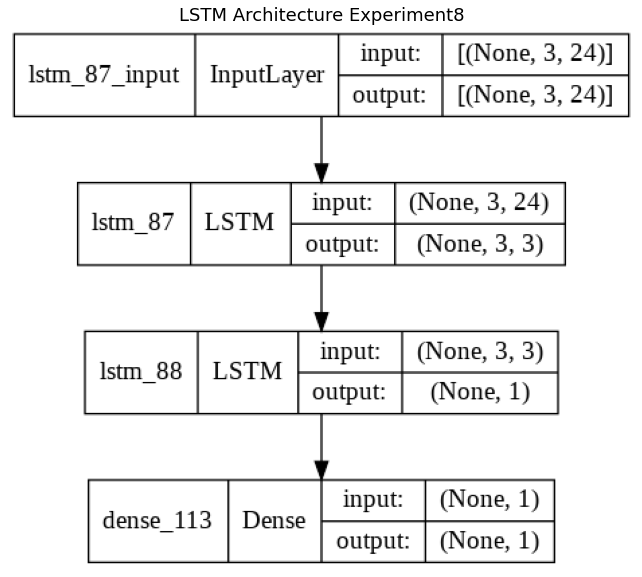

In [143]:
img = cv2.imread('Experiment8.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [154]:
with open('simulation8_data.json') as json_file:
    simulation8 = json.load(json_file)
fileimg = 'Experiment8'

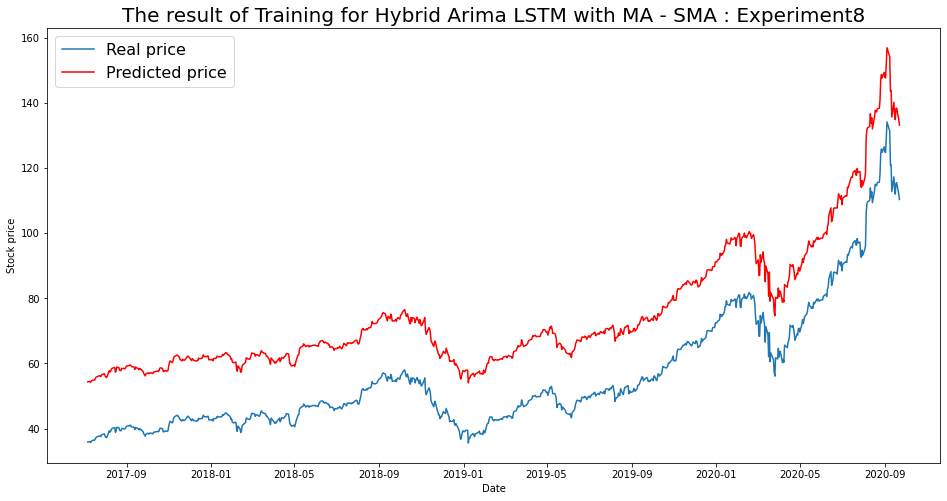

----- Train RMSE for SMA ----- 18.846065584784647
----- Train_MSE_LSTM for SMA ----- 355.1741880260043
----- Train MAE LSTM for SMA ----- 18.820755524210412


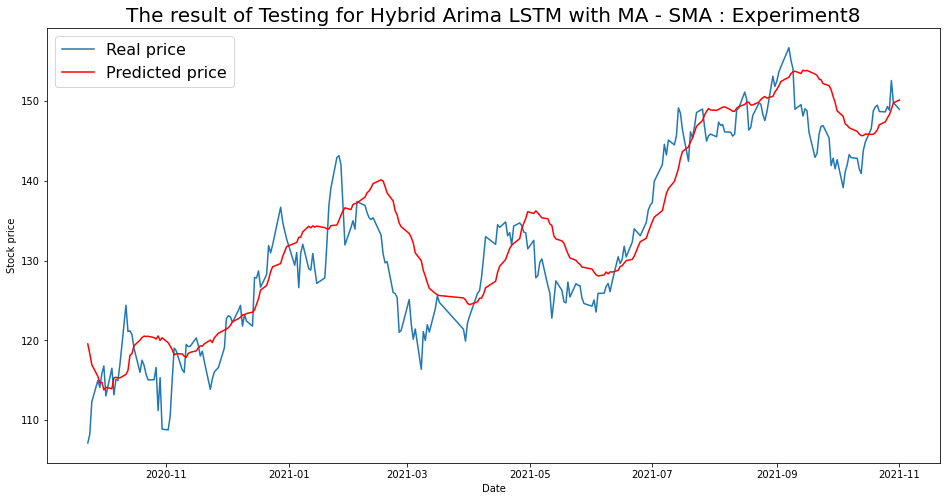

----- Test RMSE for SMA----- 4.880975519218278
----- Test_MSE_LSTM for SMA----- 23.82392201920814
----- Test_MAE_LSTM for SMA----- 3.848681389687446


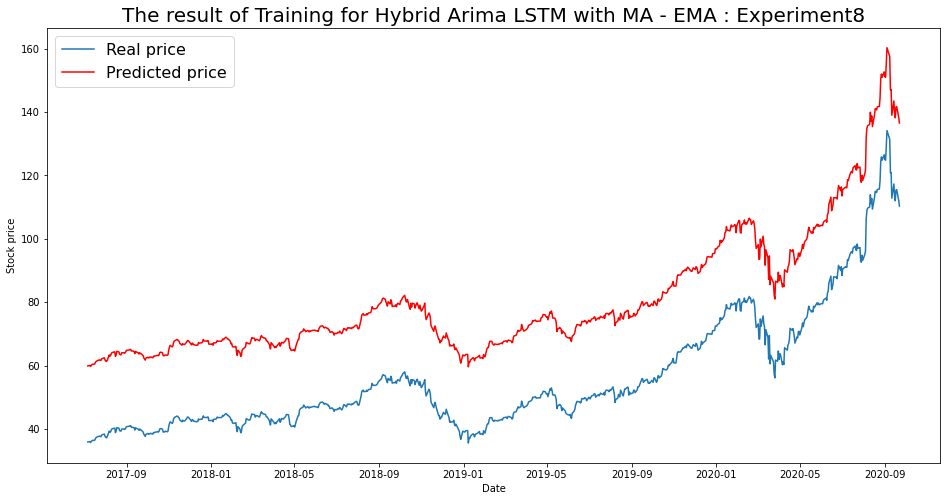

----- Train RMSE for EMA ----- 24.364485496157467
----- Train_MSE_LSTM for EMA ----- 593.6281534924675
----- Train MAE LSTM for EMA ----- 24.35965843720011


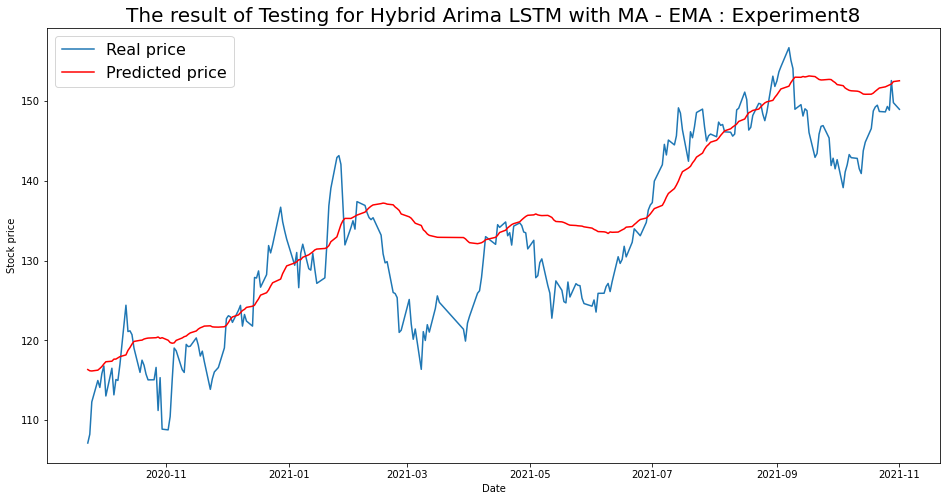

----- Test RMSE for EMA----- 6.043133875644865
----- Test_MSE_LSTM for EMA----- 36.51946703896653
----- Test_MAE_LSTM for EMA----- 4.745071953502077


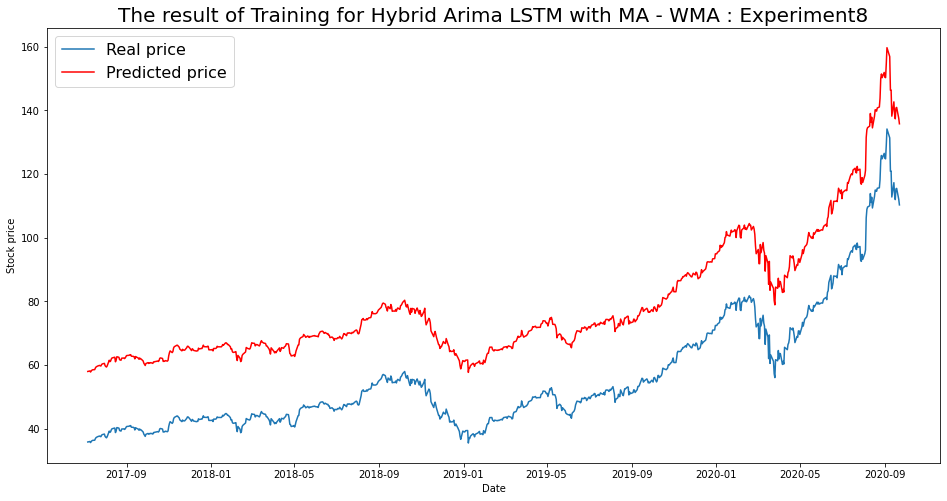

----- Train RMSE for WMA ----- 22.522819506061108
----- Train_MSE_LSTM for WMA ----- 507.27739850260673
----- Train MAE LSTM for WMA ----- 22.511068136385173


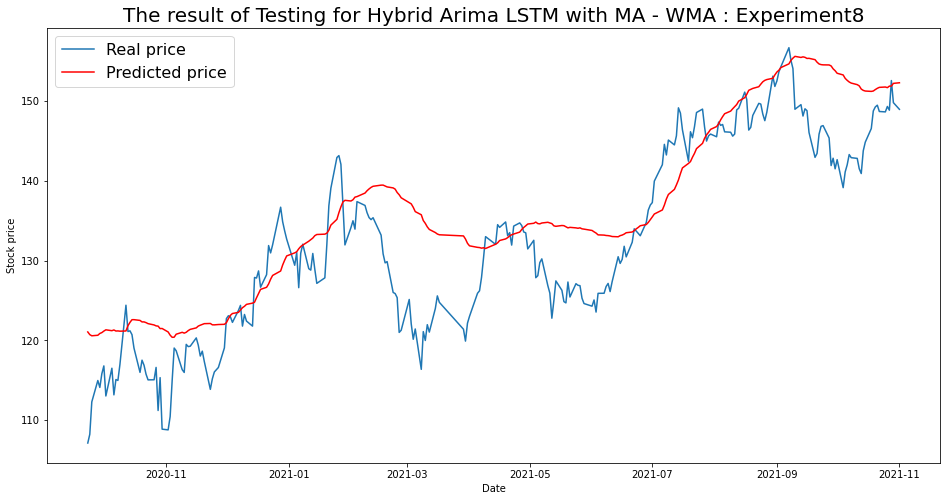

----- Test RMSE for WMA----- 6.622855684214975
----- Test_MSE_LSTM for WMA----- 43.8622174139386
----- Test_MAE_LSTM for WMA----- 5.251112001385055


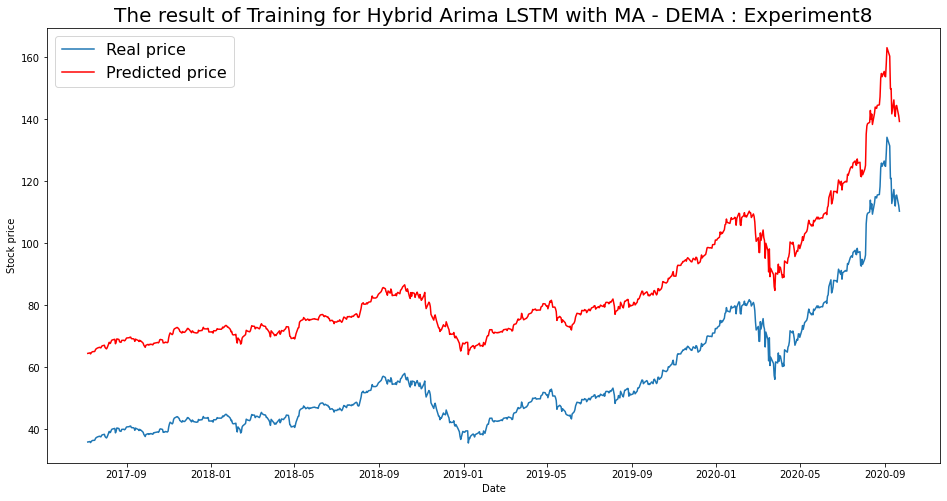

----- Train RMSE for DEMA ----- 28.644253182641428
----- Train_MSE_LSTM for DEMA ----- 820.4932403912636
----- Train MAE LSTM for DEMA ----- 28.644042274739483


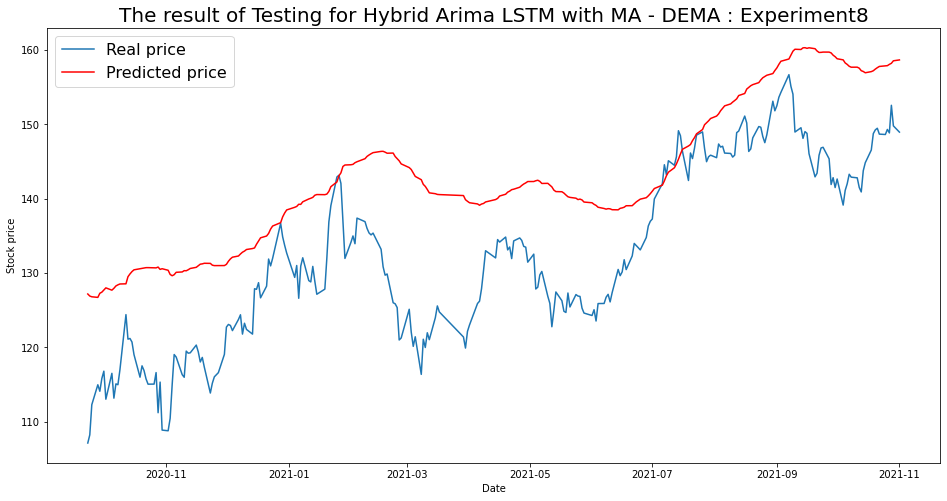

----- Test RMSE for DEMA----- 11.91961743593652
----- Test_MSE_LSTM for DEMA----- 142.0772798190819
----- Test_MAE_LSTM for DEMA----- 10.62322903609799


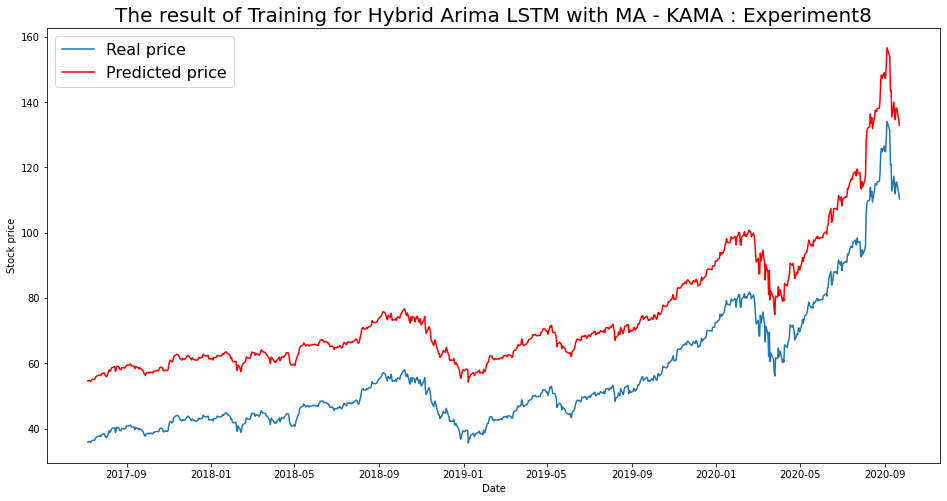

----- Train RMSE for KAMA ----- 18.988700576595924
----- Train_MSE_LSTM for KAMA ----- 360.5707495876144
----- Train MAE LSTM for KAMA ----- 18.970468660392385


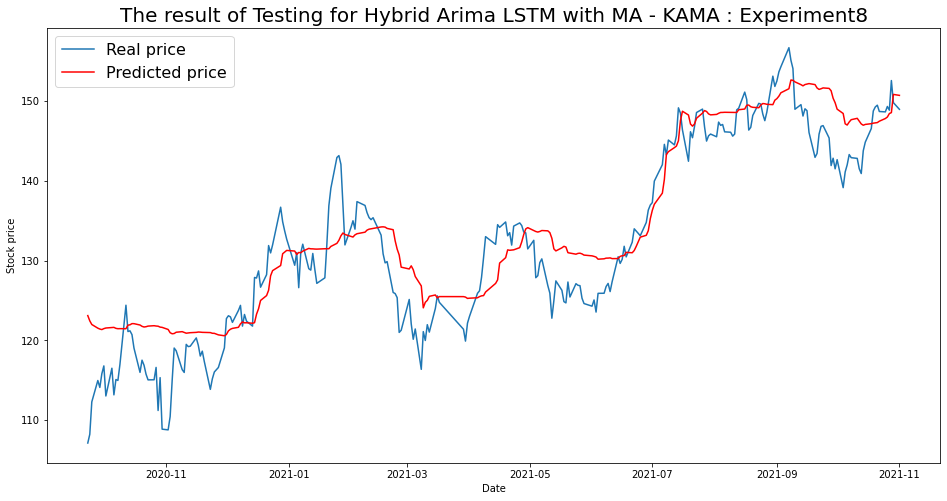

----- Test RMSE for KAMA----- 4.694565604625168
----- Test_MSE_LSTM for KAMA----- 22.038946216129663
----- Test_MAE_LSTM for KAMA----- 3.7548184287573756


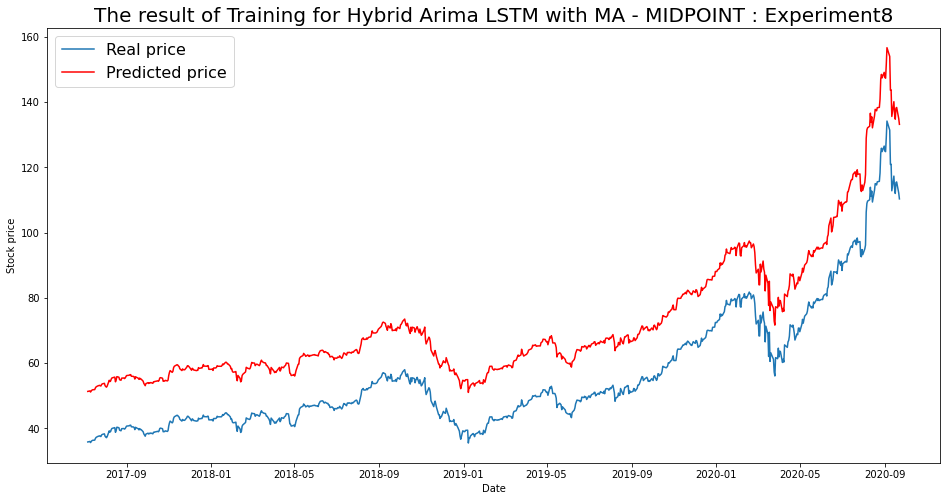

----- Train RMSE for MIDPOINT ----- 16.06235031499391
----- Train_MSE_LSTM for MIDPOINT ----- 257.999097641585
----- Train MAE LSTM for MIDPOINT ----- 15.981051393074564


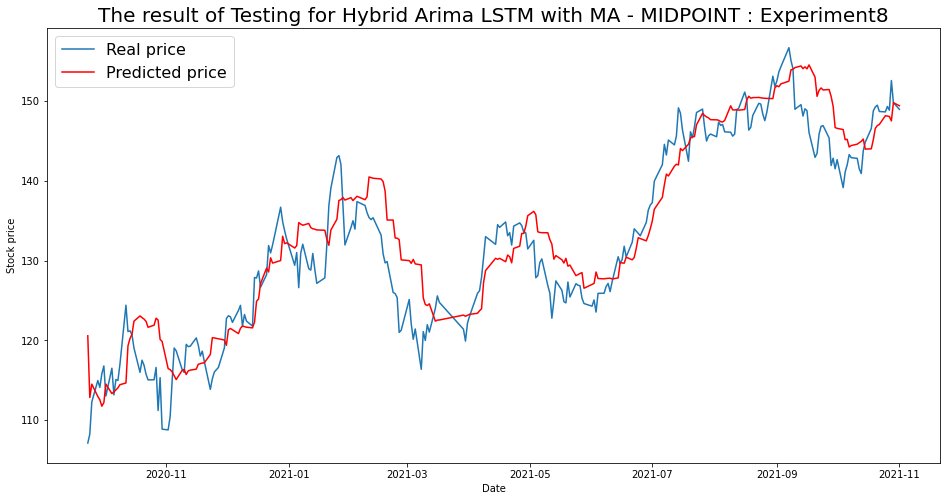

----- Test RMSE for MIDPOINT----- 4.298904276636815
----- Test_MSE_LSTM for MIDPOINT----- 18.4805779796863
----- Test_MAE_LSTM for MIDPOINT----- 3.422385888494848


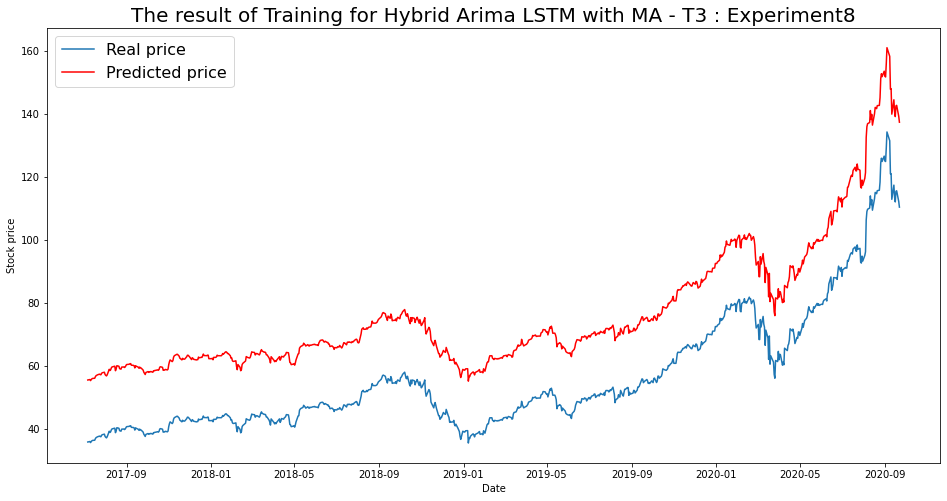

----- Train RMSE for T3 ----- 20.284725351435558
----- Train_MSE_LSTM for T3 ----- 411.47008258317237
----- Train MAE LSTM for T3 ----- 20.220124100694562


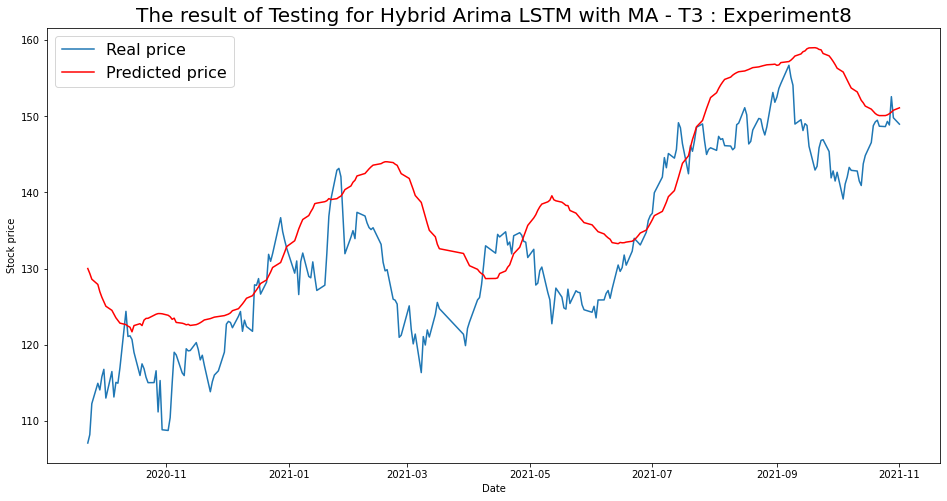

----- Test RMSE for T3----- 8.813596908808496
----- Test_MSE_LSTM for T3----- 77.67949047095865
----- Test_MAE_LSTM for T3----- 7.190279750268759


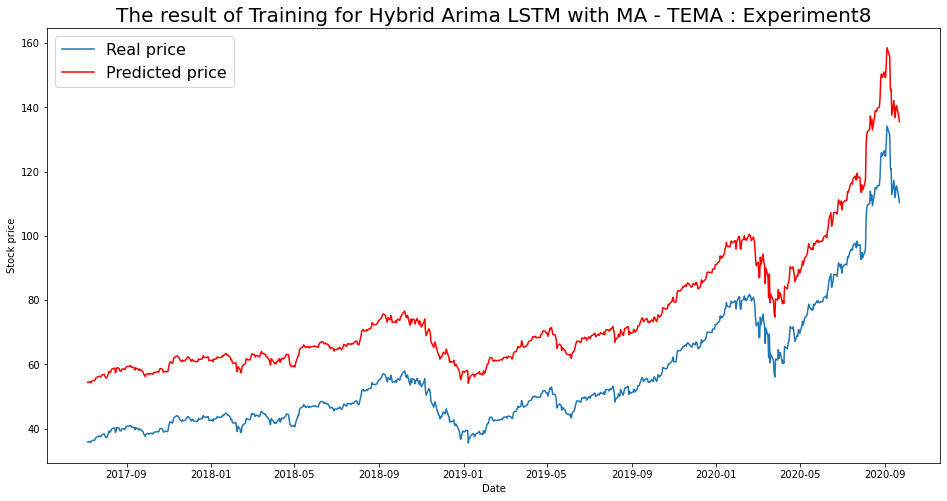

----- Train RMSE for TEMA ----- 18.95244476174229
----- Train_MSE_LSTM for TEMA ----- 359.19516244689277
----- Train MAE LSTM for TEMA ----- 18.91601826176785


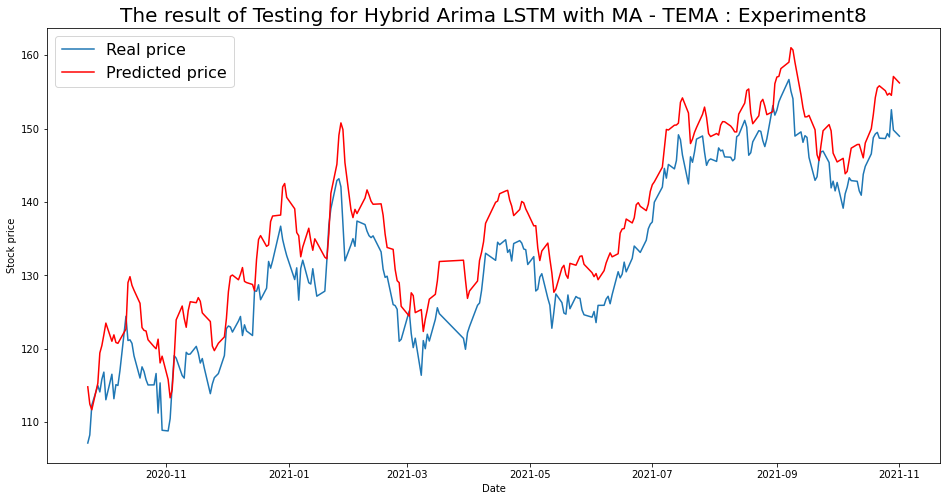

----- Test RMSE for TEMA----- 5.656001741438255
----- Test_MSE_LSTM for TEMA----- 31.990355699152573
----- Test_MAE_LSTM for TEMA----- 5.124316314221195


In [155]:
for i in range(len(list(simulation8.keys()))):
  SIM = list(simulation8.keys())[i]
  plot_train(simulation8,SIM)
  plot_test(simulation8,SIM)

## List of RMSE, MSE & MAE scores for Test data

In [137]:
import json
with open('simulation1_data.json') as json_file:
    simulation1 = json.load(json_file)

with open('simulation2_data.json') as json_file:
    simulation2 = json.load(json_file)

with open('simulation3_data.json') as json_file:
    simulation3 = json.load(json_file)

with open('simulation4_data.json') as json_file:
    simulation4 = json.load(json_file)

with open('simulation5_data.json') as json_file:
    simulation5 = json.load(json_file)

with open('simulation6_data.json') as json_file:
    simulation6 = json.load(json_file)

with open('simulation7_data.json') as json_file:
    simulation7 = json.load(json_file)

with open('simulation8_data.json') as json_file:
    simulation8 = json.load(json_file)

In [6]:
text = 'Stock with Sentiment '
simulations = [simulation1,simulation2,simulation3,simulation4,simulation5,simulation6,simulation7,simulation8]
for i,simulation in enumerate(simulations):
  for ma in simulation.keys():
    print(text+'Experiment ',i+1,' for MA :',ma,'the MSE  is: ',simulation[ma]['final']['mse'])
    print(text+'Experiment ',i+1,' for MA :',ma,'the RMSE is: ',simulation[ma]['final']['rmse'])
    print(text+'Experiment ',i+1,' for MA :',ma,'the MAE is: ',simulation[ma]['final']['mae'])

Stock with Sentiment Experiment  1  for MA : SMA the MSE  is:  39.29635655476263
Stock with Sentiment Experiment  1  for MA : SMA the RMSE is:  6.268680607174258
Stock with Sentiment Experiment  1  for MA : SMA the MAE is:  5.07416987111494
Stock with Sentiment Experiment  1  for MA : EMA the MSE  is:  30.25057164247689
Stock with Sentiment Experiment  1  for MA : EMA the RMSE is:  5.50005196725239
Stock with Sentiment Experiment  1  for MA : EMA the MAE is:  4.444486270049439
Stock with Sentiment Experiment  1  for MA : WMA the MSE  is:  64.92643731055051
Stock with Sentiment Experiment  1  for MA : WMA the RMSE is:  8.057694292448089
Stock with Sentiment Experiment  1  for MA : WMA the MAE is:  6.289003841800032
Stock with Sentiment Experiment  1  for MA : DEMA the MSE  is:  52.98651621196421
Stock with Sentiment Experiment  1  for MA : DEMA the RMSE is:  7.279183760008
Stock with Sentiment Experiment  1  for MA : DEMA the MAE is:  5.725540843661134
Stock with Sentiment Experiment  1

In [7]:
text = 'Stock with Sentiment Trends '
simulations = [simulation1,simulation2,simulation3,simulation4,simulation5,simulation6,simulation7,simulation8]
for i,simulation in enumerate(simulations):
  for ma in simulation.keys():
    # print(text+'Experiment ',i+1,' for MA :',ma,'the MSE  is: ',simulation[ma]['final']['mse'])
    print(text+'Experiment ',i+1,' for MA :',ma,'the RMSE is: ',simulation[ma]['final']['rmse'])
    # print(text+'Experiment ',i+1,' for MA :',ma,'the MAE is: ',simulation[ma]['final']['mae'])
  for ma in simulation.keys():
    print(text+'Experiment ',i+1,' for MA :',ma,'the MSE  is: ',simulation[ma]['final']['mse'])
    # print(text+'Experiment ',i+1,' for MA :',ma,'the RMSE is: ',simulation[ma]['final']['rmse'])
    # print(text+'Experiment ',i+1,' for MA :',ma,'the MAE is: ',simulation[ma]['final']['mae'])
  for ma in simulation.keys():
    # print(text+'Experiment ',i+1,' for MA :',ma,'the MSE  is: ',simulation[ma]['final']['mse'])
    # print(text+'Experiment ',i+1,' for MA :',ma,'the RMSE is: ',simulation[ma]['final']['rmse'])
    print(text+'Experiment ',i+1,' for MA :',ma,'the MAE is: ',simulation[ma]['final']['mae'])

Stock with Sentiment Trends Experiment  1  for MA : SMA the RMSE is:  6.268680607174258
Stock with Sentiment Trends Experiment  1  for MA : EMA the RMSE is:  5.50005196725239
Stock with Sentiment Trends Experiment  1  for MA : WMA the RMSE is:  8.057694292448089
Stock with Sentiment Trends Experiment  1  for MA : DEMA the RMSE is:  7.279183760008
Stock with Sentiment Trends Experiment  1  for MA : KAMA the RMSE is:  5.796783486223054
Stock with Sentiment Trends Experiment  1  for MA : MIDPOINT the RMSE is:  4.768795618921396
Stock with Sentiment Trends Experiment  1  for MA : T3 the RMSE is:  8.434809584670473
Stock with Sentiment Trends Experiment  1  for MA : TEMA the RMSE is:  5.158323598407468
Stock with Sentiment Trends Experiment  1  for MA : SMA the MSE  is:  39.29635655476263
Stock with Sentiment Trends Experiment  1  for MA : EMA the MSE  is:  30.25057164247689
Stock with Sentiment Trends Experiment  1  for MA : WMA the MSE  is:  64.92643731055051
Stock with Sentiment Trends E

## Create HTML

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
cd drive/MyDrive/Stock price prediction/Archana - LSTM Hybrid


/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction/Archana - LSTM Hybrid


In [169]:
%%shell
jupyter nbconvert --to html LSTM_Hybrid_using_TA_LIB_BullBear.ipynb

[NbConvertApp] Converting notebook LSTM_Hybrid_using_TA_LIB_BullBear.ipynb to html
[NbConvertApp] ERROR | Notebook JSON is invalid: Additional properties are not allowed (u'metadata' was unexpected)

Failed validating u'additionalProperties' in stream:

On instance[u'cells'][134][u'outputs'][0]:
{u'metadata': {u'tags': None},
 u'name': u'stdout',
 u'output_type': u'stream',
 u'text': u'SMA\nSMA([input_arrays], [timeperiod=30])\n\nSimple Moving Average (Overlap Studies)\n\nInputs:\n    price: (any ndarray)\nParameters:\n    timeperiod: 30\nOutputs:\n    real\n17\n\nWorking on SMA predictions\nparameters used :  808 269\nPerforming stepwise search to minimize aic\n ARIMA(1,3,1)(0,0,0)[0]             : AIC=-16999.786, Time=3.31 sec\n ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14568.592, Time=4.55 sec\n ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15578.394, Time=8.68 sec\n ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14566.592, Time=7.49 sec\n ARIMA(2,3,1)(0,0,0)[0]             : AIC=-16966.361,